In [3]:
import os
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
# import nglview as nv
from rdkit import Chem
from rdkit.Chem import Descriptors
from scipy.optimize import minimize
# import MDAnalysis as mda
# from MDAnalysis.transformations import wrap
import re
from scipy.stats import linregress
from PIL import Image
import pickle
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
def get_fit(A,B,extrap=40):
    m, b = np.polyfit(A, B, 1)
    dG_range = np.linspace(min(A) - extrap, max(A) + extrap)
    dG_proxy = m * dG_range + b
    return dG_range, dG_proxy, m, b


# errors: bcd-pfos: 0.44, bcd-sds: -1.92, bcd-tcaa: -1.3, F_prim_bcd-sds: 0.7, F_prim_bcd-pfos: 0.93

# errors: bcd-pfos: 0.44, bcd-sds: -1.92, bcd-tcaa: -1.3, F_prim_bcd-sds: 0.7, F_prim_bcd-pfos: 0.93

In [4]:
# plot settings
showPlots=1
useMagics=1
if useMagics:
    %matplotlib inline
    #%matplotlib notebook
    %load_ext autoreload
    %autoreload 2
    %reload_ext autoreload
    
font = {'weight' : 'normal',
        'size'   : 12}

plt.rc('font', **font)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### BO images

In [5]:
# dirs

In [6]:
os.chdir('/home/siddarthachar/pfos/gpr/publication/m3_nb/')
os.chdir('rigid_CD_gaff_kb_dg_only')
dirs = os.listdir()
jobs_ignore = ['F-side-bcd-sds','F-side-bcd-pfos',
               'F-both-bcd-sds','F-both-bcd-pfos',
               'F-prim-bcd-sds','F-prim-bcd-pfos',
               'acd-pfos','acd-sds','acd-tcaa',
               'bcd-pfos','bcd-sds','bcd-tcaa',
               'gcd-tcaa', 'common.files']
#'gcd-pfos','gcd-sds',
jobs = sorted([x for x in dirs if os.path.isdir(x) and 'kb_dg.npy' in os.listdir(x) and x not in jobs_ignore])
dG_label_dict = {}
# Kb_label_dict = {}
for j in jobs:
    print(j)
    if 'ddgcd' not in j: # added some placeholder directory - replace with the directory you want later
        os.chdir(j)
        if 'kb_dg.npy' in os.listdir():
            a=np.load('kb_dg.npy')
            dg_m = np.mean(a[2])
            final_std = np.sqrt(np.mean(a[3]**2 + (a[2] - dg_m)**2))
            if 'C_rigid' in j:
                j_temp = j.split('_C_rigid')[0]
                j = j_temp
            dG_label_dict[j] = [dg_m,final_std]
        os.chdir('../')
os.chdir('/home/siddarthachar/pfos/gpr/publication/m3_nb/')

00073-pfos
00073-sds
00076-pfos
00076-sds
00079-pfos
00079-sds
00405-pfos
00405-sds
00407-pfos
00407-sds
00418-pfos
00418-sds
00464-pfos
00464-sds
00487-pfos
00487-sds
00517-pfos
00517-sds
00523-pfos
00523-sds
00524-pfos
00524-sds
00525-pfos
00525-sds
00526-pfos
00526-sds
00527-pfos
00527-sds
00528-pfos
00528-sds
00531-pfos
00531-sds
00543-pfos
00543-sds
00544-pfos
00544-sds
00600-pfos
00600-sds
00620-pfos
00620-sds
00639-pfos
00639-sds
00700-pfos
00700-sds
00709-pfos
00709-sds
00713-pfos
00713-sds
00732-pfos
00732-sds
00737-pfos
00737-sds
00794-pfos
00794-sds
00795-pfos
00795-sds
00797-pfos
00797-sds
00806-pfos
00806-sds
Br-prim-bcd-pfos
Br-prim-gcd-pfos
Br-prim-gcd-sds
CBr3-prim-bcd-pfos
CBr3-prim-bcd-sds
CBr3-prim-gcd-pfos
CBr3-prim-gcd-sds
CCl-prim-bcd-pfos
CCl-prim-bcd-sds
CCl2CCl2CCl3-prim-bcd-pfos
CCl2CCl2CCl3-prim-bcd-sds
CCl2CCl3-prim-bcd-pfos
CCl2CCl3-prim-bcd-sds
CCl3-2-2-bcd-pfos
CCl3-2-2-bcd-sds
CCl3-2-bcd-pfos
CCl3-2-bcd-sds
CCl3-4-bcd-pfos
CCl3-4-bcd-sds
CCl3-prim-bcd-pf

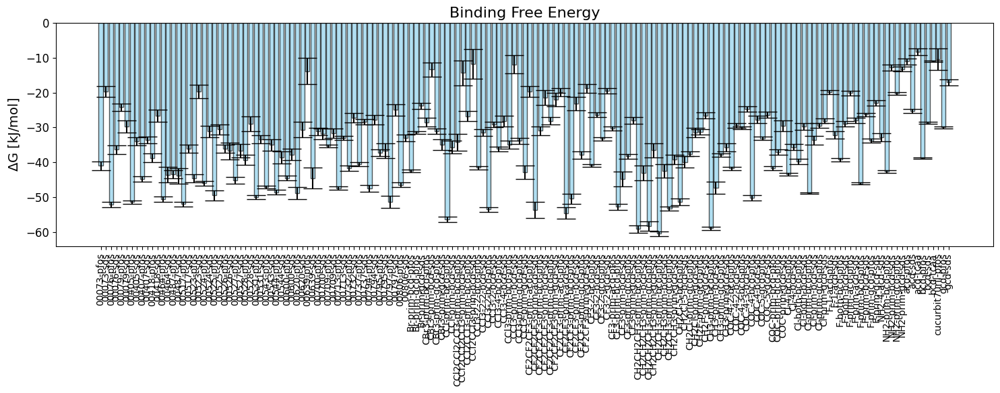

In [7]:
dG = [x[0] for x in dG_label_dict.values()]
err = [x[1] for x in dG_label_dict.values()]

# dG[-1] -=3

plt.figure(figsize=(15, 6))
plt.bar(
    list(dG_label_dict.keys()),  # X-axis labels
    dG,                         # Heights of bars
    yerr=err,                   # Error bars
    align='center',             # Align bars to the center of ticks
    alpha=0.65,                 # Transparency of bars
    ecolor='black',             # Color of error bars
    capsize=10,                 # Length of error bar caps
    color='skyblue',            # Bar color
    edgecolor='black'           # Edge color for bars
)

plt.ylabel(r'$\Delta$G [kJ/mol]', fontsize=14)
plt.xticks(list(dG_label_dict.keys()), rotation=90, fontsize=10)
plt.title('Binding Free Energy', fontsize=16)
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

In [8]:
# print(sorted_items)
# Selected systems
# selected = ['CF2CF2CF3-prim-bcd-pfos', 'CF2CF3-prim-bcd-pfos', 'CF3-prim-bcd-pfos',
#             'F-both-bcd-pfos', 'F-prim-bcd-pfos', 'acd-pfos', 'bcd-pfos']

def load_bias_potential(colvar_file):
    """
    Load the bias potential from the COLVAR file.
    Assumes the bias is in the last column.
    """
    data = np.loadtxt(colvar_file)
    # bias_potential # Assuming last column is the bias potential
    return data


dG_data = dG_label_dict.copy()

# Compute ΔΔG as ΔG_pfos - ΔG_sds
ddG_data = {}
# for key in selected:
#     sds_key = key.replace("pfos", "sds")
#     if sds_key in dG_data:
#         ddG_value = dG_data[key][0] - dG_data[sds_key][0]
#         ddG_error = (dG_data[key][1]**2 + dG_data[sds_key][1]**2) ** 0.5  # Error propagation
#         ddG_data[key] = [ddG_value, ddG_error]

# # Labels for the plot
# # sorted_labels = ['$CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #                  '$CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #                  '$F-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #                  '$F-\\mathrm{both} - \\beta\\mathrm{CD}$',
# #                  '$\\beta\\mathrm{CD}$',
# #                  '$CF_2CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #                  '$\\alpha\\mathrm{CD}$']

# # sorted_labels = [
# #     '$CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #     '$F-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #     '$CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #     '$CF_2CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
# #     '$\\beta\\mathrm{CD}$',
# #     '$F-\\mathrm{both} - \\beta\\mathrm{CD}$',
# #     '$\\alpha\\mathrm{CD}$'
# # ]

# # Sort data based on ΔΔG values
# sorted_items = sorted(ddG_data.items(), key=lambda x: x[1][0])  
# sorted_values = [v[0] for k, v in sorted_items]  # Extract sorted ΔΔG values
# sorted_errors = [v[1] for k, v in sorted_items]  # Extract sorted error bars

# # Create bar plot
# plt.figure(figsize=(10, 7))
# plt.barh(sorted_labels, sorted_values, edgecolor='black', xerr=sorted_errors, capsize=5, color='skyblue', alpha=0.7)
# plt.xlabel(r'$\Delta\Delta G$ (kJ/mol)', fontsize=16)
# plt.ylabel("Molecular Systems", fontsize=16)
# plt.title(r'$\Delta\Delta G$ of PFOS vs SDS Binding', fontsize=18)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)
# plt.gca().invert_yaxis()  # Invert to match conventional order
# plt.grid(axis='x', linestyle='--', alpha=0.6)
# plt.tight_layout()

# plt.show()
# print(dG_label_dict['CF3-prim-bcd-pfos'][0] - dG_label_dict['bcd-pfos'][0])

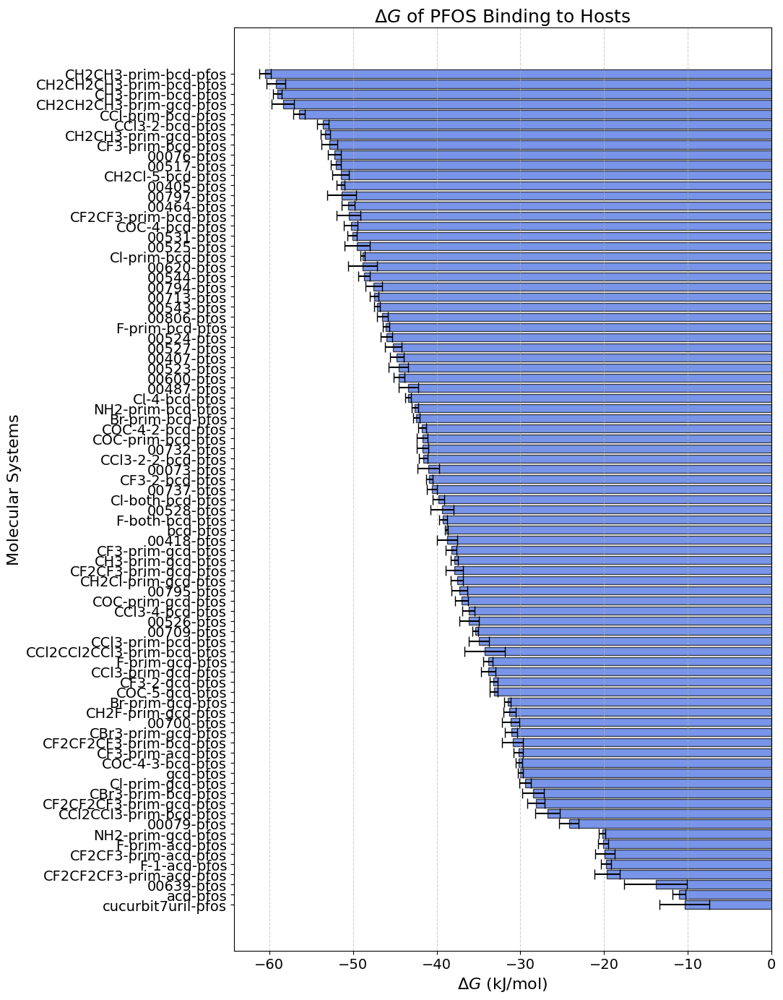

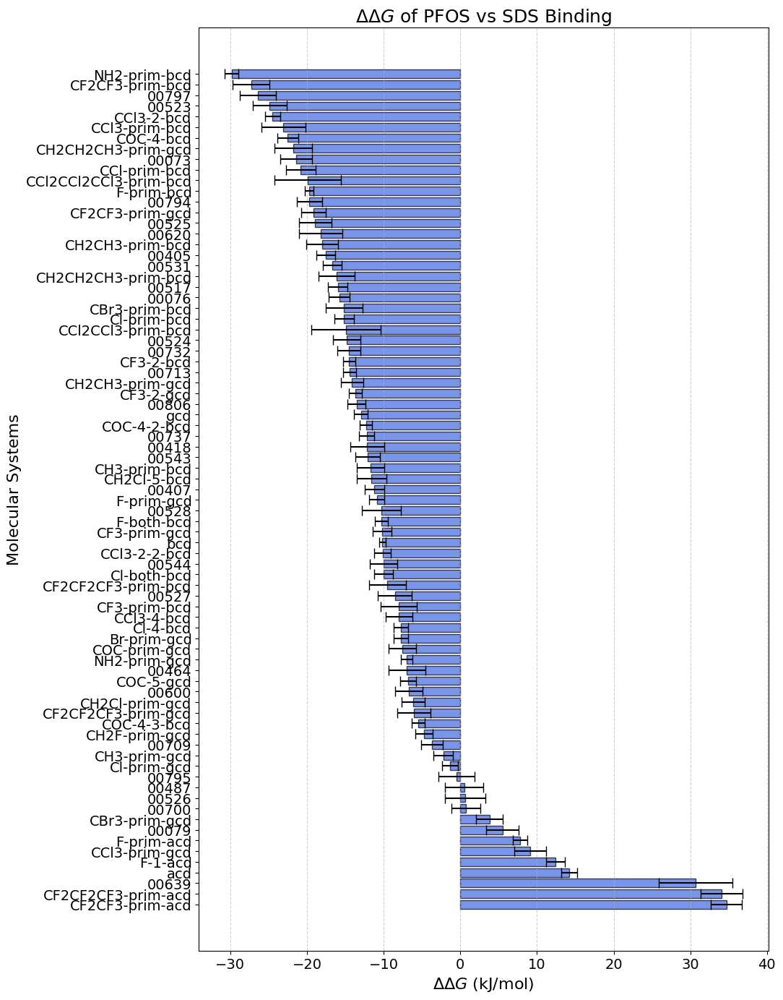

In [9]:
# selected = ['CF2CF2CF3-prim-bcd-pfos', 'CF2CF3-prim-bcd-pfos', 'CF3-prim-bcd-pfos',
#             'F-both-bcd-pfos', 'F-prim-bcd-pfos', 'acd-pfos','bcd-pfos']#,'cucurbit7uril-pfos']
# dG_label_dict_selected = {k: dG_label_dict[k] for k in selected}
# pfos_data = {k: v for k, v in dG_label_dict_selected.items() if 'pfos' in k}
# pfos_data = dG_label_dict_selected.copy()

# labels = ['$CF_2CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$F-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$F-\\mathrm{both} - \\beta\\mathrm{CD}$',
#             '$\\alpha\\mathrm{CD}$',
#             '$\\beta\\mathrm{CD}$',
#             '$\\mathrm{Cucurbit[7]uril}$'
#            ]
# labels_2 = ['$CF_2CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$F-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#             '$F-\\mathrm{both} - \\beta\\mathrm{CD}$',
#             '$\\alpha\\mathrm{CD}$',
#             '$\\beta\\mathrm{CD}$',
#             '$\\mathrm{Cucurbit[7]uril}$'
#            ]

# sorted_labels = ['$CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#                    '$CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#                    '$F-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#                    '$F-\\mathrm{both} - \\beta\\mathrm{CD}$',
#                    '$\\beta\\mathrm{CD}$',
#                    '$CF_2CF_2CF_3-\\mathrm{prim} - \\beta\\mathrm{CD}$',
#                    '$\\alpha\\mathrm{CD}$']
                  # '$\\mathrm{Cucurbit[7]uril}$']

# print(len(labels)), print(len(pfos_data))
values = [v[0] for v in dG_label_dict.values()]
errors = [v[1] for v in dG_label_dict.values()]
# print(sorted_items)
# Sort data based on ΔG values
sorted_items = sorted(dG_label_dict.items(), key=lambda x: x[1][0])  # Sort by ΔG value
sorted_labels = [k for k, v in sorted_items if 'pfos' in k]  # Format labels
sorted_values = [v[0] for k, v in sorted_items if 'pfos' in k]  # Extract sorted ΔG values
sorted_errors = [v[1] for k, v in sorted_items if 'pfos' in k]  # Extract sorted error bars

# Create bar plot
plt.figure(figsize=(11, 14))
plt.barh(sorted_labels, sorted_values,edgecolor='black', xerr=sorted_errors, capsize=5, color='royalblue', alpha=0.7)
plt.xlabel(r'$\Delta G$ (kJ/mol)', fontsize=16)
plt.ylabel("Molecular Systems", fontsize=16)
plt.title(r'$\Delta G$ of PFOS Binding to Hosts', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)  # Increase font size of y-axis labels
plt.gca().invert_yaxis()  # Invert to match conventional order
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()

plt.show()

ddG_data = {}
for key in sorted_labels:
    sds_key = key.replace("pfos", "sds")
    if sds_key in dG_data:
        ddG_value = dG_data[key][0] - dG_data[sds_key][0]
        ddG_error = (dG_data[key][1]**2 + dG_data[sds_key][1]**2) ** 0.5  # Error propagation
        ddG_data[key.split('-pfos')[0]] = [ddG_value, ddG_error]


ddG_sorted_items = sorted(ddG_data.items(), key=lambda x: x[1][0])  # Sort by ΔG value
ddG_sorted_labels = [k for k, v in ddG_sorted_items]  # Format labels
ddG_sorted_values = [v[0] for k, v in ddG_sorted_items]  # Extract sorted ΔG values
ddG_sorted_errors = [v[1] for k, v in ddG_sorted_items]  # Extract sorted error bars

# Create bar plot
plt.figure(figsize=(11, 14))
plt.barh(ddG_sorted_labels, ddG_sorted_values,edgecolor='black', xerr=ddG_sorted_errors, capsize=5, color='royalblue', alpha=0.7)
plt.xlabel(r'$\Delta\Delta G$ (kJ/mol)', fontsize=16)
plt.ylabel("Molecular Systems", fontsize=16)
plt.title(r'$\Delta\Delta G$ of PFOS vs SDS Binding', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)  # Increase font size of y-axis labels
plt.gca().invert_yaxis()  # Invert to match conventional order
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()

plt.show()


with open('ddG_data.pkl', 'wb') as f:
    pickle.dump(ddG_data, f)

with open('dG_data.pkl', 'wb') as f:
    pickle.dump(dG_label_dict, f)

chem_space_path = '/home/siddarthachar/pfos/gpr/pfos-working/data/chem_space.pkl'
with open(chem_space_path, 'rb') as f:
    chem_space = pickle.load(f)
# len(selected), len(dG_label_dict_selected), len
# {l:v for }
# [l,v for l in dG_label_dict]
# dG_label_dict_selected = {k: dG_label_dict[k] for k in selected}

In [10]:
# dG_data['bcd-pfos'], ddG_data['bcd']
# for k in dG_data.keys():
#     if dG_data[k][0] < dG_data['bcd-pfos'][0] and 'pfos' in k:
#         print(k)
# Print top 10 candidates by dG_md[0]
top_dG = sorted(
    [(x, -chem_space[x]['dG_md'][0]) for x in chem_space if chem_space[x]['dG_md'] is not None],
    key=lambda t: t[1], reverse=True
)[:10]
print("Top 10-20 by dG_md[0]:")
for label, val in top_dG:
    print(f"{label}: dG_md[0]={val}")

# Print top 10 candidates by ddG_md[0]
top_ddG = sorted(
    [(x, -chem_space[x]['ddG_md'][0]) for x in chem_space if chem_space[x]['ddG_md'] is not None],
    key=lambda t: t[1], reverse=True
)[:10]
print("\nTop 10-20 by ddG_md[0]:")
for label, val in top_ddG:
    print(f"{label}: ddG_md[0]={val}")

Top 10-20 by dG_md[0]:
00022: dG_md[0]=60.48284435711601
00020: dG_md[0]=59.20616134737421
00027: dG_md[0]=59.017395491738306
00021: dG_md[0]=58.37645068476684
00074: dG_md[0]=56.44471127513059
00006: dG_md[0]=53.60706737758805
00023: dG_md[0]=53.32024381074583
00018: dG_md[0]=52.829795746894
00076: dG_md[0]=52.19171488505847
00517: dG_md[0]=52.030449986648954

Top 10-20 by ddG_md[0]:
00041: ddG_md[0]=29.825862602460898
00014: ddG_md[0]=27.29386740810415
00797: ddG_md[0]=26.369370879891378
00523: ddG_md[0]=24.881429194211044
00006: ddG_md[0]=24.496163632009363
00008: ddG_md[0]=23.094818420519104
00029: ddG_md[0]=22.514119427541747
00021: ddG_md[0]=21.813714525645622
00073: ddG_md[0]=21.386061143879033
00074: ddG_md[0]=20.818399673310907


In [ ]:
        'CD': cd_type,
        'primary': data['primary'],
        'secondary': data['secondary'],
        'dG_md': data['dG'],
        'ddG_md': data['ddG'],
        'Kb_md': data['Kb'],
        'Kd_md': data['Kd'],
        'Kd_SDS/Kd_PFOS': data['Kd_ratio'],
        'delta_dG': compute_delta_dG(vina_pfos.get(f'{counter:05d}', None), data['dG']),
        'delta_ddG': compute_delta_ddG(vina_pfos.get(f'{counter:05d}', None), vina_sds.get(f'{counter:05d}', None), data['ddG']),
        'vina_pfos': vina_pfos.get(f'{counter:05d}', None),
        'vina_sds': vina_sds.get(f'{counter:05d}', None),

In [11]:
# #print out candidates that have better dG and ddG than bcd and sort them based on -dG and ddG values 
# top_dG = sorted(
#     [(x, -chem_space[x]['dG_md'][0]) for x in chem_space if chem_space[x]['dG_md'] is not None],
#     key=lambda t: t[1], reverse=True
# )[:10]
# print("Top 10 by dG_md[0]:")
# for label, val in top_dG:
#     print(f"{label}: dG_md[0]={val}")

# # Print top 10 candidates by ddG_md[0]
# top_ddG = sorted(
#     [(x, -chem_space[x]['ddG_md'][0]) for x in chem_space if chem_space[x]['ddG_md'] is not None],
#     key=lambda t: t[1], reverse=True
# )[:10]
# print("\nTop 10 by ddG_md[0]:")
# for label, val in top_ddG:
#     print(f"{label}: ddG_md[0]={val}")

# ddG_data, dG_data
# Top 10 by -dG_data[key][0]
top_dG_simple = sorted(
    [(k, -v[0]) for k, v in dG_label_dict.items()],
    key=lambda t: t[1], reverse=True
)[:10]
print("Top 10-20 by -dG_data[key][0]:")
for label, val in top_dG_simple:
    print(f"{label}: -dG = {val}")

# Top 10 by -ddG_data[key][0]
top_ddG_simple = sorted(
    [(k, -v[0]) for k, v in ddG_data.items()],
    key=lambda t: t[1], reverse=True
)[:10]
print("\nTop 10-20 by -ddG_data[key][0]:")
for label, val in top_ddG_simple:
    print(f"{label}: -ddG = {val}")

Top 10-20 by -dG_data[key][0]:
CH2CH3-prim-bcd-pfos: -dG = 60.48284435711601
CH2CH2CH3-prim-bcd-pfos: -dG = 59.20616134737421
CH3-prim-bcd-pfos: -dG = 59.017395491738306
CH2CH2CH3-prim-gcd-pfos: -dG = 58.37645068476684
CCl-prim-bcd-pfos: -dG = 56.44471127513059
CF2CF3-prim-acd-sds: -dG = 54.610595950028824
CF2CF2CF3-prim-acd-sds: -dG = 53.70627113435474
CCl3-2-bcd-pfos: -dG = 53.60706737758805
CH2CH3-prim-gcd-pfos: -dG = 53.32024381074583
CF3-prim-bcd-pfos: -dG = 52.829795746894

Top 10-20 by -ddG_data[key][0]:
NH2-prim-bcd: -ddG = 29.825862602460898
CF2CF3-prim-bcd: -ddG = 27.29386740810415
00797: -ddG = 26.369370879891378
00523: -ddG = 24.881429194211044
CCl3-2-bcd: -ddG = 24.496163632009363
CCl3-prim-bcd: -ddG = 23.094818420519104
COC-4-bcd: -ddG = 22.514119427541747
CH2CH2CH3-prim-gcd: -ddG = 21.813714525645622
00073: -ddG = 21.386061143879033
CCl-prim-bcd: -ddG = 20.818399673310907


In [12]:
# len(ddG_data)
# ddG_data
# bo_iter=[['CCl3-4-bcd','COC-5-gcd','CF3-2-bcd','COC-4-bcd'], # COC-prim-bcd-sds needs to be rerun
#  ['CCl3-2-2-bcd','COC-4-2-bcd','CCl-prim-bcd','COC-4-3-bcd']]
bo_iter=[ ['00525','00713','00709','00544','00464'],
 ['00523','00524','00076','00079'],
 ['00806','00517','00797','00528','00073'],
 ['00527', '00795', '00737', '00418', '00700'],
 ['00639', '00600', '00620', '00487', '00405'],
 ['00732', '00531', '00407', '00794', '00543'] ]
[dG_data[x+'-pfos'] for x in bo_iter[0]], [ddG_data[x] for x in bo_iter[0]]

([[-49.51358873415698, 1.4914123923321996],
  [-47.47021472545302, 0.5083972507599498],
  [-35.40229527586497, 0.36991225709842807],
  [-48.655951082081955, 0.6786876740353202],
  [-50.58204688891829, 0.7675472862310542]],
 [[-18.934051355063808, 2.116075452644694],
  [-14.471398992457978, 0.8352171387200786],
  [-3.716595861744999, 1.3908844794729203],
  [-10.04018457058703, 1.8066647284653201],
  [-6.963941033412503, 2.3729545798598175]])

In [13]:
ddG_data['COC-4-3-bcd']

[-5.482396135136064, 0.8638426407356405]

In [14]:
# scaler_dG.fit_transform([dG_data['bcd-pfos'][0]])
# # dG_vals
# all_mols.index('bcd'), dG_scaled[19]

In [15]:
# Set random seed for reproducibility
np.random.seed(42)

# Combine all BO iteration entries (or just use all ddG keys)
all_mols = list(set(ddG_data.keys()))

# Get dG and ddG values (sign flipped so higher = better)
dG_vals = np.array([-dG_data[x + '-pfos'][0] for x in all_mols]).reshape(-1, 1)
ddG_vals = np.array([-ddG_data[x][0] for x in all_mols]).reshape(-1, 1)

# Normalize
scaler_dG = StandardScaler()
scaler_ddG = StandardScaler()
dG_scaled = scaler_dG.fit_transform(dG_vals).flatten()
ddG_scaled = scaler_ddG.fit_transform(ddG_vals).flatten()

baseline_dG = dG_scaled[all_mols.index('bcd')] # using bcd as baseline
baseline_ddG = ddG_scaled[all_mols.index('bcd')] # using bcd as baseline

# baseline_dG = 0
# baseline_ddG = 0

# Sample weights from Dirichlet distribution for random scalarization
weights = np.random.dirichlet([1, 1])
w1, w2 = weights[0], weights[1]

print(f"Random scalarization weights: w1 = {w1:.3f}, w2 = {w2:.3f}")

# Compute scores using the sampled weights
scores = {
    mol: w1 * (dG_scaled[i]-baseline_dG) + w2 * (ddG_scaled[i]-baseline_ddG)
    for i, mol in enumerate(all_mols)
}

Random scalarization weights: w1 = 0.135, w2 = 0.865


In [16]:
# # Set random seed for reproducibility
# np.random.seed(42)

# # Combine all BO iteration entries (or just use all ddG keys)
# all_mols = list(set(ddG_data.keys()))

# # Get dG and ddG values (sign flipped so higher = better)
# dG_vals = np.array([-dG_data[x + '-pfos'][0] for x in all_mols]).reshape(-1, 1)
# ddG_vals = np.array([-ddG_data[x][0] for x in all_mols]).reshape(-1, 1)

# # Normalize
# # scaler_dG = StandardScaler()
# # scaler_ddG = StandardScaler()
# # dG_scaled = scaler_dG.fit_transform(dG_vals).flatten()
# # ddG_scaled = scaler_ddG.fit_transform(ddG_vals).flatten()

# baseline_dG = dG_vals[all_mols.index('bcd')][0] # using bcd as baseline
# baseline_ddG = ddG_vals[all_mols.index('bcd')][0] # using bcd as baseline

# # baseline_dG = 0
# # baseline_ddG = 0

# # Sample weights from Dirichlet distribution for random scalarization
# weights = np.random.dirichlet([1, 1])
# # w1, w2 = weights[0], weights[1]
# w1, w2 = 1, 1

# print(f"Random scalarization weights: w1 = {w1:.3f}, w2 = {w2:.3f}")

# # Compute scores using the sampled weights
# scores = {
#     mol: w1 * (dG_vals[i][0]-baseline_dG) + w2 * (ddG_vals[i][0]-baseline_ddG)
#     for i, mol in enumerate(all_mols)
# }

In [17]:
# scores['00794']
# baseline_ddG, baseline_dG
# dG_data['bcd-pfos']
# bo_scores
# bo_scores
# scores['NH2-prim-bcd']
# dG_vals
# dG_scaled
# dG_vals.T[0]

In [18]:
bo_set = set([x for iter_ in bo_iter for x in iter_])
pre_bo = [x for x in dG_data if x.replace('-pfos','') not in bo_set]

# Get pre-BO scores - scaled
pre_bo_scores = [(x.replace('-pfos',''), (w1*(dG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_dG) + w2*(ddG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_ddG)))
                 for x in pre_bo if x.replace('-pfos','') in all_mols]

# pre_bo_scores = [(x.replace('-pfos',''), (w1*(dG_vals.T[0][all_mols.index(x.replace('-pfos',''))]-baseline_dG) + w2*(ddG_vals.T[0][all_mols.index(x.replace('-pfos',''))]-baseline_ddG)))
#                  for x in pre_bo if x.replace('-pfos','') in all_mols]

# Get scores per BO iteration
bo_scores = [
    [(x, scores[x]) for x in iter_] for iter_ in bo_iter
]

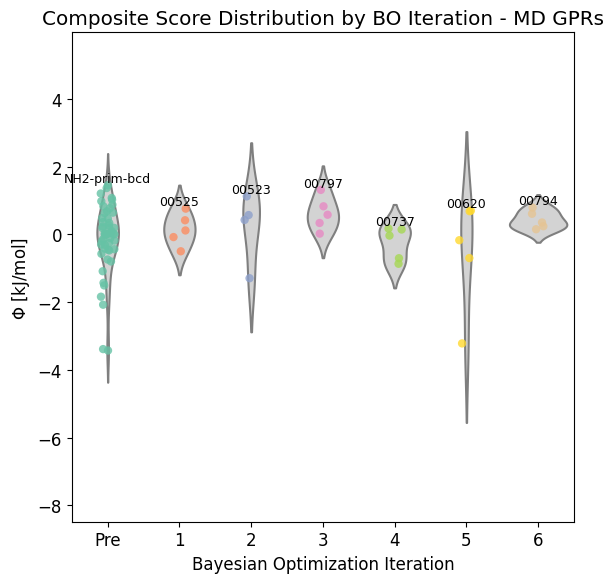

In [19]:
# Combine into a dataframe
data = []

# Pre-BO
for x, s in pre_bo_scores:
    data.append({'iteration': 'Pre', 'score': s, 'label': x})

# BO rounds
for i, round_ in enumerate(bo_scores):
    for x, s in round_:
        data.append({'iteration': f'{i+1}', 'score': s, 'label': x})

df = pd.DataFrame(data)

# Violin (guitar) plot
plt.figure(figsize=(6,6))
sns.violinplot(data=df, x='iteration', y='score', inner=None, color='lightgray', linewidth=1.5)

# Overlay points from selected molecules
sns.stripplot(data=df, x='iteration', y='score', hue='iteration', dodge=False, size=6, palette='Set2', alpha=0.8)

plt.title('Composite Score Distribution by BO Iteration - MD GPRs')
plt.ylabel(r'$\Phi$ [kJ/mol]')
plt.xlabel('Bayesian Optimization Iteration')
plt.legend([],[], frameon=False)  # remove legend if not needed
for i, iter_name in enumerate(df['iteration'].unique()):
    sub = df[df['iteration'] == iter_name]
    top = sub.nlargest(1, 'score')
    for _, row in top.iterrows():
        plt.text(i, row['score'] + 0.1, row['label'], ha='center', fontsize=9)
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.ylim(ymin-2.5, ymax + 2.5)  # Add extra headroom (adjust 0.5 as needed)
plt.show()

In [20]:
bo_iter_md=[ ['COC-5-gcd','CF3-2-bcd','CCl3-4-bcd'],
 ['CCl3-2-2-bcd','COC-4-2-bcd','COC-4-3-bcd']] #'CCl-prim-bcd'
print([dG_data[x+'-pfos'] for x in bo_iter_md[0]], [ddG_data[x] for x in bo_iter_md[0]])
bo_set_md = set([x for iter_ in bo_iter_md for x in iter_])
pre_bo_md = [x for x in dG_data if x.replace('-pfos','') not in bo_set_md]

# Get pre-BO scores - scaled
pre_bo_scores_md = [(x.replace('-pfos',''), (w1*(dG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_dG) + w2*(ddG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_ddG)))
                 for x in pre_bo_md if x.replace('-pfos','') in all_mols]

# pre_bo_scores = [(x.replace('-pfos',''), (w1*(dG_vals.T[0][all_mols.index(x.replace('-pfos',''))]-baseline_dG) + w2*(ddG_vals.T[0][all_mols.index(x.replace('-pfos',''))]-baseline_ddG)))
#                  for x in pre_bo if x.replace('-pfos','') in all_mols]

# Get scores per BO iteration
bo_scores_md = [
    [(x, scores[x]) for x in iter_] for iter_ in bo_iter_md
]

[[-33.16845550001868, 0.49201192817023975], [-40.878230596030036, 0.3889810584856904], [-36.17367386345123, 0.741513544612754]] [[-6.792738495160073, 1.0233192968008369], [-14.50769045847587, 0.8017320947733174], [-8.002887246741938, 1.7624609949460293]]


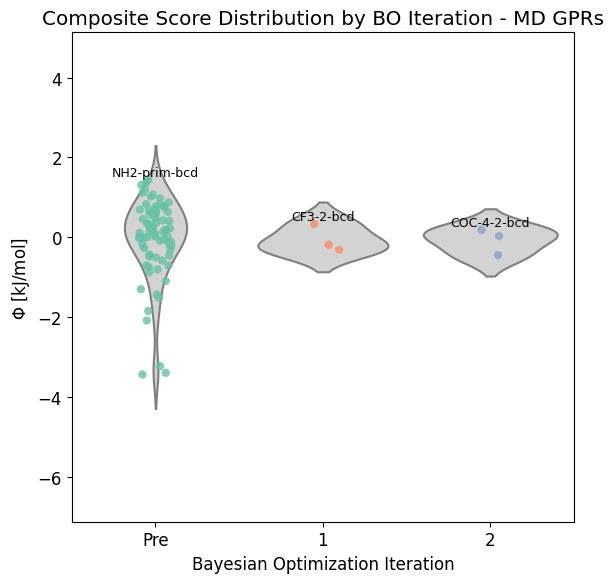

In [21]:
# Combine into a dataframe
data_md = []

# Pre-BO
for x, s in pre_bo_scores_md:
    data_md.append({'iteration': 'Pre', 'score': s, 'label': x})

# BO rounds
for i, round_ in enumerate(bo_scores_md):
    for x, s in round_:
        data_md.append({'iteration': f'{i+1}', 'score': s, 'label': x})

df_md = pd.DataFrame(data_md)

# Violin (guitar) plot
plt.figure(figsize=(6,6))
sns.violinplot(data=df_md, x='iteration', y='score', inner=None, color='lightgray', linewidth=1.5)

# Overlay points from selected molecules
sns.stripplot(data=df_md, x='iteration', y='score', hue='iteration', dodge=False, size=6, palette='Set2', alpha=0.8)

plt.title('Composite Score Distribution by BO Iteration - MD GPRs')
plt.ylabel(r'$\Phi$ [kJ/mol]')
plt.xlabel('Bayesian Optimization Iteration')
plt.legend([],[], frameon=False)  # remove legend if not needed
for i, iter_name in enumerate(df_md['iteration'].unique()):
    sub = df_md[df_md['iteration'] == iter_name]
    top = sub.nlargest(1, 'score')
    for _, row in top.iterrows():
        plt.text(i, row['score'] + 0.1, row['label'], ha='center', fontsize=9)
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.ylim(ymin-2.5, ymax + 2.5)  # Add extra headroom (adjust 0.5 as needed)
plt.show()

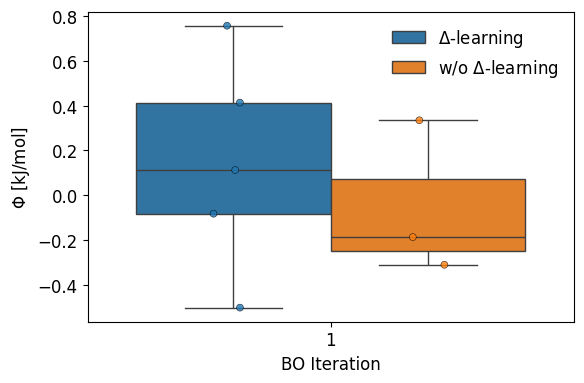

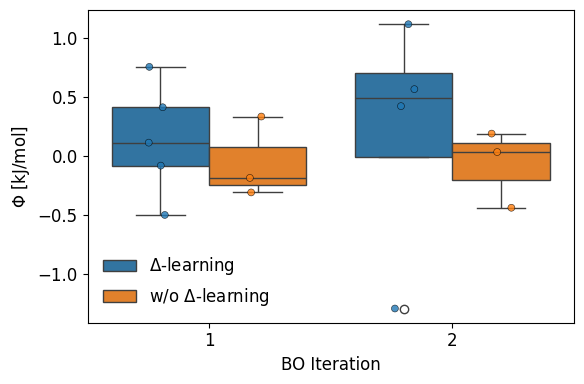

In [22]:
import pandas as _pd

bo_scores_2 = []
bo_scores_2_md = []
for x, x_md in zip(bo_scores[0:2], bo_scores_md[0:2]):
    bo_scores_2.append([a[1] for a in x])
    bo_scores_2_md.append([a[1] for a in x_md])

    # build comparison dataframe and plot

    rows = []
    for i, sc_list in enumerate(bo_scores_2, start=1):
        for s in sc_list:
            rows.append({'iteration': str(i), 'score': s, 'source': f'$\Delta$-learning'})
    for i, sc_list in enumerate(bo_scores_2_md, start=1):
        for s in sc_list:
            rows.append({'iteration': str(i), 'score': s, 'source': 'w/o $\Delta$-learning'})

    df_comp = _pd.DataFrame(rows)

    fig, ax = plt.subplots(figsize=(6,4))
    sns.boxplot(data=df_comp, x='iteration', y='score', hue='source', palette=['C0','C1'], ax=ax)
    sns.stripplot(data=df_comp, x='iteration', y='score', hue='source', palette=['C0','C1'],
                  dodge=True, edgecolor='k', linewidth=0.4, alpha=0.8, ax=ax)

    # keep single legend
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2], frameon=False)
    # ax.set_title('BO (GPR) vs MD composite scores — iterations 1 & 2')
    ax.set_ylabel(r'$\Phi$ [kJ/mol]')
    ax.set_xlabel('BO Iteration')
    plt.tight_layout()
    plt.savefig('delta-learning_compare.png',dpi=400)
    plt.show()

In [23]:
# fraction of samples greater that are more sensitive than beta-CD
# df_cum
# --- existing code ---
# Combine into a dataframe
data = []

# Pre-BO
for x, s in pre_bo_scores:
    data.append({'iteration': 'Pre', 'score': s, 'label': x, 'dG': -dG_data[f'{x}-pfos'][0], 'ddG': -ddG_data[f'{x}'][0]})

# BO rounds
for i, round_ in enumerate(bo_scores):
    for x, s in round_:
        data.append({'iteration': f'{i+1}', 'score': s, 'label': x, 'dG': -dG_data[f'{x}-pfos'][0], 'ddG': -ddG_data[f'{x}'][0]})

df = pd.DataFrame(data)

# --- NEW: build cumulative dataframe for violins ---
# Preserve the intended order (as they appear in df)
iter_order = pd.Categorical(df['iteration'], categories=df['iteration'].unique(), ordered=True)
df['iteration'] = iter_order

cum_frames = []
seen = []
for it in iter_order.categories:
    seen.append(it)
    cum_sub = df[df['iteration'].isin(seen)].copy()
    cum_sub['iteration_cum'] = it  # tag the x-bin with the *current* iteration name
    cum_frames.append(cum_sub)

df_cum = pd.concat(cum_frames, ignore_index=True)
df_cum['iteration_cum'] = pd.Categorical(df_cum['iteration_cum'], categories=iter_order.categories, ordered=True)

/tmp/ipykernel_4169664/1453799184.py:9: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_4169664/1453799184.py:9: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


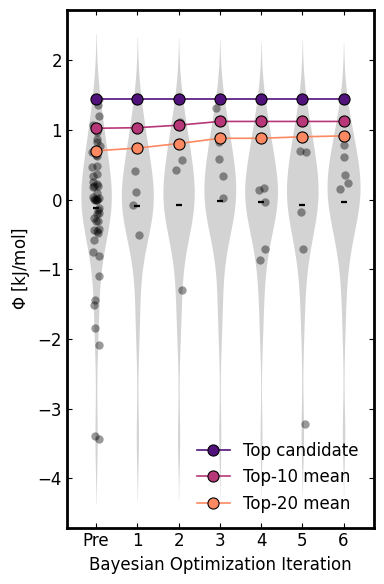

In [24]:
# Violin (guitar) plot using cumulative distributions
fig, ax = plt.subplots(figsize=(4,6))  # <-- get fig/ax so we can edit spines

sns.violinplot(
    data=df_cum, x='iteration_cum', y='score',
    inner=None, color='lightgrey', linewidth=0, ax=ax
)

sns.pointplot(
    data=df_cum, x='iteration_cum', y='score',
    estimator=np.mean,  # <-- show the mean
    color='black',      # <-- mean as black dots/line
    join=False,         # <-- no connecting line
    markers='_', scale=0.8, errorbar=None, ax=ax
)

# Overlay points from selected molecules (still uses per-iteration selections)
sns.stripplot(data=df, x='iteration', y='score', dodge=False, size=6, color='black', alpha=0.4, ax=ax)

# --- Top-k cumulative means ---
k_list = [1, 10, 20]
cats = df_cum['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Compute top-k means for each k
topk_means_dict = {}
for k in k_list:
    means = []
    for it in cats:
        sub = df_cum[df_cum['iteration_cum'] == it]['score']
        kk = min(k, len(sub))
        means.append(sub.nlargest(kk).mean() if kk > 0 else np.nan)
    topk_means_dict[k] = means

# nicer, readable palette (color-blind friendly)
palette = sns.color_palette("magma", n_colors=len(k_list))

# Plot each line on top of the violin plot
legend_handles = []
legend_labels = []
for idx, (k, means) in enumerate(topk_means_dict.items()):
    lbl = "Top candidate" if k == 1 else f"Top-{k} mean"
    h, = ax.plot(
        x_pos, means,
        marker='o', linestyle='-', linewidth=1.2, markersize=8,
        color=palette[idx],
        label=lbl, zorder=5,
        markeredgecolor='black',        # black edge
        markeredgewidth=0.8,            # edge thickness
    )
    legend_handles.append(h)
    legend_labels.append(lbl)

# Titles / labels
# ax.set_title('Composite Score by BO Iteration')
ax.set_ylabel(r'$\Phi$ [kJ/mol]')
ax.set_xlabel('Bayesian Optimization Iteration')

# Thicken the plot borders (spines)
for side in ax.spines.values():
    side.set_linewidth(2.0)

# Ticks and limits
ax.tick_params(direction='in', right=True, top=True)
ymin, ymax = ax.get_ylim()
# ax.set_ylim(ymin - 0.75, ymax + 0.75)

# Move legend to bottom, flat row
# Leave extra bottom margin so it doesn't get clipped
ax.legend(frameon=False)
#     handles=legend_handles, labels=legend_labels,
#     frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.12),
#     ncol=len(k_list), handlelength=2.0, columnspacing=1.2
# )
plt.tight_layout()  # add bottom space for the legend

# plt.show()
# plt.savefig('/project2/andrewferguson/sachar/test/Images/BO-iters.png',dpi=600)

(0.5, 1.5)

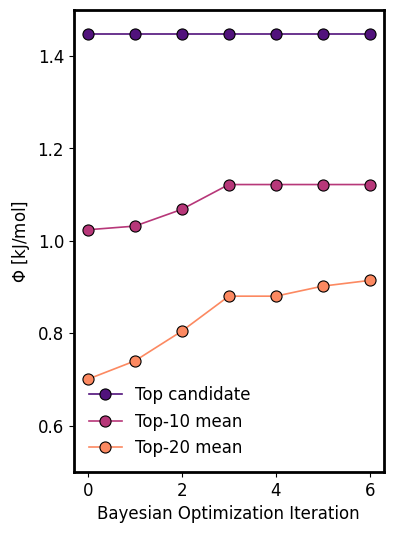

In [25]:
fig, ax = plt.subplots(figsize=(4,6))  # <-- get fig/ax so we can edit spines

# --- Top-k cumulative means ---
k_list = [1, 10, 20]
cats = df_cum['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Compute top-k means for each k
topk_means_dict = {}
for k in k_list:
    means = []
    for it in cats:
        sub = df_cum[df_cum['iteration_cum'] == it]['score']
        kk = min(k, len(sub))
        means.append(sub.nlargest(kk).mean() if kk > 0 else np.nan)
    topk_means_dict[k] = means

# nicer, readable palette (color-blind friendly)
palette = sns.color_palette("magma", n_colors=len(k_list))

# Plot each line on top of the violin plot
legend_handles = []
legend_labels = []
for idx, (k, means) in enumerate(topk_means_dict.items()):
    lbl = "Top candidate" if k == 1 else f"Top-{k} mean"
    h, = ax.plot(
        x_pos, means,
        marker='o', linestyle='-', linewidth=1.2, markersize=8,
        color=palette[idx],
        label=lbl, zorder=5,
        markeredgecolor='black',        # black edge
        markeredgewidth=0.8,            # edge thickness
    )
    legend_handles.append(h)
    legend_labels.append(lbl)
for side in ax.spines.values():
    side.set_linewidth(2.0)
# Titles / labels
# ax.set_title('Composite Score by BO Iteration')
ax.set_ylabel(r'$\Phi$ [kJ/mol]')
ax.set_xlabel('Bayesian Optimization Iteration')
ax.legend(frameon=False)
ax.set_ylim(0.5,1.5)
    # handles=legend_handles, labels=legend_labels,
    # frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.12),
    # ncol=len(k_list), handlelength=2.0, columnspacing=1.2
# )

/tmp/ipykernel_4169664/3629347175.py:43: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_4169664/3629347175.py:43: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


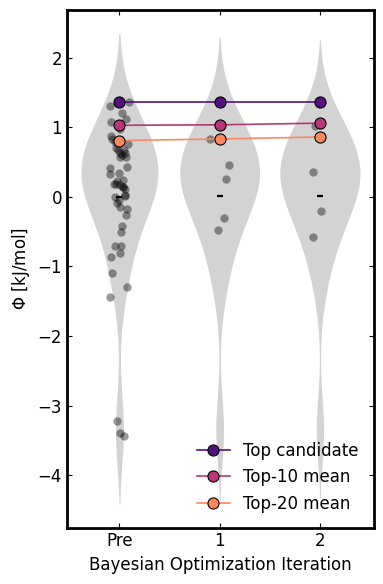

In [26]:
# this is for MD only
# fraction of samples greater that are more sensitive than beta-CD
# df_cum
# --- existing code ---
# Combine into a dataframe
data_md= []

# Pre-BO
for x, s in pre_bo_scores_md:
    data_md.append({'iteration': 'Pre', 'score': s, 'label': x, 'dG': -dG_data[f'{x}-pfos'][0], 'ddG': -ddG_data[f'{x}'][0]})

# BO rounds
for i, round_ in enumerate(bo_scores_md):
    for x, s in round_:
        data_md.append({'iteration': f'{i+1}', 'score': s, 'label': x, 'dG': -dG_data[f'{x}-pfos'][0], 'ddG': -ddG_data[f'{x}'][0]})

df_md = pd.DataFrame(data_md)

# --- NEW: build cumulative dataframe for violins ---
# Preserve the intended order (as they appear in df)
iter_order_md = pd.Categorical(df['iteration'], categories=df_md['iteration'].unique(), ordered=True)
df_md['iteration'] = iter_order_md

cum_frames = []
seen = []
for it in iter_order_md.categories:
    seen.append(it)
    cum_sub = df_md[df_md['iteration'].isin(seen)].copy()
    cum_sub['iteration_cum'] = it  # tag the x-bin with the *current* iteration name
    cum_frames.append(cum_sub)

df_cum_md = pd.concat(cum_frames, ignore_index=True)
df_cum_md['iteration_cum'] = pd.Categorical(df_cum_md['iteration_cum'], categories=iter_order_md.categories, ordered=True)

# Violin (guitar) plot using cumulative distributions
fig, ax = plt.subplots(figsize=(4,6))  # <-- get fig/ax so we can edit spines

sns.violinplot(
    data=df_cum_md, x='iteration_cum', y='score',
    inner=None, color='lightgrey', linewidth=0, ax=ax
)

sns.pointplot(
    data=df_cum_md, x='iteration_cum', y='score',
    estimator=np.mean,  # <-- show the mean
    color='black',      # <-- mean as black dots/line
    join=False,         # <-- no connecting line
    markers='_', scale=0.8, errorbar=None, ax=ax
)

# Overlay points from selected molecules (still uses per-iteration selections)
sns.stripplot(data=df_md, x='iteration', y='score', dodge=False, size=6, color='black', alpha=0.4, ax=ax)

# --- Top-k cumulative means ---
k_list = [1, 10, 20]
cats = df_cum_md['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Compute top-k means for each k
topk_means_dict_md = {}
for k in k_list:
    means = []
    for it in cats:
        sub = df_cum_md[df_cum_md['iteration_cum'] == it]['score']
        kk = min(k, len(sub))
        means.append(sub.nlargest(kk).mean() if kk > 0 else np.nan)
    topk_means_dict_md[k] = means

# nicer, readable palette (color-blind friendly)
palette = sns.color_palette("magma", n_colors=len(k_list))

# Plot each line on top of the violin plot
legend_handles = []
legend_labels = []
for idx, (k, means) in enumerate(topk_means_dict_md.items()):
    lbl = "Top candidate" if k == 1 else f"Top-{k} mean"
    h, = ax.plot(
        x_pos, means,
        marker='o', linestyle='-', linewidth=1.2, markersize=8,
        color=palette[idx],
        label=lbl, zorder=5,
        markeredgecolor='black',        # black edge
        markeredgewidth=0.8,            # edge thickness
    )
    legend_handles.append(h)
    legend_labels.append(lbl)

# Titles / labels
# ax.set_title('Composite Score by BO Iteration')
ax.set_ylabel(r'$\Phi$ [kJ/mol]')
ax.set_xlabel('Bayesian Optimization Iteration')

# Thicken the plot borders (spines)
for side in ax.spines.values():
    side.set_linewidth(2.0)

# Ticks and limits
ax.tick_params(direction='in', right=True, top=True)
ymin, ymax = ax.get_ylim()
# ax.set_ylim(ymin - 0.75, ymax + 0.75)

# Move legend to bottom, flat row
# Leave extra bottom margin so it doesn't get clipped
ax.legend(frameon=False)
#     handles=legend_handles, labels=legend_labels,
#     frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.12),
#     ncol=len(k_list), handlelength=2.0, columnspacing=1.2
# )
plt.tight_layout()  # add bottom space for the legend

# plt.show()
# plt.savefig('/project2/andrewferguson/sachar/test/Images/BO-iters.png',dpi=600)

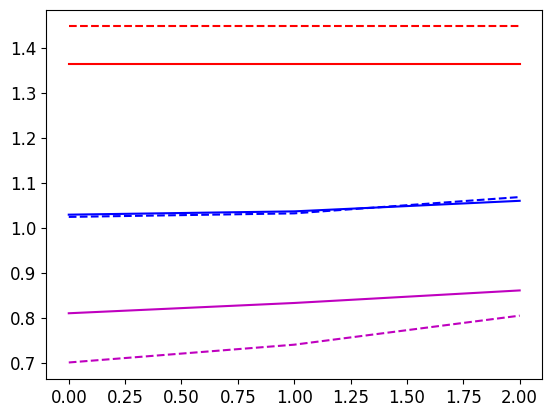

In [27]:
# df_cum_md

# topk_means_dict_md, topk_means_dict
plt.plot(topk_means_dict_md[1], 'r')
plt.plot(topk_means_dict[1][:3], 'r--')

plt.plot(topk_means_dict_md[10], 'b')
plt.plot(topk_means_dict[10][:3], 'b--')

plt.plot(topk_means_dict_md[20], 'm')
plt.plot(topk_means_dict[20][:3], 'm--')


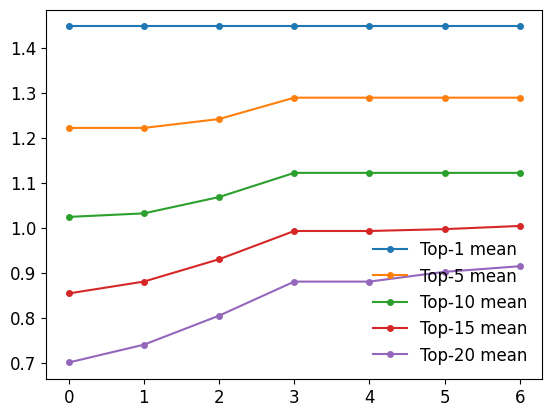

In [28]:
# Define the top-k sets we want to track
k_list = [1, 5, 10, 15, 20]
cats = df_cum['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Compute top-k means for each k
topk_means_dict = {}
for k in k_list:
    means = []
    for it in cats:
        sub = df_cum[df_cum['iteration_cum'] == it]['score']
        kk = min(k, len(sub))
        if kk > 0:
            means.append(sub.nlargest(kk).mean())
        else:
            means.append(np.nan)
    topk_means_dict[k] = means

# Plot each line on top of the violin plot
for k, means in topk_means_dict.items():
    plt.plot(
        x_pos, means,
        marker='o', linestyle='-', linewidth=1.5, markersize=4,
        label=f'Top-{k} mean'
    )

plt.legend(frameon=False, loc='best')

In [29]:
# for the pareto plot
bo_set = set([x for iter_ in bo_iter for x in iter_])
pre_bo = [x for x in dG_data if x.replace('-pfos','') not in bo_set]

# Get pre-BO scores - scaled
# pre_bo_scores = [(x.replace('-pfos',''), (w1*(dG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_dG) + w2*(ddG_scaled[all_mols.index(x.replace('-pfos',''))]-baseline_ddG)))
#                  for x in pre_bo if x.replace('-pfos','') in all_mols]

pre_bo_scores_act_dG = [(x.replace('-pfos',''), ((dG_vals.T[0][all_mols.index(x.replace('-pfos',''))])))
                 for x in pre_bo if x.replace('-pfos','') in all_mols]

pre_bo_scores_act_ddG = [(x.replace('-pfos',''), ((ddG_vals.T[0][all_mols.index(x.replace('-pfos',''))])))
                 for x in pre_bo if x.replace('-pfos','') in all_mols]

# Get scores per BO iteration
bo_scores_act_dG = [
    [(x, -dG_data[x+'-pfos'][0]) for x in iter_] for iter_ in bo_iter
]

bo_scores_act_ddG = [
    [(x, -ddG_data[x][0]) for x in iter_] for iter_ in bo_iter
]

In [30]:
# pre_bo_scores_act_ddG
# bo_iter, dG_data
# bo_scores_act_dG
# [
#     [(x, dG_data[x+'-pfos']) for x in iter_] for iter_ in bo_iter
# ]

bo_scores_act_dG

[[('00525', 49.51358873415698),
  ('00713', 47.47021472545302),
  ('00709', 35.40229527586497),
  ('00544', 48.655951082081955),
  ('00464', 50.58204688891829)],
 [('00523', 44.577914004294335),
  ('00524', 46.01887208470046),
  ('00076', 52.19171488505847),
  ('00079', 24.1934030248123)],
 [('00806', 46.48211554652879),
  ('00517', 52.030449986648954),
  ('00797', 51.3493011725278),
  ('00528', 39.35602579764595),
  ('00073', 41.01170081699114)],
 [('00527', 45.1911109759251),
  ('00795', 37.25988667690598),
  ('00737', 40.56593823634942),
  ('00418', 38.76241972763255),
  ('00700', 31.149565442913875)],
 [('00639', 13.83432116415199),
  ('00600', 44.52210899031152),
  ('00620', 48.82152866025304),
  ('00487', 43.40762232638753),
  ('00405', 51.473011101853785)],
 [('00732', 41.698332385970666),
  ('00531', 50.08742118702961),
  ('00407', 44.76986097510054),
  ('00794', 47.52232128550744),
  ('00543', 47.088281510074054)]]

In [31]:
# pre_bo_scores_act_dG
# bo_iter, dG_data
# pre_bo
# make a new dict with a 3rd value for bo iter

# for _iter in bo_iter:
#     print(_iter)
#     for x in _iter:

# bo_iter
# ddG_data
# 1) Map label -> BO iteration number (1-based). Not present => 0.
label_to_iter = {}
for i, round_labels in enumerate(bo_iter, start=1):
    for lab in round_labels:
        label_to_iter[lab] = i

# 2) New copies with [mean, std, iter_num]
dG_data_iter = {}
for k, v in dG_data.items():
    # k like '00073-pfos' -> base label before the first '-'
    base_label = k.split('-', 1)[0]
    iter_num = label_to_iter.get(base_label, 0)
    # v is [mean, std]; append iter_num
    dG_data_iter[k] = [v[0], v[1], iter_num]

ddG_data_iter = {}
for k, v in ddG_data.items():
    # ddG keys are probe labels; use as-is
    iter_num = label_to_iter.get(k, 0)
    ddG_data_iter[k] = [v[0], v[1], iter_num]

In [32]:
X_vals = [-val[0] for val in ddG_data_iter.values()]
X_err = [val[1] for val in ddG_data_iter.values()]
iter_n = [val[2] for val in ddG_data_iter.values()]
Y_vals = [-dG_label_dict[keys+'-pfos'][0] for keys in ddG_data_iter.keys()]
Y_err = [dG_label_dict[keys+'-pfos'][1] for keys in ddG_data_iter.keys()]
labels = list(ddG_data.keys())
# plt.scatter(X_vals, Y_vals)

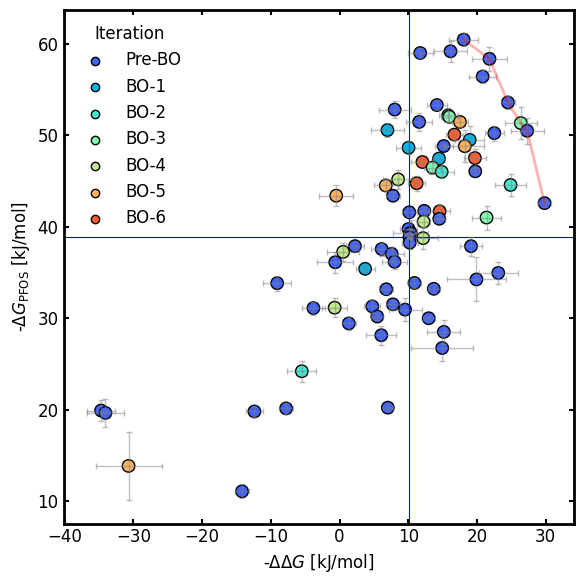

In [33]:
# len(X_err)
# Make a color palette for BO iterations

label_pareto_only=True # for plotting

unique_iters = sorted(set(iter_n))
palette = sns.color_palette("rainbow", n_colors=len(unique_iters))
iter_to_color = {it: palette[i] for i, it in enumerate(unique_iters)}

colors = [iter_to_color[it] for it in iter_n]

fig, ax = plt.subplots(figsize=(6,6))

# Add reference lines for baseline β-CD
ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='-', linewidth=0.8)
ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='-', linewidth=0.8)

# overlay scatter with color coding
ax.scatter(X_vals, Y_vals, c=colors, s=80, edgecolors='k', alpha=1.0)
ax.errorbar(X_vals, Y_vals, xerr=X_err, yerr=Y_err,
            fmt='o', ecolor='gray', elinewidth=1.0, capsize=2.5,
            alpha=0.5, color='none')

# Pareto front
maxY, maxX = True, True
sorted_data = sorted(enumerate(zip(X_vals, Y_vals)), key=lambda x: x[1][0], reverse=maxX)
pareto_front = [sorted_data[0]]
for idx, (x, y) in sorted_data[1:]:
    if (maxY and y >= pareto_front[-1][1][1]) or (not maxY and y <= pareto_front[-1][1][1]):
        pareto_front.append((idx, (x, y)))
pf_X, pf_Y = zip(*[pt for _, pt in pareto_front])
pareto_indices = [idx for idx, _ in pareto_front]
pf_X, pf_Y = zip(*[pt for _, pt in pareto_front])
ax.plot(pf_X, pf_Y, color='red', linewidth=2, alpha=0.3)

ax.set_xlabel(r'-$\Delta\Delta G$ [kJ/mol]')
ax.set_ylabel(r'-$\Delta G_{\mathrm{PFOS}}$ [kJ/mol]')
# ax.set_title('ddG (Selectivity) vs dG (Sensitivity)')

# # Label points
# if labels:
#     if label_pareto_only:
#         label_indices = pareto_indices
#     else:
#         label_indices = range(len(Xs))
    
#     for idx in label_indices:
#         ax.annotate(labels[idx], 
#                     xy=(X_vals[idx], Y_vals[idx]), 
#                     xytext=(X_vals[idx] - 4.5, Y_vals[idx] + 2.5),
#                     arrowprops=dict(arrowstyle='->', color='darkblue', alpha=0.4),
#                     fontsize=10, ha='left', va='bottom', color='darkblue', alpha=0.8)


# Legend
for it in unique_iters:
    lbl = "Pre-BO" if it == 0 else f"BO-{it}"
    ax.scatter([], [], color=iter_to_color[it], label=lbl, edgecolors='k')
ax.legend(title='Iteration', frameon=False, loc='best')

# Thicken borders (spines)
for side in ax.spines.values():
    side.set_linewidth(2.0)

ax.tick_params(direction='in', right=True, top=True, width=1.5)
plt.tight_layout()
# plt.savefig('/project2/andrewferguson/sachar/test/Images/ddG_vs_dG.png',dpi=600)

In [34]:
# df_cum['iteration_cum']
pareto_front, labels[33], labels[14], labels[12], labels[5], labels[3], labels[0]
# dG_data['bcd-pfos'], ddG_data['bcd']
len(X_vals)

79

In [35]:
# import nglview as nv
# from IPython.display import display

# # display PDB with nglview
# try:

#     pdb_path = "/home/siddarthachar/pfos/gpr/pfos-working/data/chem_space_structures/00797.pdb"
#     view = nv.show_file(pdb_path)
#     view.clear_representations()
#     view.add_cartoon(color="spectrum")
#     view.add_ball_and_stick(selection="not solvent")
#     view.center()
#     display(view)
# except Exception as e:
#     print("nglview import/display failed:", e)

In [36]:
# evolution of pareto front as a function of BO iterations
# Compute Pareto front indices for each BO iteration (including Pre)
pareto_fronts = {}

# Helper function to compute Pareto front indices given X, Y
def compute_pareto_indices(X, Y, maximize_X=True, maximize_Y=True):
    points = list(zip(X, Y))
    sorted_idx = sorted(range(len(points)), key=lambda i: X[i], reverse=maximize_X)
    pareto = [sorted_idx[0]]
    for idx in sorted_idx[1:]:
        x, y = points[idx]
        last_x, last_y = points[pareto[-1]]
        if (maximize_Y and y >= last_y) or (not maximize_Y and y <= last_y):
            pareto.append(idx)
    return pareto

# Get all unique iterations in order
iter_order = pd.Categorical(df_cum['iteration_cum'], categories=df_cum['iteration_cum'].unique(), ordered=True)

for it in iter_order.categories:
    # Subset for this iteration (cumulative up to this iteration)
    sub = df_cum[df_cum['iteration_cum'] <= it]
    # Use actual dG and ddG values (not scaled scores)
    X = sub['ddG'].values
    Y = sub['dG'].values
    # Compute Pareto front indices (maximize both axes)
    pf_idx = compute_pareto_indices(X, Y, maximize_X=True, maximize_Y=True)
    pareto_fronts[it] = sub.iloc[pf_idx].index.tolist()

In [37]:
# pareto_fronts
import math

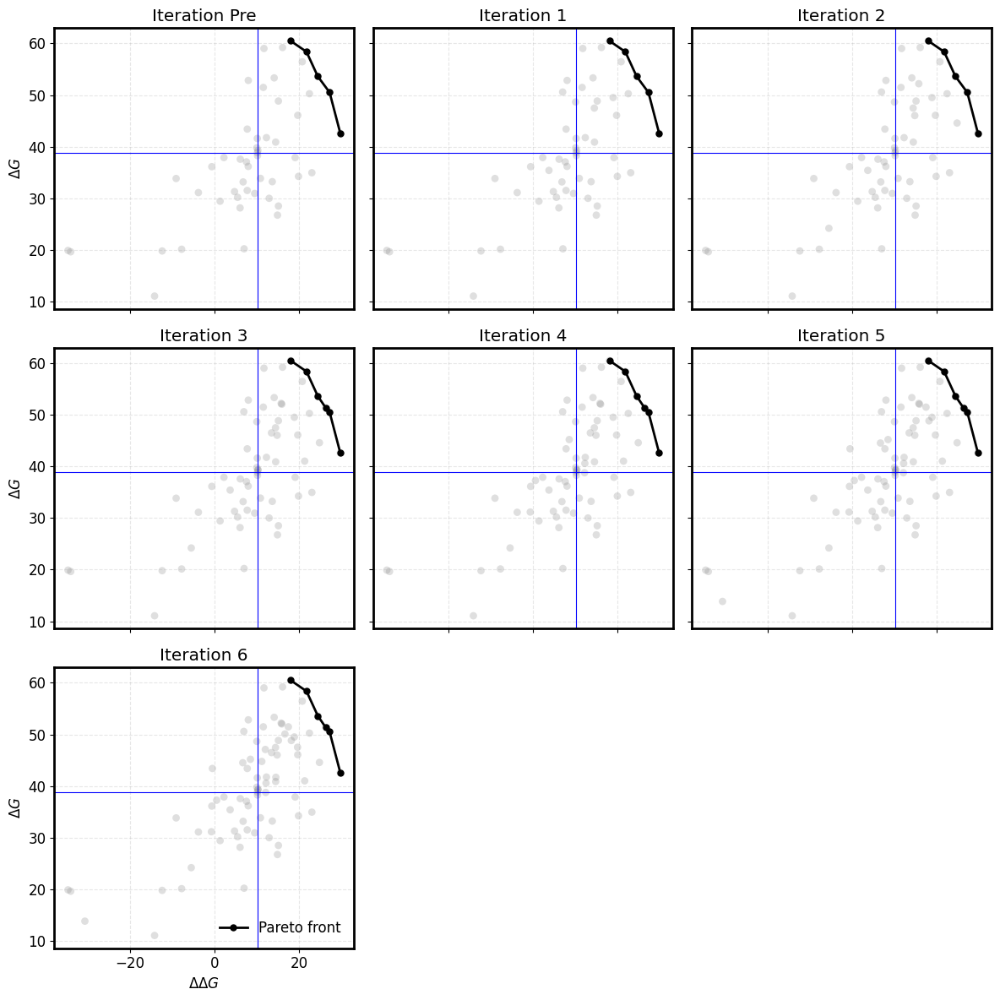

In [38]:
import math

# Keep your existing order
iter_order = pd.Categorical(df_cum['iteration_cum'],
                            categories=df_cum['iteration_cum'].unique(),
                            ordered=True)
cats = list(iter_order.categories)

# 3 rows, columns as needed
n = len(cats)
nrows = 3
ncols = math.ceil(n / nrows)

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), sharex=True, sharey=True)
axes = np.atleast_2d(axes)             # ensure 2D
axes_flat = axes.ravel()

# Thicken borders (spines) and add reference lines
for ax in axes_flat[:n]:
    for side in ax.spines.values():
        side.set_linewidth(2.0)
    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='-', linewidth=0.8)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='-', linewidth=0.8)

for i, it in enumerate(cats):
    ax = axes_flat[i]

    # Cumulative subset up to this iteration (robust to non-ordered dtypes)
    up_to = set(cats[:i+1])
    sub = df[df['iteration'].isin(up_to)]

    X = sub['ddG'].values
    Y = sub['dG'].values

    # Scatter
    ax.scatter(X, Y, color='gray', alpha=0.25, s=40, edgecolors='none')

    # Pareto front (maximize both axes)
    pf_idx = compute_pareto_indices(X, Y, maximize_X=True, maximize_Y=True)
    pf_X, pf_Y = X[pf_idx], Y[pf_idx]

    # (Optional) sort by X for a cleaner line
    order = np.argsort(pf_X)
    ax.plot(pf_X[order], pf_Y[order], color='black', linewidth=2.0,
            marker='o', markersize=5, label='Pareto front')

    ax.set_title(f'Iteration {it}')
    ax.grid(True, linestyle='--', alpha=0.3)

# Label only left column / bottom row
for r in range(nrows):
    for c in range(ncols):
        idx = r*ncols + c
        if idx >= n:
            axes[r, c].axis('off')     # hide unused panels
            continue
        if c == 0:
            axes[r, c].set_ylabel(r'$\Delta G$')
        if r == nrows - 1:
            axes[r, c].set_xlabel(r'$\Delta\Delta G$')

# Put legend on the last used axis
if n > 0:
    axes_flat[min(n-1, len(axes_flat)-1)].legend(frameon=False, loc='lower right')

plt.tight_layout()
plt.show()


In [39]:
# code to show the pareto shells 1-n (including Pareto front as shell 1)
pareto_shells = {}

for it in pareto_fronts.keys():
    sub = df_cum[df_cum['iteration_cum'] <= it]
    X = sub['ddG'].values
    Y = sub['dG'].values
    indices = np.arange(len(sub))
    shells = []
    remaining = indices.copy()
    # Compute shells iteratively
    while len(remaining) > 0:
        pf_idx = compute_pareto_indices(X[remaining], Y[remaining], maximize_X=maxX, maximize_Y=maxY)
        shell = remaining[pf_idx]
        shells.append(shell)
        # Remove current shell from remaining
        remaining = np.setdiff1d(remaining, shell)
    pareto_shells[it] = shells  # include shell 1 (Pareto front) as shells[0]


In [40]:
# shells, X.shape
# pareto_shells

df[df['iteration'] == it]
# df_cum[df_cum['iteration_cum'] <= it]

,iteration,score,label,dG,ddG
74,6,0.348162,00732,41.698332,14.555559
75,6,0.605122,00531,50.087421,16.705079
76,6,0.148681,00407,44.769861,11.221182
77,6,0.786434,00794,47.522321,19.696371
78,6,0.236877,00543,47.088282,12.056453


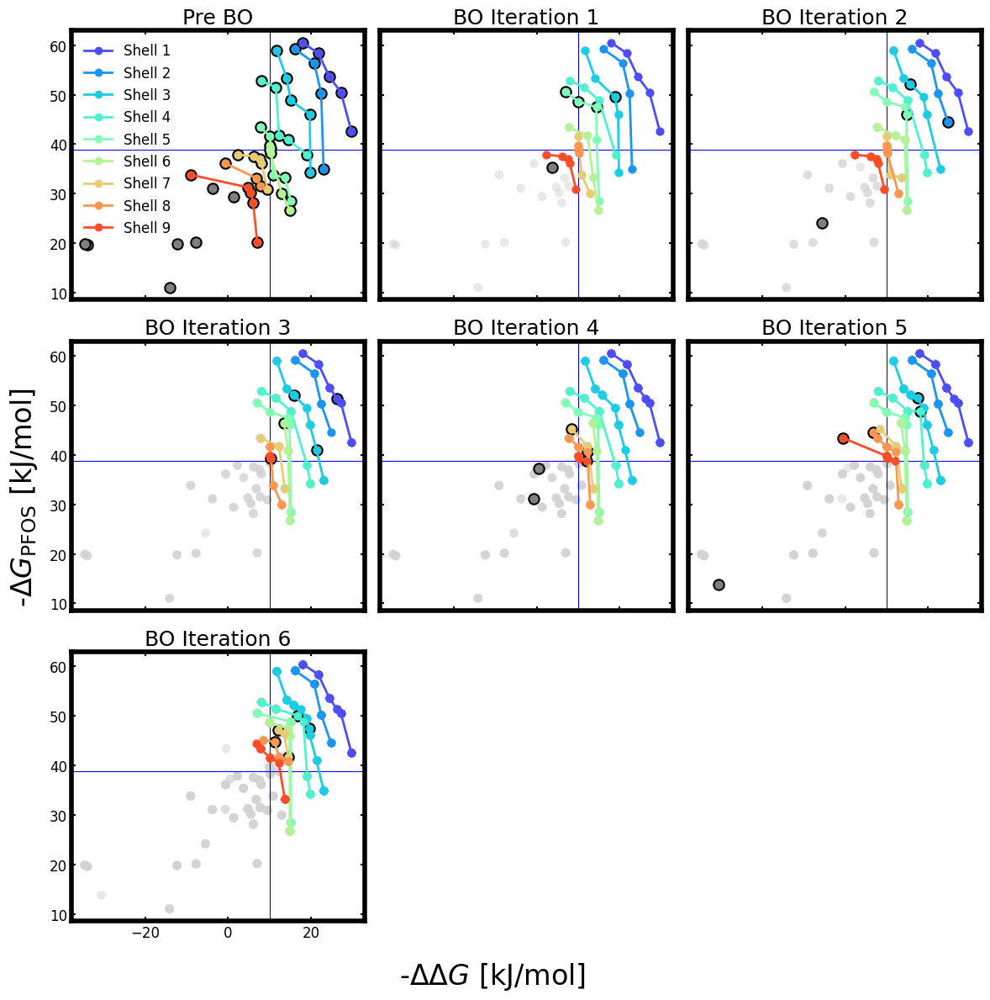

In [41]:
n_shells = 9

cats = list(df_cum['iteration_cum'].cat.categories)
n = len(cats)
nrows = 3
ncols = int(np.ceil(n / nrows))

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), sharex=True, sharey=True)
axes = np.atleast_2d(axes)
axes_flat = axes.ravel()

for ax in axes_flat[:n]:
    for side in ax.spines.values():
        side.set_linewidth(2.0)
    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='-', linewidth=0.8)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='-', linewidth=0.8)

for i, it in enumerate(cats):
    ax = axes_flat[i]

    cum_sub = df_cum[df_cum['iteration_cum'] <= it]
    X_cum, Y_cum = cum_sub['ddG'].values, cum_sub['dG'].values
    prev_sub = df_cum[df_cum['iteration_cum'] < it]
    X_prev, Y_prev = prev_sub['ddG'].values, prev_sub['dG'].values
    new_sub = df[df['iteration'] == it]
    X_new, Y_new = new_sub['ddG'].values, new_sub['dG'].values

    ax.scatter(X_prev, Y_prev, color='lightgray', s=60, alpha=0.5, edgecolors='none', zorder=1)
    ax.scatter(X_new, Y_new, facecolors='gray', edgecolors='black', s=80, linewidths=1.5, zorder=2)

    shells = pareto_shells[it][:n_shells]
    cmap = sns.color_palette("rainbow", n_colors=n_shells)
    for j, shell in enumerate(shells):
        shell_X = X_cum[shell]
        shell_Y = Y_cum[shell]
        order = np.argsort(shell_X)
        ax.plot(shell_X[order], shell_Y[order], color=cmap[j],
                linewidth=2.0, marker='o', markersize=6,
                label=f'Shell {j+1}', zorder=3)
    if i == 0:
        title_str = 'Pre BO'
    else:
        title_str = f'BO Iteration {it}'
    ax.set_title(title_str, fontsize=18)
    # ax.grid(True, linestyle='--', alpha=0.3)
    for side in ax.spines.values():
        side.set_linewidth(4)
        ax.tick_params(axis='both', which='both', direction='in', top=True, right=True, width=1.5)

# Hide unused subplots
for ax in axes_flat[n:]:
    ax.axis('off')


fig.supxlabel(r'-$\Delta\Delta G$ [kJ/mol]', fontsize=24)
fig.supylabel(r'-$\Delta G_{\mathrm{PFOS}}$ [kJ/mol]', fontsize=24)

# Legend on first axis
axes_flat[0].legend(frameon=False, loc='upper left', fontsize=12)

plt.tight_layout()
# plt.savefig('BO-shells.png', dpi=600)

In [42]:
min(n-1, len(axes_flat)-1)

6

In [43]:
# # Plot how shell 2 changes with iteration, all on the same plot

# n_shell = 1  # shell index (2nd shell, i.e., index 1)
# cats = list(df_cum['iteration_cum'].cat.categories)

# fig, ax = plt.subplots(figsize=(6, 6))

# cmap = sns.color_palette("rainbow", n_colors=len(cats))

# for i, it in enumerate(cats):
#     shells = pareto_shells[it]
#     if len(shells) > n_shell - 1:
#         shell = shells[n_shell - 1]
#         cum_sub = df_cum[df_cum['iteration_cum'] <= it]
#         X_cum = cum_sub['ddG'].values
#         Y_cum = cum_sub['dG'].values
#         shell_X = X_cum[shell]
#         shell_Y = Y_cum[shell]
#         order = np.argsort(shell_X)
#         ax.plot(shell_X[order], shell_Y[order], marker='o', linestyle='-', linewidth=2.0,
#                 markersize=7, color=cmap[i], label=f'Iter {it}')

# # Reference lines for β-CD
# ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='--', linewidth=1.2, alpha=0.7)
# ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='--', linewidth=1.2, alpha=0.7)

# ax.set_xlabel(r'$\Delta\Delta G$')
# ax.set_ylabel(r'$\Delta G$')
# ax.set_title('Evolution of Pareto Shell 2 Across Iterations')
# ax.legend(frameon=False, loc='best', fontsize=10)
# for s in ax.spines.values():
#     s.set_linewidth(2.0)
# ax.tick_params(direction='in', right=True, top=True, width=1.5)
# plt.tight_layout()
# plt.show()

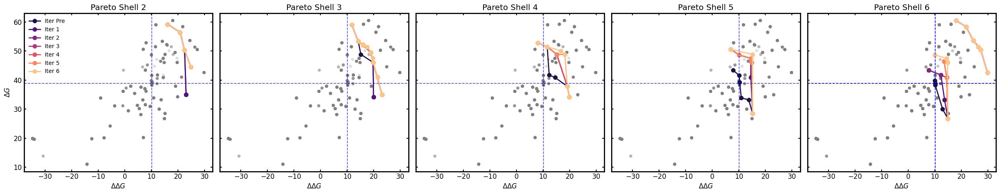

In [44]:
# Plot how shell 2 changes with iteration, all on the same plot
# Plot scatter of all points and overlay shells 2-5, one subplot per shell
n_shells = 5  # shells 2 to 5
cats = list(df_cum['iteration_cum'].cat.categories)
fig, axes = plt.subplots(1, n_shells, figsize=(5 * n_shells, 5), sharex=True, sharey=True)
cmap = sns.color_palette("magma", n_colors=len(cats))

for shell_idx in range(0, n_shells + 1):  # shell indices 1 to 4 (shell 2 to 5)
    ax = axes[shell_idx - 1]
    for i, it in enumerate(cats):
        shells = pareto_shells[it]
        if len(shells) > shell_idx:
            shell = shells[shell_idx]
            cum_sub = df_cum[df_cum['iteration_cum'] <= it]
            X_cum = cum_sub['ddG'].values
            Y_cum = cum_sub['dG'].values
            # Scatter all points for this iteration
            ax.scatter(X_cum, Y_cum, color='gray', alpha=0.25, s=30, edgecolors='none')
            shell_X = X_cum[shell]
            shell_Y = Y_cum[shell]
            order = np.argsort(shell_X)
            ax.plot(shell_X[order], shell_Y[order], marker='o', linestyle='-', linewidth=2.0,
                    markersize=7, color=cmap[i], label=f'Iter {it}' if shell_idx == 1 else None)
    # Reference lines for β-CD
    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='--', linewidth=1.2, alpha=0.7)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='--', linewidth=1.2, alpha=0.7)
    ax.set_title(f'Pareto Shell {shell_idx + 1}')
    for s in ax.spines.values():
        s.set_linewidth(2.0)
    ax.tick_params(direction='in', right=True, top=True, width=1.5)
axes[0].set_ylabel(r'$\Delta G$')
for ax in axes:
    ax.set_xlabel(r'$\Delta\Delta G$')
axes[0].legend(frameon=False, loc='best', fontsize=10)
plt.tight_layout()
plt.show()

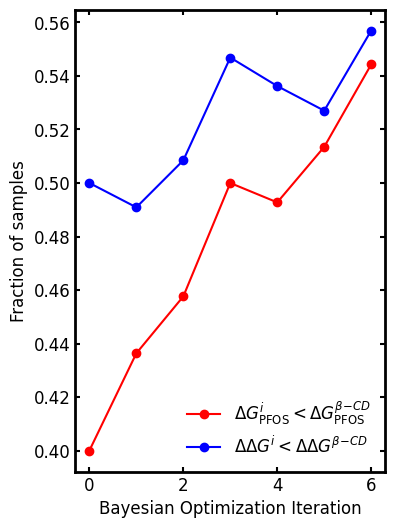

In [45]:
threshold_dG = -dG_data['bcd-pfos'][0]
threshold_ddG = -ddG_data['bcd'][0]
# Compute fraction of samples with dG > threshold, per cumulative iteration
frac_dG_over_thresh = (
    df_cum.groupby('iteration_cum')['dG']
          .apply(lambda x: np.mean(x > threshold_dG))
)

frac_ddG_over_thresh = (
    df_cum.groupby('iteration_cum')['ddG']
          .apply(lambda x: np.mean(x > threshold_ddG))
)

# x positions for plotting
cats = df_cum['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Plot
fig, ax = plt.subplots(figsize=(4,6))

# Overlay fraction line
ax.plot(
    x_pos, frac_dG_over_thresh.values,
    marker='o', linestyle='-', color='red',
    linewidth=1.5, markersize=6, label=r'$\Delta G_{\mathrm{PFOS}}^{i} < \Delta G_{\mathrm{PFOS}}^{\beta\mathrm{-}CD}$'
)

ax.plot(
    x_pos, frac_ddG_over_thresh.values,
    marker='o', linestyle='-', color='blue',
    linewidth=1.5, markersize=6, label=r'$\Delta \Delta G^{i} < \Delta \Delta G^{\beta\mathrm{-}CD}$'
)

# ax.set_title('Fraction of Samples with dG > 10 by Iteration')
ax.set_ylabel('Fraction of samples')
ax.set_xlabel('Bayesian Optimization Iteration')
# ax.set_ylim(0, 1.05)

# Thicken spines
for side in ax.spines.values():
    side.set_linewidth(2)
    ax.tick_params(axis='both', which='both', direction='in', top=True, right=True, width=1.5)
ax.legend(frameon=False)
# plt.tight_layout()
plt.show()

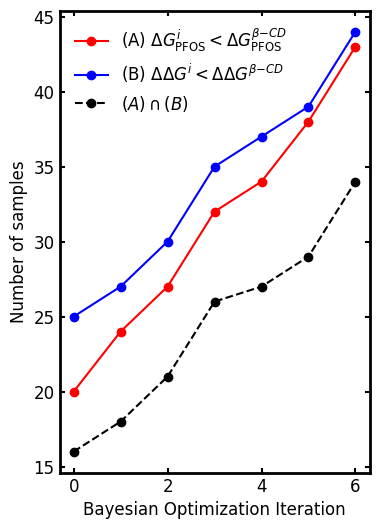

In [46]:
threshold_dG = -dG_data['bcd-pfos'][0]
threshold_ddG = -ddG_data['bcd'][0]

# Compute count of samples exceeding threshold, per cumulative iteration
count_dG_over_thresh = (
    df_cum.groupby('iteration_cum')['dG']
          .apply(lambda x: np.sum(x > threshold_dG))
)

count_ddG_over_thresh = (
    df_cum.groupby('iteration_cum')['ddG']
          .apply(lambda x: np.sum(x > threshold_ddG))
)

# Count of samples exceeding BOTH thresholds per cumulative iteration
count_both_over_thresh = (
    df_cum.groupby('iteration_cum')
          .apply(lambda g: np.sum(
              (g['dG'] > threshold_dG) &
              (g['ddG'] > threshold_ddG)
          ))
)

label_A = (r'(A) $\Delta G_{\mathrm{PFOS}}^{i} < \Delta G_{\mathrm{PFOS}}^{\beta\mathrm{-}CD}$')
label_B = (r'(B) $\Delta\Delta G^{i} < \Delta\Delta G^{\beta\mathrm{-}CD}$')
label_AintB = (r'$(A)\cap(B)$')

# x positions for plotting
cats = df_cum['iteration_cum'].cat.categories
x_pos = np.arange(len(cats))

# Plot
fig, ax = plt.subplots(figsize=(4,6))

ax.plot(
    x_pos, count_dG_over_thresh.values,
    marker='o', linestyle='-', color='red',
    linewidth=1.5, markersize=6,
    label=label_A,
    # label=r'$\Delta G_{\mathrm{PFOS}}^{i} < \Delta G_{\mathrm{PFOS}}^{\beta\mathrm{-}CD}$'
)

ax.plot(
    x_pos, count_ddG_over_thresh.values,
    marker='o', linestyle='-', color='blue',
    linewidth=1.5, markersize=6,
    # label=r'$\Delta \Delta G^{i} < \Delta \Delta G^{\beta\mathrm{-}CD}$'
    label=label_B,
)

ax.plot(
    x_pos, count_both_over_thresh.values,
    marker='o', linestyle='--', color='black',
    linewidth=1.5, markersize=6,
    label=label_AintB,
    # label=r'Both: $\Delta G^{i}$ and $\Delta\Delta G^{i}$ exceed $\beta$-CD'
)

ax.set_ylabel('Number of samples')
ax.set_xlabel('Bayesian Optimization Iteration')

for side in ax.spines.values():
    side.set_linewidth(2)

ax.tick_params(axis='both', which='both',
               direction='in', top=True, right=True, width=1.5)

ax.legend(frameon=False)
plt.show()

In [47]:
def compute_mean_Kb(Kb, Kb_error):
    """
    Compute the mean equilibrium binding constant (Kb) and propagate uncertainty.
    """
    Kb = np.squeeze(Kb)
    Kb_error = np.squeeze(Kb_error)
    mean_Kb = np.mean(Kb)
    mean_Kb_error = np.sqrt(np.sum(Kb_error**2)) / len(Kb)
    
    return mean_Kb, mean_Kb_error
    # Kb is in log-normal space - so have to trun to log
    # Kb = np.squeeze(Kb).astype(float)
    # Kb_error = np.squeeze(Kb_error).astype(float)

    # z = np.log(Kb)
    # z_err = Kb_error / Kb  # d(ln K) ≈ dK/K

    # z_m = np.mean(z)
    # z_std = np.sqrt(np.mean(z_err**2 + (z - z_m)**2))

    # mean_Kb = np.exp(z_m)                 # geometric mean
    # mean_Kb_error = mean_Kb * z_std       # back-propagated 1σ (approx)

    # return mean_Kb, mean_Kb_error

def compute_Kd(Kb, Kb_error):
    """
    Compute the dissociation constant (Kd) and propagate uncertainty.    
    """
    Kd = 1 / Kb
    Kd_error = Kd * (Kb_error / Kb)  # Propagate error using Δy = y (Δx/x)
    
    return Kd, Kd_error

def compute_Kd_ratio(Kb_pfos, Kb_pfos_e, Kb_sds, Kb_sds_e):
    """
    Computes the ratio of Kd_SDS / Kd_PFOS with propagated uncertainties.
    
    Parameters:
        Kb_pfos (float): Mean binding constant for PFOS.
        Kb_pfos_e (float): Uncertainty in Kb_pfos.
        Kb_sds (float): Mean binding constant for SDS.
        Kb_sds_e (float): Uncertainty in Kb_sds.
        
    Returns:
        tuple: Ratio Kd_SDS / Kd_PFOS and its propagated uncertainty.
    """
    Kd_pfos, Kd_pfos_e = compute_Kd(Kb_pfos, Kb_pfos_e)
    Kd_sds, Kd_sds_e = compute_Kd(Kb_sds, Kb_sds_e)
    Kd_ratio = Kd_sds / Kd_pfos
    Kd_ratio_e = Kd_ratio * np.sqrt((Kd_pfos_e / Kd_pfos) ** 2 + (Kd_sds_e / Kd_sds) ** 2)

    return Kd_ratio, Kd_ratio_e

In [48]:
def compute_mean_Kb(Kb, Kb_error):
    """
    Compute geometric mean Kb and an effective 1σ uncertainty assuming Kb is log-normal.

    Inputs
    ------
    Kb : array-like
        Per-interval (or per-replicate) Kb estimates in linear space (must be > 0).
    Kb_error : array-like
        1σ uncertainty for each Kb estimate in linear space.

    Returns
    -------
    mean_Kb : float
        Geometric mean of Kb (exp(mean(log(Kb)))).
    mean_Kb_error : float
        Approximate 1σ uncertainty in linear space obtained via back-propagation from log space.
        Note: this is a small-error approximation; for large log-uncertainty consider reporting
        asymmetric confidence intervals.
    """
    Kb = np.squeeze(Kb).astype(float)
    Kb_error = np.squeeze(Kb_error).astype(float)

    if np.any(Kb <= 0):
        raise ValueError("Kb must be > 0 to use log-space averaging.")
    if np.any(Kb_error < 0):
        raise ValueError("Kb_error must be >= 0.")

    z = np.log(Kb)
    z_err = Kb_error / Kb  # d(ln K) ≈ dK/K

    z_m = np.mean(z)
    # Effective RMS in log-space (includes within-uncertainty + between-scatter)
    z_std = np.sqrt(np.mean(z_err**2 + (z - z_m)**2))

    mean_Kb = np.exp(z_m)            # geometric mean
    mean_Kb_error = mean_Kb * z_std  # approx 1σ in linear space

    return float(mean_Kb), float(mean_Kb_error)


def compute_Kd(Kb, Kb_error):
    """
    Compute Kd = 1/Kb and propagate uncertainty (first-order).

    Inputs are assumed to be in linear space:
      - Kb: mean binding constant (must be > 0)
      - Kb_error: 1σ uncertainty on Kb (>= 0)
    """
    Kb = float(Kb)
    Kb_error = float(Kb_error)

    if Kb <= 0:
        raise ValueError("Kb must be > 0 to compute Kd.")
    if Kb_error < 0:
        raise ValueError("Kb_error must be >= 0.")

    Kd = 1.0 / Kb
    Kd_error = Kd * (Kb_error / Kb)  # d(1/x) ≈ (1/x)*(dx/x)

    return float(Kd), float(Kd_error)


def compute_Kd_ratio(Kb_pfos, Kb_pfos_e, Kb_sds, Kb_sds_e):
    """
    Compute ratio = Kd_SDS / Kd_PFOS.

    Numerically stable log-space propagation:
        ratio = Kb_PFOS / Kb_SDS
        ln(ratio) = ln(Kb_PFOS) - ln(Kb_SDS)
        σ_{ln(ratio)} = sqrt( (σ_Kp/Kp)^2 + (σ_Ks/Ks)^2 )
        σ_ratio ≈ ratio * σ_{ln(ratio)}

    Inputs
    ------
    Kb_pfos, Kb_sds : float
        Mean Kb values (linear space; must be > 0).
    Kb_pfos_e, Kb_sds_e : float
        1σ uncertainties on the mean Kb values (linear space; must be >= 0).

    Returns
    -------
    ratio : float
        Kd_SDS / Kd_PFOS (dimensionless).
    ratio_e : float
        Approximate 1σ uncertainty on the ratio.
    """
    Kb_pfos = float(Kb_pfos); Kb_pfos_e = float(Kb_pfos_e)
    Kb_sds  = float(Kb_sds);  Kb_sds_e  = float(Kb_sds_e)

    if Kb_pfos <= 0 or Kb_sds <= 0:
        raise ValueError("Kb values must be > 0 to compute ratios.")
    if Kb_pfos_e < 0 or Kb_sds_e < 0:
        raise ValueError("Kb uncertainties must be >= 0.")

    # Compute in log-space (more stable for multiplicative quantities)
    log_ratio = np.log(Kb_pfos) - np.log(Kb_sds)
    log_ratio_e = np.sqrt((Kb_pfos_e / Kb_pfos)**2 + (Kb_sds_e / Kb_sds)**2)

    ratio = np.exp(log_ratio)
    ratio_e = ratio * log_ratio_e

    return float(ratio), float(ratio_e)

In [49]:
os.chdir('/home/siddarthachar/pfos/gpr/publication/m3_nb/')
os.chdir('rigid_CD_gaff_kb_dg_only')
dirs = os.listdir()
jobs_ignore = ['F-side-bcd-sds','F-side-bcd-pfos',
               'F-both-bcd-sds','F-both-bcd-pfos',
               'F-prim-bcd-sds','F-prim-bcd-pfos',
               'acd-pfos','acd-sds','acd-tcaa',
               'bcd-pfos','bcd-sds','bcd-tcaa',
               'gcd-tcaa', 'common.files']
#'gcd-pfos','gcd-sds',
jobs = sorted([x for x in dirs if os.path.isdir(x) and 'kb_dg.npy' in os.listdir(x) and x not in jobs_ignore])
Kb_label_dict = {}
for j in jobs:
    if 'ddgcd' not in j: # added some placeholder directory - replace with the directory you want later
        os.chdir(j)
        if 'kb_dg.npy' in os.listdir():
            a=np.load('kb_dg.npy')
            mean_Kb_pfos, mean_Kb_pfos_e = compute_mean_Kb(a[0], a[1])
            # kb_m = np.mean(a[0])
            # final_std = np.sqrt(np.mean(a[1]**2 + (a[1] - dg_m)**2))
            if 'C_rigid' in j:
                j_temp = j.split('_C_rigid')[0]
                j = j_temp
            Kb_label_dict[j] = [mean_Kb_pfos,mean_Kb_pfos_e]
        os.chdir('../')

os.chdir('/home/siddarthachar/pfos/gpr/publication/m3_nb/')

In [73]:
# Compute Kd values (Kd = 1/Kb) for all systems in Kb_label_dict
Kd_label_dict = {}

for system_label, (Kb_mean, Kb_error) in Kb_label_dict.items():
    # Compute Kd and propagate uncertainty
    Kd_mean, Kd_error = compute_Kd(Kb_mean, Kb_error)
    Kd_label_dict[system_label] = [Kd_mean, Kd_error]

# Verify the computation
print(f"Computed Kd values for {len(Kd_label_dict)} systems")
print("Sample entries:")
for key in list(Kd_label_dict.keys())[:3]:
    print(f"  {key}: Kd = {Kd_label_dict[key][0]:.3e} ± {Kd_label_dict[key][1]:.3e} M")

Computed Kd values for 165 systems
Sample entries:
  00073-pfos: Kd = 7.232e-08 ± 3.805e-08 M
  00073-sds: Kd = 3.827e-04 ± 2.448e-04 M
  00076-pfos: Kd = 8.173e-10 ± 2.506e-10 M


In [74]:
# Kb_label_dict

with open('Kd_data.pkl', 'wb') as f:
    pickle.dump(Kd_label_dict, f)

with open('Kb_data.pkl', 'wb') as f:
    pickle.dump(Kb_label_dict, f)

In [ ]:
# Compute Kd_SDS/Kd_PFOS ratios (selectivity) for all systems
Kd_ratio_data = {}

for system_label in Kb_label_dict.keys():
    # Extract base system name (remove -pfos or -sds suffix)
    base_label = system_label.split('-pfos')[0].split('-sds')[0]
    
    # Check if both PFOS and SDS data exist
    pfos_key = base_label + '-pfos'
    sds_key = base_label + '-sds'
    
    if pfos_key in Kb_label_dict and sds_key in Kb_label_dict:
        Kb_pfos, Kb_pfos_e = Kb_label_dict[pfos_key]
        Kb_sds, Kb_sds_e = Kb_label_dict[sds_key]
        
        # Compute Kd ratio using existing function
        ratio, ratio_e = compute_Kd_ratio(Kb_pfos, Kb_pfos_e, Kb_sds, Kb_sds_e)
        Kd_ratio_data[base_label] = [ratio, ratio_e]

# Save to pickle file
with open('Kd_ratio_data.pkl', 'wb') as f:
    pickle.dump(Kd_ratio_data, f)

print(f"Computed Kd_PFOS/Kd_SDS ratios for {len(Kd_ratio_data)} systems")
print("Saved to 'Kd_ratio_data.pkl'")

Computed Kd_PFOS/Kd_SDS ratios for 79 systems
Saved to 'Kd_ratio_data.pkl'


[156055.87088305564, 56926.72183101953]

In [66]:
# Kb_label_dict
# Kb_label_dict
Kbpfos = 177.4
C_probe = 8e-11/8e-12/Kbpfos
C_probe
# 9/177
1.4/4.6

0.30434782608695654

In [49]:
# selectivity
# labels[pareto_indices[-1]]
# labels
Kb_label_dict[labels[pareto_indices[-1]]+'-pfos']
Kb_label_dict[labels[pareto_indices[-1]]+'-sds']

[24360389.583916828, 19039934.549858958]

In [50]:
# np.log(C_probe_ref)

/tmp/ipykernel_503172/2445039751.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma', N)                # magma colormap


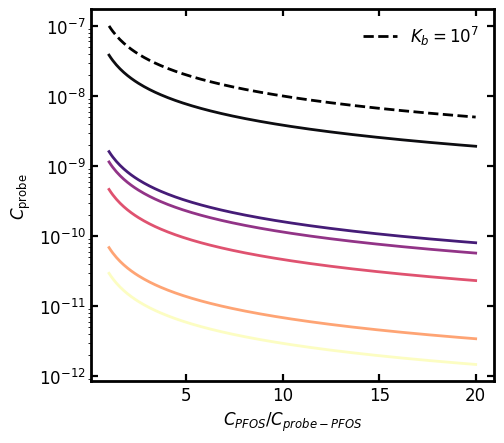

In [51]:
# Kb_label_dict[labels[pareto_indices[-1]]+'-pfos']
from matplotlib import cm
def calc_Cprobe(Kb, C0analyte):
    # assuming single 1:1 binding
    return 1/C0analyte/Kb
# --- Plot nicely ---
C0_vals = np.linspace(1, 20, 200)             # smoother curve
N = len(pareto_indices)
cmap = cm.get_cmap('magma', N)                # magma colormap

fig, ax = plt.subplots(figsize=(5.2, 4.6))

C_probe_list = []
for i in range(N):
    Kb_i = Kb_label_dict[labels[pareto_indices[i]] + '-pfos'][0]
    C_probe_i = calc_Cprobe(Kb_i, C0_vals)
    C_probe_list.append(C_probe_i)
    ax.plot(
        C0_vals, C_probe_i,            # keep natural log to match your code
        color=cmap(i), linewidth=2.0, alpha=0.95
    )

# Reference curve for Kb = 1e7 (dotted black)
Kb_ref = 1e7
C_probe_ref = calc_Cprobe(Kb_ref, C0_vals)
ax.plot(C0_vals, C_probe_ref, 'k--', linewidth=2.0, label=r'$K_b=10^{7}$')

# Labels & title
ax.set_xlabel(r'$C_{PFOS}$/$C_{probe-PFOS}$')
ax.set_ylabel(r'$C_{\mathrm{probe}}$')
# ax.set_title(r'$C_{\mathrm{probe}}=\frac{C_0}{K_b}$ for PFOS (per Pareto candidate)')

# Thicken borders and ticks
for s in ax.spines.values():
    s.set_linewidth(2.0)
ax.tick_params(direction='in', top=True, right=True, width=1.6, length=5)
ax.set_yscale('log')
# Legend just for the reference line
ax.legend(frameon=False, loc='best')

plt.tight_layout()
plt.show()

In [52]:
# np.log(C_probe_i)
# C_probe_i
# 8e-12 + 1/177.6
# Kd_examples

In [53]:
# what we can do is plot the profiles of CP as a function of C
Kd = 1/Kb_ref
from typing import Tuple, Optional, List
import math
def solve_equilibrium(C0P: float, C0F: float, Kd: float) -> Tuple[float, float, float]:
    """
    Closed-form solution for 1:1 binding equilibrium.
    Returns (CP, CF, CPF) given totals (C0P, C0F) and Kd.
    """
    # Quadratic in CPF: CPF^2 - (C0F + C0P + Kd) * CPF + C0F*C0P = 0
    a = 1.0
    b = -(C0F + C0P + Kd)
    c = C0F * C0P
    disc = b*b - 4*a*c
    if disc < 0:
        # Numerical safeguard: clamp very small negative due to FP
        if disc > -1e-24:
            disc = 0.0
        else:
            raise ValueError("Negative discriminant; check inputs.")
    sqrt_disc = math.sqrt(disc)
    # Physical branch: take the SMALLER root (lies in [0, min(C0F, C0P)])
    CPF = 0.5 * ( (C0F + C0P + Kd) - sqrt_disc )
    # Back out free species
    CP = C0P - CPF
    CF = C0F - CPF
    # Clamp tiny negatives due to FP noise
    CP = max(CP, 0.0)
    CF = max(CF, 0.0)
    CPF = max(CPF, 0.0)
    return CP, CF, CPF


def min_probe_to_hit_target(C0F: float, Kd: float, CPF_target: float,
                            C0P_upper_init: float = 1e-3) -> Tuple[float, float, float, bool]:
    """
    Find the minimum C0P such that CPF >= CPF_target for given C0F, Kd.
    Returns (C0P_min, CP_at_min, CPF_at_min, feasible)
    - If infeasible (e.g., C0F < target even with huge probe), returns feasible=False.
    Strategy:
      1) If C0F < CPF_target: impossible (can't bind more than available analyte).
      2) Grow an upper bound until CPF >= target or max bound reached.
      3) Bisection on [low, high] to locate minimal C0P.
    """
    # If not enough PFOS in the sample to ever reach the bound threshold:
    if C0F < CPF_target:
        return np.nan, np.nan, np.nan, False

    # Lower bound: at least target
    low = CPF_target  # trivially, you need at least this much total probe
    # Ensure low is not zero for numerical stability
    low = max(low, 1e-18)

    # Find an upper bound that achieves CPF >= target
    high = max(C0P_upper_init, low*2)
    CPF_high = solve_equilibrium(high, C0F, Kd)[2]
    attempts = 0
    while CPF_high < CPF_target and attempts < 60:
        high *= 2.0
        CPF_high = solve_equilibrium(high, C0F, Kd)[2]
        attempts += 1

    if CPF_high < CPF_target:
        # Could not achieve target even at very high probe concentration
        return np.nan, np.nan, np.nan, False

    # Bisection
    for _ in range(100):
        mid = 0.5*(low + high)
        CPF_mid = solve_equilibrium(mid, C0F, Kd)[2]
        if CPF_mid >= CPF_target:
            high = mid
        else:
            low = mid
        if (high - low) / max(high, 1e-30) < 1e-9:
            break

    C0P_min = high
    CP_min, CF_min, CPF_min = solve_equilibrium(C0P_min, C0F, Kd)
    return C0P_min, CP_min, CPF_min, True

# === User-adjustable defaults ===
CPF_target = 8e-12  # EPA PFOS target (M)
# From β-CD–PFOS example in SI (Kb ~ 2.15e3), Kd ≈ 1/Kb ≈ 4.65e-4 M

In [54]:
# plt.hist([x[0] for x in list(Kb_label_dict.values())],bins=50)

In [76]:
with open(f'chem_space.pkl', 'rb') as f:
    chem_space = pickle.load(f)

In [79]:
# chem_space['00008']['Kd_SDS/Kd_PFOS']

[10503.44391845771, 12018.33984533082]

In [56]:
# Kb_label_dict[labels[pareto_indices[-1]]+'-pfos']
Kd_examples = {labels[x]:[1/Kb_label_dict[labels[x]+'-pfos'][0],1/Kb_label_dict[labels[x]+'-sds'][0]] for x in pareto_indices}
# Kb_label_dict
Kd_examples
Kd_examples['bcd-pfos'] = [1/Kb_label_dict['bcd-pfos'][0], 1/Kb_label_dict['bcd-sds'][0]]
Kd_examples

{'NH2-prim-bcd': [3.832839996143149e-08, 0.005981371835535267],
 'CF2CF3-prim-bcd': [1.606726624342605e-09, 9.078726263221693e-05],
 '00797': [1.1447856555911236e-09, 4.4729075362716635e-05],
 'CCl3-2-bcd': [4.6371538184016726e-10, 8.537949998056976e-06],
 'CH2CH2CH3-prim-gcd': [6.853342003313369e-11, 4.3038728919627404e-07],
 'CH2CH3-prim-bcd': [2.944406624919765e-11, 4.105024661264934e-08],
 'bcd-pfos': [1.7294033083551803e-07, 1.01892724751261e-05]}

In [57]:
# compute_Kd(*Kb_label_dict[labels[pareto_indices[0]]+'-pfos']), 
# Kb_label_dict[labels[pareto_indices[0]]+'-pfos']
# labels[pareto_indices[0]]
labels

['CH2CH3-prim-bcd',
 'CH2CH2CH3-prim-bcd',
 'CH3-prim-bcd',
 'CH2CH2CH3-prim-gcd',
 'CCl-prim-bcd',
 'CCl3-2-bcd',
 'CH2CH3-prim-gcd',
 'CF3-prim-bcd',
 '00076',
 '00517',
 'CH2Cl-5-bcd',
 '00405',
 '00797',
 '00464',
 'CF2CF3-prim-bcd',
 'COC-4-bcd',
 '00531',
 '00525',
 'Cl-prim-bcd',
 '00620',
 '00544',
 '00794',
 '00713',
 '00543',
 '00806',
 'F-prim-bcd',
 '00524',
 '00527',
 '00407',
 '00523',
 '00600',
 '00487',
 'Cl-4-bcd',
 'NH2-prim-bcd',
 'COC-4-2-bcd',
 '00732',
 'CCl3-2-2-bcd',
 '00073',
 'CF3-2-bcd',
 '00737',
 'Cl-both-bcd',
 '00528',
 'F-both-bcd',
 'bcd',
 '00418',
 'CF3-prim-gcd',
 'CH3-prim-gcd',
 'CF2CF3-prim-gcd',
 'CH2Cl-prim-gcd',
 '00795',
 'COC-prim-gcd',
 'CCl3-4-bcd',
 '00526',
 '00709',
 'CCl3-prim-bcd',
 'CCl2CCl2CCl3-prim-bcd',
 'F-prim-gcd',
 'CCl3-prim-gcd',
 'CF3-2-gcd',
 'COC-5-gcd',
 'Br-prim-gcd',
 'CH2F-prim-gcd',
 '00700',
 'CBr3-prim-gcd',
 'CF2CF2CF3-prim-bcd',
 'COC-4-3-bcd',
 'gcd',
 'Cl-prim-gcd',
 'CBr3-prim-bcd',
 'CF2CF2CF3-prim-gcd',
 'CCl

In [58]:
# dG_data[labels[pareto_indices[-1]]+'-pfos']
Kb_label_dict[labels[pareto_indices[-1]]+'-pfos']

[33962700380.32705, 9333685200.267775]

In [59]:
Kb_label_dict[labels[pareto_indices[-1]]+'-pfos'][0]/ Kb_label_dict[labels[pareto_indices[-1]]+'-pfos'][1]

3.6387235750518663

In [60]:
Kd_examples_werror = {labels[x]:[compute_Kd(*Kb_label_dict[labels[x]+'-pfos']),
                                 compute_Kd_ratio(*Kb_label_dict[labels[x]+'-pfos'],*Kb_label_dict[labels[x]+'-sds'])] for x in pareto_indices}
# Kb_label_dict
# Kd_examples_werror
Kd_examples_werror['bcd-pfos'] = [compute_Kd(*Kb_label_dict['bcd-pfos']),
                                 compute_Kd_ratio(*Kb_label_dict['bcd-pfos'],*Kb_label_dict['bcd-sds'])]
Kd_examples_werror

{'NH2-prim-bcd': [(3.832839996143149e-08, 5.817238104289918e-09),
  (156055.87088305564, 56926.72183101953)],
 'CF2CF3-prim-bcd': [(1.606726624342605e-09, 9.145777821156286e-10),
  (56504.48636174351, 53978.60828009184)],
 '00797': [(1.1447856555911236e-09, 8.032865137940481e-10),
  (39072.00893395214, 36830.61302673736)],
 'CCl3-2-bcd': [(4.6371538184016726e-10, 1.2443958370227162e-10),
  (18412.048278786286, 7462.238010578118)],
 'CH2CH2CH3-prim-gcd': [(6.853342003313369e-11, 3.6140291595235664e-11),
  (6279.962228474746, 6240.861115059848)],
 'CH2CH3-prim-bcd': [(2.944406624919765e-11, 8.091866733454177e-12),
  (1394.177226243945, 1155.0790976137519)],
 'bcd-pfos': [(1.7294033083551803e-07, 1.0838444141185521e-08),
  (58.917850023179525, 9.558482886188102)]}

In [61]:
for x in pareto_indices:
    print(f'dG {labels[x]}: ',dG_data[labels[x]+'-pfos'])
print(f'dG bcd-pfos: ',dG_data['bcd-pfos'])

for x in pareto_indices:
    print(f'ddG {labels[x]}: ',ddG_data[labels[x]])
print(f'ddG bcd-pfos: ',ddG_data['bcd'])

dG NH2-prim-bcd:  [-42.59453086247871, 0.379182390086025]
dG CF2CF3-prim-bcd:  [-50.50763745854527, 1.4197989045709272]
dG 00797:  [-51.3493011725278, 1.7510373151906709]
dG CCl3-2-bcd:  [-53.60706737758805, 0.6693414675030749]
dG CH2CH2CH3-prim-gcd:  [-58.37645068476684, 1.315242637032796]
dG CH2CH3-prim-bcd:  [-60.48284435711601, 0.6856288816763226]
dG bcd-pfos:  [-38.835292932474616, 0.1592026394637171]
ddG NH2-prim-bcd:  [-29.825862602460898, 0.9101726810068761]
ddG CF2CF3-prim-bcd:  [-27.29386740810415, 2.3824149801953802]
ddG 00797:  [-26.369370879891378, 2.351906148040218]
ddG CCl3-2-bcd:  [-24.496163632009363, 1.011022565976298]
ddG CH2CH2CH3-prim-gcd:  [-21.813714525645622, 2.4785210239545195]
ddG CH2CH3-prim-bcd:  [-18.058448845571952, 2.0665831151879877]
ddG bcd-pfos:  [-10.165228376121231, 0.4058659465524757]


In [62]:
[compute_Kd(*Kb_label_dict['bcd-pfos']),
                                 compute_Kd_ratio(*Kb_label_dict['bcd-pfos'],*Kb_label_dict['bcd-sds'])]

[(1.7294033083551803e-07, 1.0838444141185521e-08),
 (58.917850023179525, 9.558482886188102)]

In [63]:
# ?compute_Kd_ratio
Kb_label_dict['bcd-sds']

[98142.43386278902, 14686.046335249457]

In [64]:
# # Kd_examples = {
# #     "Weak (Kd=1e-3 M)": 1e-3,
# #     "β-CD–PFOS-like (Kd≈4.7e-4 M)": 4.7e-4,
# #     "Stronger (Kd=1e-5 M)": 1e-7,
# # }

# # Range of initial PFOS concentrations to explore (M)
# C0F_grid = np.logspace(-12, -8, 50)  # 1e-12 to 1e-8 M

# # === Compute minimal probe needed for each C0F across Kd cases ===
# records = []
# for kd_label, kd_val in Kd_examples.items():
#     for c0f in C0F_grid:
#         C0P_min, CP_min, CPF_min, feasible = min_probe_to_hit_target(c0f, kd_val, CPF_target)
#         records.append({
#             "Kd_case": kd_label,
#             "Kd_M": kd_val,
#             "C0F_M": c0f,
#             "C0P_min_M": C0P_min if feasible else np.nan,
#             "CP_at_min_M": CP_min if feasible else np.nan,
#             "CPF_at_min_M": CPF_min if feasible else np.nan,
#             "feasible": feasible
#         })

# df = pd.DataFrame.from_records(records)

# # Show as an interactive table
# # display_dataframe_to_user("Probe requirement vs PFOS level (log sweep of C0F)", df)

# # === Plot 1: Minimal probe needed vs initial PFOS (for each Kd case) ===
# # for kd_label in df["Kd_case"].unique():
# #     sub = df[df["Kd_case"] == kd_label].copy()
# #     # Keep only feasible rows
# #     sub = sub[sub["feasible"]]
# #     # plt.figure()
# #     plt.loglog(sub["C0F_M"].values, sub["C0P_min_M"].values, linestyle="-",label=kd_label)
# #     plt.xlabel("Initial PFOS concentration, C0F (M)")
# #     plt.ylabel("Minimum probe concentration, C0P_min (M)\n(to achieve CPF ≥ 8×10⁻¹² M)")
# #     plt.title(f"Minimum probe required vs PFOS level\n{kd_label}")
# #     # plt.grid(True, which="both")
# #     # plt.show()

# # plt.legend()
# # plt.show()

# fig, ax = plt.subplots(figsize=(5.2, 4.6))

# # C_probe_list = []
# # for i in range(N):
# #     Kb_i = Kb_label_dict[labels[pareto_indices[i]] + '-pfos'][0]
# #     C_probe_i = calc_Cprobe(Kb_i, C0_vals)
# #     C_probe_list.append(C_probe_i)
# #     ax.plot(
# #         C0_vals, C_probe_i,            # keep natural log to match your code
# #         color=cmap(i), linewidth=2.0, alpha=0.95
# #     )
# cmap = cm.get_cmap('rainbow', len(df["Kd_case"].unique())) 
# for i, kd_label in enumerate(df["Kd_case"].unique()):
#     sub = df[df["Kd_case"] == kd_label].copy()
#     # Keep only feasible rows
#     sub = sub[sub["feasible"]]
#     # plt.figure()
#     ax.loglog(sub["C0F_M"].values, sub["C0P_min_M"].values, linestyle="-",label=kd_label,color=cmap(i), linewidth=2.0, alpha=0.95)
#     # plt.xlabel("Initial PFOS concentration, C0F (M)")
#     # plt.ylabel("Minimum probe concentration, C0P_min (M)\n(to achieve CPF ≥ 8×10⁻¹² M)")
#     # plt.title(f"Minimum probe required vs PFOS level\n{kd_label}")

# # Reference curve for Kb = 1e7 (dotted black)
# # Kb_ref = 1e7
# # C_probe_ref = calc_Cprobe(Kb_ref, C0_vals)
# # ax.plot(C0_vals, C_probe_ref, 'k--', linewidth=2.0, label=r'$K_b=10^{7}$')

# # Labels & title
# ax.set_xlabel(r'Initial PFOS concentration, C0F (M)')
# ax.set_ylabel('Minimum probe concentration, C0P_min (M)\n(to achieve CPF ≥ 8×10⁻¹² M)')
# # ax.set_title(r'$C_{\mathrm{probe}}=\frac{C_0}{K_b}$ for PFOS (per Pareto candidate)')

# # Thicken borders and ticks
# for s in ax.spines.values():
#     s.set_linewidth(2.0)
# ax.tick_params(direction='in', top=True, right=True, width=1.6, length=5)
# # ax.set_yscale('log')
# # Legend just for the reference line
# ax.legend(frameon=True, loc='best')

# plt.tight_layout()
# plt.show()
# # # === Plot 2: Free probe at the trigger point vs initial PFOS (for each Kd case) ===
# # for kd_label in df["Kd_case"].unique():
# #     sub = df[df["Kd_case"] == kd_label].copy()
# #     sub = sub[sub["feasible"]]
# #     # plt.figure()
# #     plt.loglog(sub["C0F_M"].values, sub["CP_at_min_M"].values, marker="s", linestyle="-")
# #     plt.xlabel("Initial PFOS concentration, C0F (M)")
# #     plt.ylabel("Free probe at trigger, CP (M)")
# #     plt.title(f"Free probe concentration at trigger (CPF = 8×10⁻¹² M)\n{kd_label}")
# #     # plt.grid(True, which="both")
# #     # plt.show()

# # # === Plot 3: CP vs C0P curves for a few example C0F with a fixed Kd ===
# # Kd_fixed = Kd_examples["β-CD–PFOS-like (Kd≈4.7e-4 M)"]
# # example_C0F = [8e-12, 8e-11, 8e-10]  # 1×, 10×, 100× the EPA target
# # C0P_sweep = np.logspace(-12, -1, 400)

# # for c0f in example_C0F:
# #     CPF_vals = []
# #     CP_vals = []
# #     for c0p in C0P_sweep:
# #         cp, cf, cpf = solve_equilibrium(c0p, c0f, Kd_fixed)
# #         CPF_vals.append(cpf)
# #         CP_vals.append(cp)
# #     CPF_vals = np.array(CPF_vals)
# #     CP_vals = np.array(CP_vals)
# #     # Find where CPF crosses target
# #     idx = np.where(CPF_vals >= CPF_target)[0]
# #     c0p_required = C0P_sweep[idx[0]] if idx.size > 0 else np.nan
# #     cp_at = CP_vals[idx[0]] if idx.size > 0 else np.nan

# #     # Plot CP vs C0P
# #     # plt.figure()
# #     plt.loglog(C0P_sweep, CP_vals, linestyle="-")
# #     if idx.size > 0:
# #         # mark the trigger
# #         plt.scatter([c0p_required], [cp_at])
# #     plt.xlabel("Total probe, C0P (M)")
# #     plt.ylabel("Free probe, CP (M)")
# #     plt.title(f"CP vs C0P (Kd≈4.7e-4 M), C0F={c0f:.1e} M\nMarker shows first C0P where CPF ≥ 8×10⁻¹² M")
# #     # plt.grid(True, which="both")
# #     # plt.show()

In [65]:
from scipy.optimize import root_scalar

In [66]:
Kd_F = np.longdouble(152) #muM
Kd_A = np.longdouble(1008) #muM
S_lim = np.longdouble(0.5) #S_F - not needed here
C0_P = np.longdouble(1) #muM
C0_A = np.longdouble(1e6) #muM

In [67]:
# just change the S to some C0. The line would just be when CPF reaches 8e-12 M.
# Just check the math again. Plot C0_P, that's all. change everything else.  

C_P_fun = lambda x: x*(1 + C0_F/(Kd_F + x) + C0_A/(Kd_A + x)) - C0_P

C0_F_range = np.logspace(-2, 3, 6, dtype=np.longdouble) #muM
C0_A_range = np.logspace(-2, 3, 6, dtype=np.longdouble) #muM
C0_P_range = np.logspace(-2, 3, 6, dtype=np.longdouble) #muM

resP = {}
for C0_P in C0_P_range:
    resA = {}
    for C0_A in C0_A_range:
        S_A_vals = np.zeros((len(C0_F_range), ))
        S_F_vals = np.zeros((len(C0_F_range), ))
        for i, C0_F in enumerate(C0_F_range):
            C_P_fun = lambda x: x*(1 + C0_F/(Kd_F + x) + C0_A/(Kd_A + x)) - C0_P
            sol = root_scalar(C_P_fun, x0 = C0_P/2, x1 = C0_P*0.75)
            C_P = sol.root
            C_A = C0_A/(1 + C_P/Kd_A)
            C_F = C0_F/(1 + C_P/Kd_F)
            C_PF = C0_F - C_F
            C_PA = C0_A - C_A
            S_A_vals[i] = C_PA/C0_P
            S_F_vals[i] = C_PF/C0_P
            ST = S_A_vals[i] + S_F_vals[i]
            (C_PA + C_PF)/ST
        resA[C0_A] = (S_F_vals, S_A_vals)
    resP[C0_P] = resA

In [68]:

# for C0_P in C0_P_range:
#     fig, ax = plt.subplots(3, 2, dpi=300, figsize=(12, 10))
#     axs = ax.flatten()

#     axs[0].set_ylabel(r"$S$", fontsize=16)
#     axs[2].set_ylabel(r"$S$", fontsize=16)
#     axs[4].set_ylabel(r"$S$", fontsize=16)
#     axs[4].set_xlabel(r"$C_0^{\text{FEN}}$ ($\mu$M)", fontsize=16)
#     axs[5].set_xlabel(r"$C_0^{\text{FEN}}$ ($\mu$M)", fontsize=16)
#     resA = resP[C0_P]
#     for i, dataA in enumerate(resA.items()):
#         C0_A, (valsSF, valsSA) = dataA
#         #axs[i].grid(True, axis="both")
#         axs[i].plot(C0_F_range, valsSF, "r", label=r"$S^{\text{FEN}}$")
#         axs[i].plot(C0_F_range, valsSA, "b", label=r"$S^{\text{ACT}}$")
#         axs[i].plot(C0_F_range, valsSF + valsSA, "k--", label=r"$S^{\text{T}}$")
#         axs[i].set_xscale("log")
#         axs[i].set_ylim(-0.01, 1.01)
#         axs[i].set_xlim(1e-2, 1e3)
#         axs[i].tick_params(axis="both", labelsize=14)
#         axs[i].axvspan(1e-2, 1e3, 0.5, 1.0, facecolor='#8B8BAE', alpha=0.6)
#         axs[i].set_title(r"$C_0^{\text{ACT}}$" + f" = {C0_A:.2e}", y=0.85)
#         axs[i].legend(loc='upper left')
#     # plt.savefig(f"/Users/arminsh/Documents/fenHTVS-man/figs/S_C0P_{C0_P:.2e}.png")
    

In [69]:
def get_S(C0_P, C0_A, C0_F):
    # print(C0_P/2)
    C_P_fun = lambda x: x*(1 + C0_F/(Kd_F + x) + C0_A/(Kd_A + x)) - C0_P
    sol = root_scalar(C_P_fun, x0 = C0_P/2, x1=C0_P*0.75)
    C_P = sol.root
    C_A = C0_A/(1 + C_P/Kd_A)
    C_F = C0_F/(1 + C_P/Kd_F)
    C_PF = C0_F - C_F
    C_PA = C0_A - C_A
    S_A = C_PA/C0_P
    S_F = C_PF/C0_P
    S_T = S_A + S_F
    return S_F, S_A, S_T

In [70]:
# get_S
# ?root_scalar

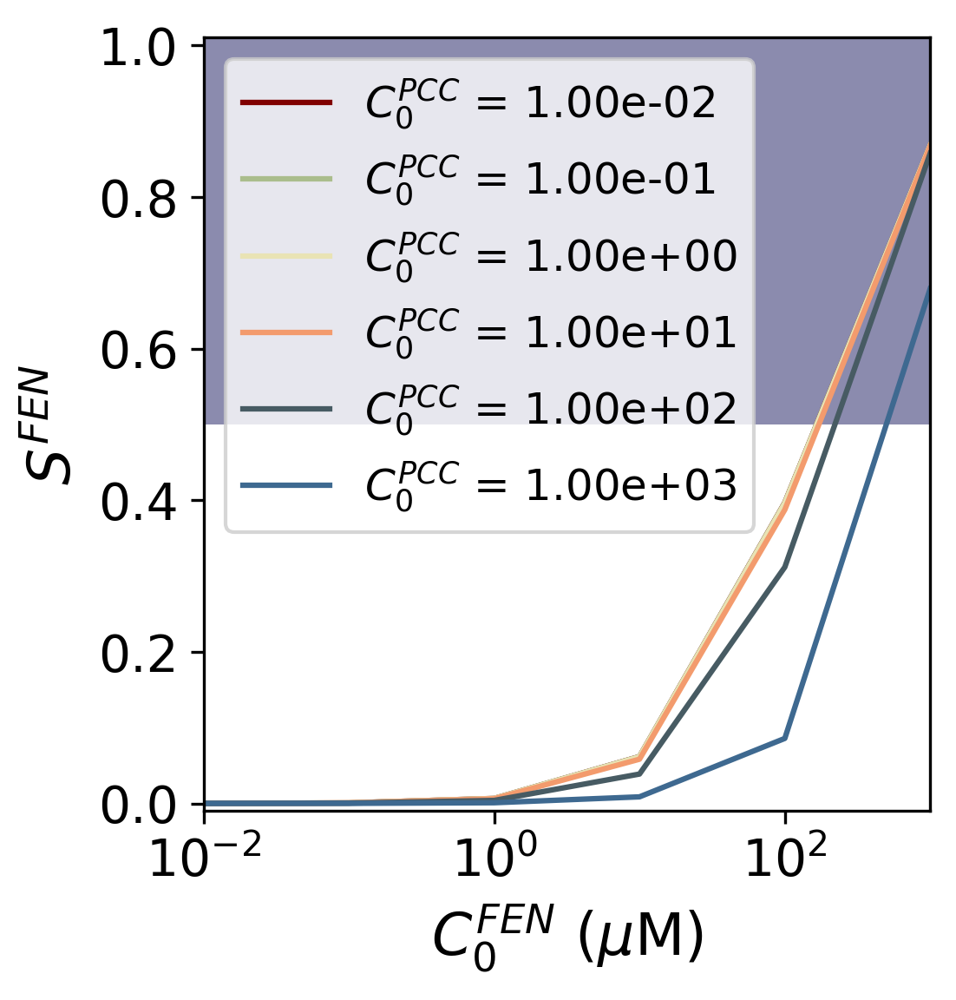

In [71]:
fig, ax = plt.subplots(1, 1, dpi=300, figsize=(4, 4))
ax.set_ylabel(r"$S^{FEN}$", fontsize=16)
ax.set_xlabel(r"$C_0^{FEN}$ ($\mu$M)", fontsize=16)


# S vs. FEN 
C0_A = 0.0

C0_F_range = np.logspace(-2, 3, 6, dtype=np.longdouble) #muM
C0_P_range = np.logspace(-2, 3, 6, dtype=np.longdouble) #muM
colors = ["#800000", "#AABD8C", "#E9E3B4", "#F39B6D", "#475B63", '#3E6990']

for i, C0_P in enumerate(C0_P_range):
    S_vals = np.asarray([np.asarray(get_S(C0_P, C0_A, x)) for x in C0_F_range])
    ax.plot(C0_F_range, S_vals[:, 0], c=colors[i], label=r"$C_0^{PCC}$" + f" = {C0_P:.2e}")
    #axs[i].plot(C0_F_range, S_vals[:, 1], 'b', label=r"$S^{\text{ACT}}$")
    #axs[i].plot(C0_F_range, S_vals[:, 2], 'k--', label=r"$S^T$")
    ax.set_xscale("log")
    ax.set_ylim(-0.01, 1.01)
    ax.set_xlim(1e-2, 1e3)
    ax.tick_params(axis="both", labelsize=14)
    ax.axvspan(1e-2, 1e3, 0.5, 1.0, facecolor='#8B8BAE', alpha=0.6)
    ax.legend(loc='upper left')

plt.tight_layout()
# plt.savefig(f"/Users/arminsh/Documents/fenHTVS-man/figs/S_FEN.png")

In [72]:
from scipy.optimize import brentq

def get_S(C0_P, C0_F, C0_S, Kd_F, Kd_S):
    # equation for free probe concentration C_P
    C_P_fun = lambda x: x*(1 + C0_S/(Kd_S + x) + C0_F/(Kd_F + x)) - C0_P
    sol = root_scalar(C_P_fun, x0=C0_P/2, x1=C0_P*0.75)
    C_P = sol.root
    C_F = C0_F/(1 + C_P/Kd_F)
    C_S = C0_S/(1 + C_P/Kd_S)
    C_PF = C0_F - C_F
    C_PS = C0_S - C_S
    # print(C_S, C_PS)
    S_F = C_PF/C0_P
    S_S = C_PS/C0_P
    S_T = S_F + S_S
    # print(C_PF, C0_P, C_F, C0_F)
    if C0_F < 0:
        print('KKKK')
        print(C0_F)
    # print(C0_F)
    return S_F, S_S, S_T, C_F

def get_S_brent(
    C0_P, C0_F, C0_S, Kd_F, Kd_S,
    tol=1e-12, mass_tol=1e-12, return_species=False
):
    """
    Solve for free probe C_P from:
        C0_P = C_P * [ 1 + C0_F/(Kd_F + C_P) + C0_S/(Kd_S + C_P) ]   (mass balance)
    and report sensitivities S_F, S_S with enforced mass balance S_F+S_S = 1 - C_P/C0_P.

    Returns
    -------
    S_F, S_S, S_T  (and optionally a dict of species if return_species=True)
    """

    # --- sanitize inputs (physical constraints) ---
    C0_P = max(float(C0_P), 0.0)
    C0_F = max(float(C0_F), 0.0)
    C0_S = max(float(C0_S), 0.0)
    Kd_F = max(float(Kd_F), tol)
    Kd_S = max(float(Kd_S), tol)

    if C0_P == 0.0:
        out = (0.0, 0.0, 0.0)
        return (out, {"C_P":0.0,"C_F":C0_F,"C_S":C0_S,"C_PF":0.0,"C_PS":0.0}) if return_species else out

    # --- define monotone function f(x) (x is free probe concentration C_P) ---
    def f(x):
        return x * (1.0 + C0_F/(Kd_F + x) + C0_S/(Kd_S + x)) - C0_P

    # --- bracket the root: f(0) <= 0, f(b) > 0 ---
    a = 0.0
    fa = -C0_P  # f(0)
    b = max(C0_P, Kd_F + Kd_S, 1.0)
    fb = f(b)
    expand = 0
    while fb <= 0.0 and expand < 60:
        b *= 2.0
        fb = f(b)
        expand += 1
    if fb <= 0.0:
        raise RuntimeError("Failed to bracket root; check inputs.")

    # --- solve with Brent (robust for monotone functions) ---
    C_P = brentq(f, a, b, xtol=tol, rtol=tol, maxiter=200)

    # --- compute species (closed-form from equilibrium) ---
    C_F  = C0_F / (1.0 + C_P/Kd_F) if C0_F > 0.0 else 0.0
    C_S  = C0_S / (1.0 + C_P/Kd_S) if C0_S > 0.0 else 0.0
    C_PF = C0_F - C_F
    C_PS = C0_S - C_S

    # --- clip tiny negatives from roundoff ---
    eps = max(mass_tol, 1e-14)
    C_P  = max(C_P,  0.0)
    C_F  = min(max(C_F,  0.0), C0_F)
    C_S  = min(max(C_S,  0.0), C0_S)
    C_PF = min(max(C_PF, 0.0), C0_F)
    C_PS = min(max(C_PS, 0.0), C0_S)

    # --- mass balance check ---
    mb_res = C0_P - (C_P + C_PF + C_PS)
    if abs(mb_res) > mass_tol * max(1.0, C0_P):
        # Recompute S from exact identity S_T = 1 - C_P/C0_P;
        # (species remain as computed; we ensure S sums correctly)
        pass  # (we still fix S via renormalization below)

    # --- sensitivities with enforced mass balance ---
    # Exact total bound fraction from mass balance:
    S_T = 1.0 - C_P / C0_P
    S_T = min(max(S_T, 0.0), 1.0)

    # Raw splits from species:
    S_F_raw = C_PF / C0_P
    S_S_raw = C_PS / C0_P
    denom = S_F_raw + S_S_raw

    if denom > eps and S_T > 0.0:
        scale = S_T / denom
        S_F = S_F_raw * scale
        S_S = S_S_raw * scale
    else:
        # no binding (or underflow) -> both zero
        S_F = 0.0
        S_S = 0.0

    # final clamp
    S_F = min(max(S_F, 0.0), 1.0)
    S_S = min(max(S_S, 0.0), 1.0)
    S_T = min(max(S_T, 0.0), 1.0)

    if return_species:
        return (S_F, S_S, S_T), {
            "C_P": C_P, "C_F": C_F, "C_S": C_S,
            "C_PF": C_PF, "C_PS": C_PS,
            "mass_balance_residual": mb_res
        }
    else:
        return S_F, S_S, S_T, C_F


In [73]:
Kd_examples['NH2-prim-bcd'][0]
# S_vals = np.asarray([np.asarray(get_S(C0_P, x, 0, Kd_examples['NH2-prim-bcd'][0], Kd_examples['NH2-prim-bcd'][1])) for x in C0_F_range])
# S_vals
# get_S(C0_P, x, 0, Kd_examples['NH2-prim-bcd'][0], Kd_examples['NH2-prim-bcd'][1]), x
# plt.plot(C0_F_range)

3.832839996143149e-08

In [74]:
# list(Kd_examples.keys())
# Kd_examples
def sci_fmt(val):
    """LaTeX-style scientific notation; 1e-8 -> 1.0×10^{-8}, simplified to 10^{x} if coeff≈1."""
    exp = int(np.floor(np.log10(val)))
    coeff = val / 10**exp if val != 0 else 0.0
    if val == 0:
        return r'0'
    if np.isclose(coeff, 1.0):
        return rf'10^{{{exp}}}'
    return rf'{coeff:.1f}\times 10^{{{exp}}}'

In [75]:
# Kd_examples.keys()
list(Kd_examples.keys())
import matplotlib.colors as colors
# 0.05e-12

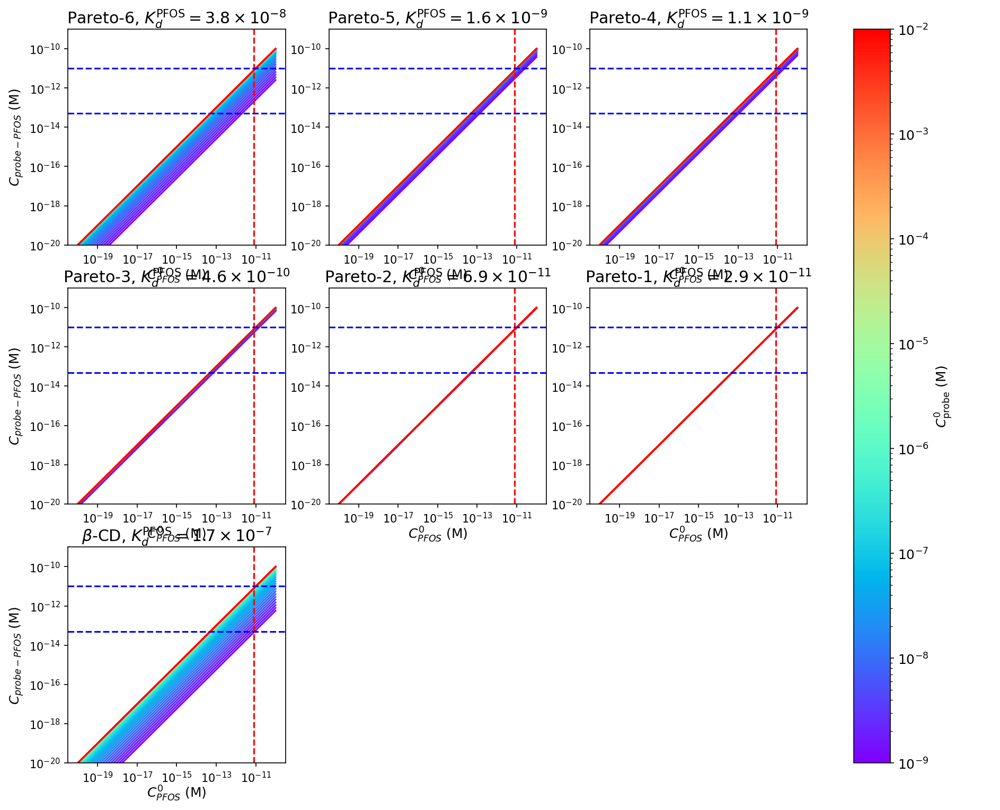

In [76]:
labels_pareto = ['Pareto-6', 'Pareto-5', 'Pareto-4', 'Pareto-3', 'Pareto-2', 'Pareto-1', r'$\beta$-CD']
figs_per_row = 3
systems = list(Kd_examples.keys())
n = len(systems)
ncols = min(figs_per_row, n)
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), sharex=False, sharey=False, dpi=150)
axes_flat = np.atleast_1d(axes).ravel()

C0_F_range = np.logspace(-20, -10, 200)  # M
C0_P_range = np.logspace(-9, -2, 50)     # M
norm = colors.LogNorm(vmin=C0_P_range.min(), vmax=C0_P_range.max())
cmap = cm.rainbow

for idx, system in enumerate(systems):
    ax = axes_flat[idx]
    Kd_pf, Kd_sds = Kd_examples[system][0], Kd_examples[system][1]
    for i, C0_P in enumerate(C0_P_range):
        S_vals = np.asarray([get_S(C0_P, x, 0, Kd_pf, Kd_sds) for x in C0_F_range])
        C_PF = S_vals[:, 0] * C0_P
        # ax.plot(C0_F_range, C_PF, c=colors[i], label=rf"$C^0_{{\mathrm{{probe}}}}={sci_fmt(C0_P)}$")
        ax.plot(C0_F_range,C_PF,c=cmap(norm(C0_P)))
    ax.axvline(8e-12, color='r', linestyle='--')
    ax.axhline(y=0.05e-12, color='b', linestyle='--')
    ax.axhline(y=10e-12, color='b', linestyle='--')
    ax.set_xscale("log")
    ax.set_yscale("log")
    # ax.set_title(system)
    # ax.set_title(fr'{labels_pareto[idx]}, $K_d = {Kd_pf}$')
    exp = int(np.floor(np.log10(Kd_pf)))
    # ax.set_title(fr'{labels_pareto[idx]}, $K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_pf)}$')
    ax.set_title(fr'{labels_pareto[idx]}, $K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_pf)}$', pad=0)
    ax.set_xlabel(r"$C^0_{PFOS}$ (M)", labelpad=0)
    ax.set_ylim(1e-20, 1e-9)
    ax.tick_params(axis="both", labelsize=10)
    if idx % ncols == 0:
        ax.set_ylabel(r"$C_{probe-PFOS}$ (M)")
    # ax.set_xlabel(r"$C^0_{PFOS}$ (M)")
    # ax.legend(fontsize="small", loc="best")

# hide any unused axes
for ax in axes_flat[n:]:
    ax.axis("off")

sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=axes_flat[:n],
    pad=0.05
)
cbar.set_label(r"$C^0_{\mathrm{probe}}$ (M)")

# plt.tight_layout()
# plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.show()

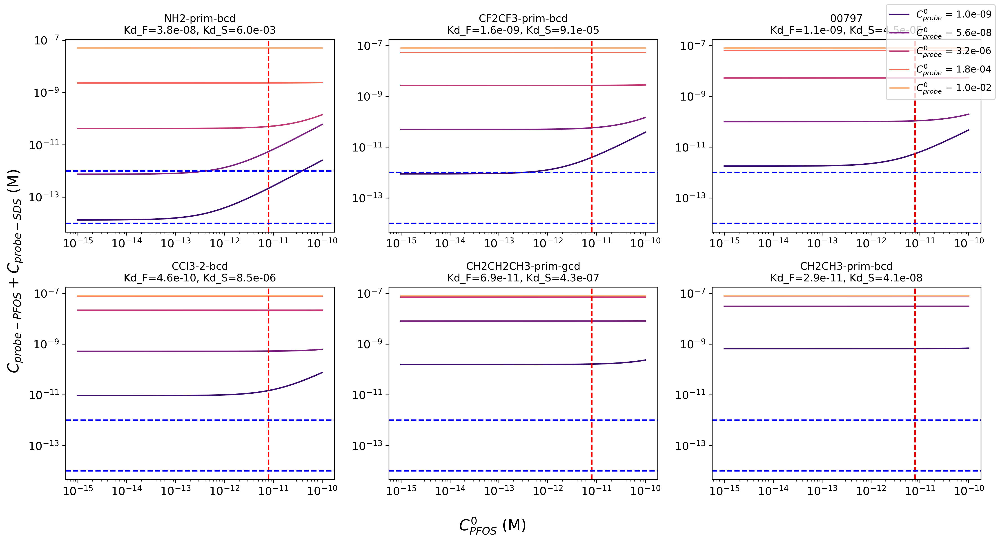

In [77]:
C0_F_range = np.logspace(-15, -10, 200)  # PFOS concentration [M]
C0_P_range = np.logspace(-9, -2, 5)     # Probe concentrations [M]
colors = cm.magma(np.linspace(0.2, 0.85, len(C0_P_range)))

systems = list(Kd_examples.keys())[:-1]
n_systems = len(systems)

nrows = 2
ncols = int(np.ceil(n_systems / nrows))

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(5*ncols, 4*nrows),
    sharex=False, sharey=False,
    dpi=300
)
axes = np.atleast_2d(axes).ravel()
C0_S=8e-8
# C0_S=0

for idx, system in enumerate(systems):
    ax = axes[idx]
    Kd_F, Kd_S = Kd_examples[system]

    # for i, C0_P in enumerate(C0_P_range):
    #     S_vals = np.asarray([
    #         np.asarray(get_S(C0_P, x, C0_S, Kd_F, Kd_S))
    #         for x in C0_F_range
    #     ])
    #     C_PF = S_vals[:, 0] * C0_P  # bound PFOS
    #     C_PS = S_vals[:, 1] * C0_S
    #     ax.plot(
    #         C0_F_range, C_PF+C_PS,
    #         c=colors[i],
    #         label=fr"$C^0_{{probe}}$ = {C0_P:.1e}"
    #     )

    for i, C0_P in enumerate(C0_P_range):
        S_vals = np.asarray([
            np.asarray(get_S(C0_P, x, C0_S, Kd_F, Kd_S))  # <- robust solver
            for x in C0_F_range
        ])
        C_PF = S_vals[:, 0] * C0_P
        C_PS = S_vals[:, 1] * C0_P     # <- FIX
        ax.plot(C0_F_range, C_PF + C_PS, c=colors[i], label=fr"$C^0_{{probe}}$ = {C0_P:.1e}")

    ax.axvline(x=8e-12, color='r', linestyle='--')
    ax.axhline(y=0.1e-13, color='b', linestyle='--')
    ax.axhline(y=10e-13, color='b', linestyle='--')
    ax.set_xscale("log")
    ax.set_yscale("log")
    # ax.set_ylim(1e-20, 1e-9)
    ax.tick_params(axis="both", labelsize=12)

    ax.set_title(f"{system}\nKd_F={Kd_F:.1e}, Kd_S={Kd_S:.1e}", fontsize=11)

# Global labels
fig.supxlabel(r"$C^0_{PFOS}$ (M)", fontsize=16)
fig.supylabel(r"$C_{probe-PFOS} + C_{probe-SDS}$ (M)", fontsize=16)

# Legend: put outside figure
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", fontsize=10)

plt.tight_layout()
plt.show()

In [78]:
Kd_examples, systems
# Kd_

({'NH2-prim-bcd': [3.832839996143149e-08, 0.005981371835535267],
  'CF2CF3-prim-bcd': [1.606726624342605e-09, 9.078726263221693e-05],
  '00797': [1.1447856555911236e-09, 4.4729075362716635e-05],
  'CCl3-2-bcd': [4.6371538184016726e-10, 8.537949998056976e-06],
  'CH2CH2CH3-prim-gcd': [6.853342003313369e-11, 4.3038728919627404e-07],
  'CH2CH3-prim-bcd': [2.944406624919765e-11, 4.105024661264934e-08],
  'bcd-pfos': [1.7294033083551803e-07, 1.01892724751261e-05]},
 ['NH2-prim-bcd',
  'CF2CF3-prim-bcd',
  '00797',
  'CCl3-2-bcd',
  'CH2CH2CH3-prim-gcd',
  'CH2CH3-prim-bcd'])

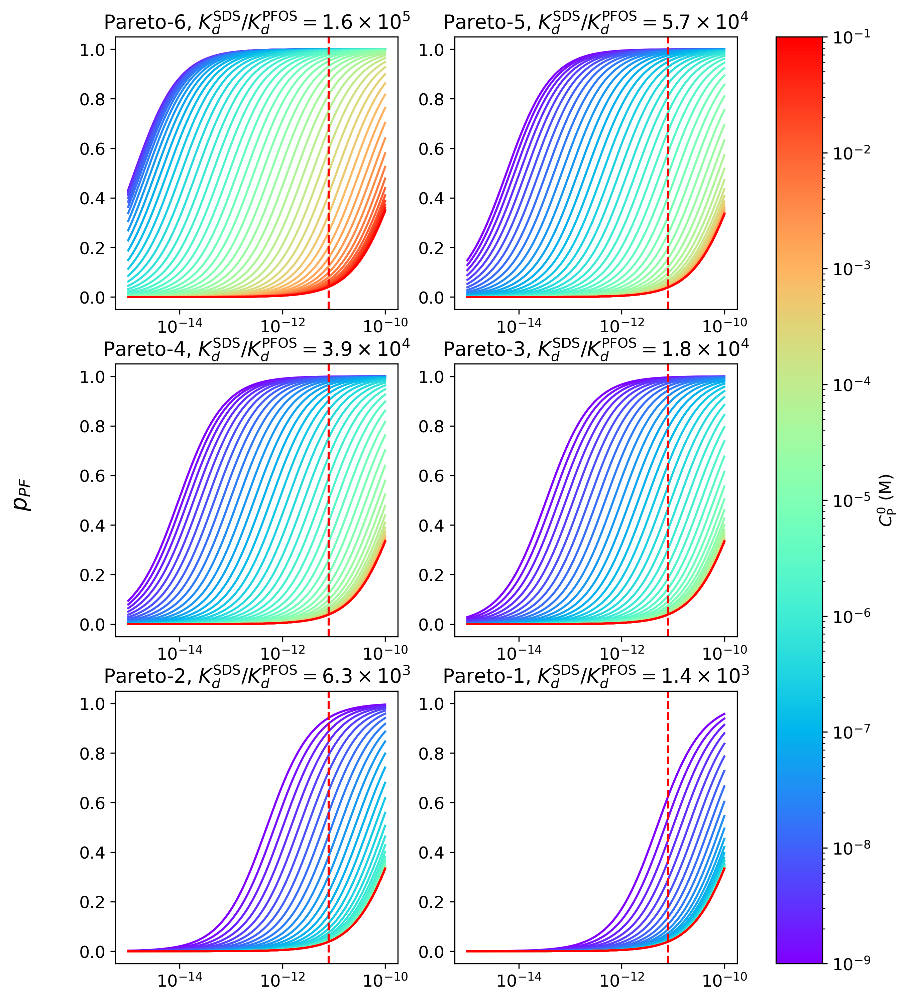

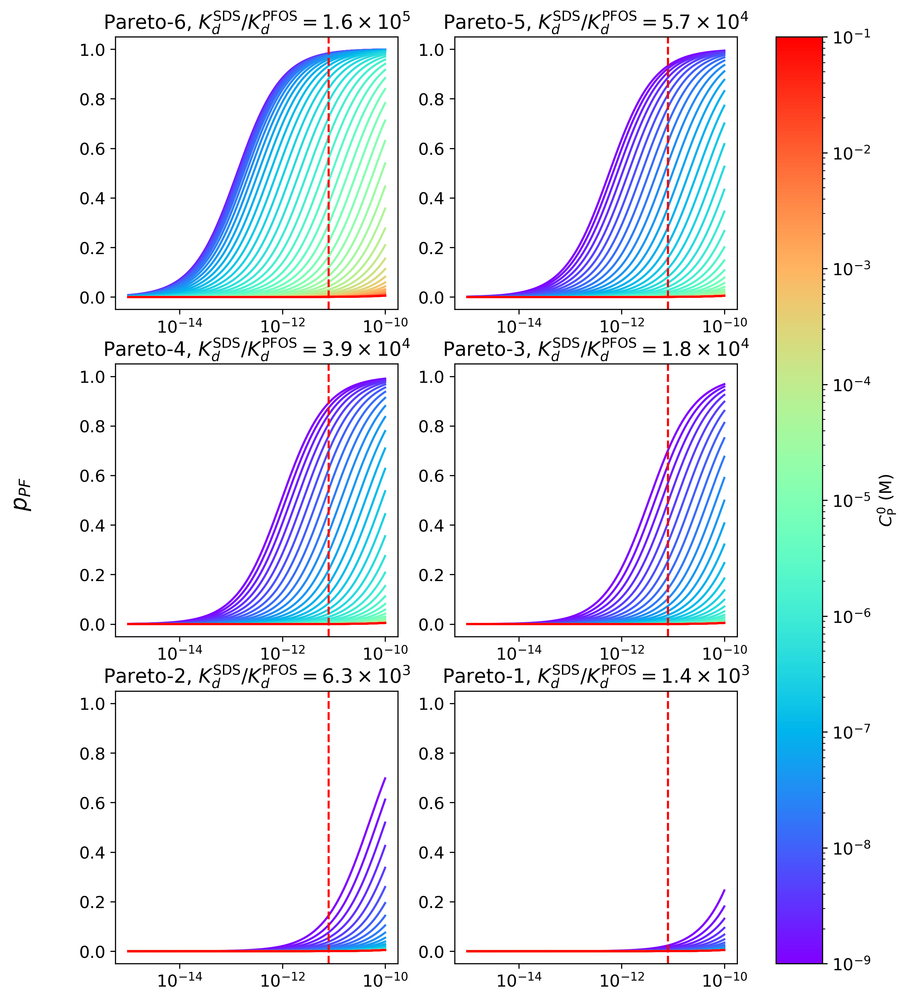

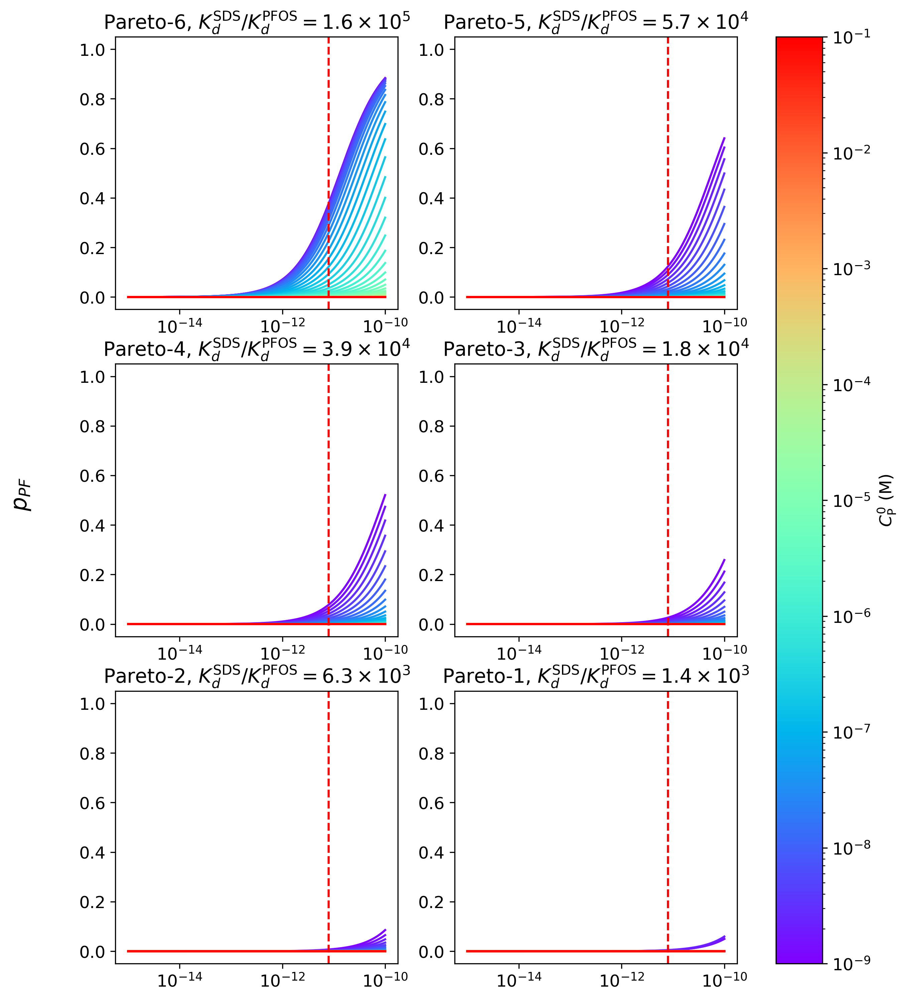

In [79]:
from matplotlib.colors import LogNorm

C0_F_range = np.logspace(-15, -10, 200)  # PFOS concentration [M]
C0_P_range = np.logspace(-9, -1, 50)    # Probe concentrations [M] (200 points)
cmap = cm.rainbow
norm = LogNorm(vmin=C0_P_range.min(), vmax=C0_P_range.max())

systems = list(Kd_examples.keys())[:-1]
# systems = 
n_systems = len(systems)

nrows = 3
ncols = int(np.ceil(n_systems / nrows))

# DONT remove COMMENTS

# C0_S = 0.2 * 1e-9 #0.2 nM
# C0_S = 20 * 1e-9  #20 nM
# C0_S = 2000 * 1e-9  #2000 nM
# C0_S = 0
sds_labels = [0.2,20,2000]
sds_conct = [0.2 * 1e-9, 20 * 1e-9, 2000 * 1e-9]
# sds_conct = [0]
for i, C0_S in enumerate(sds_conct):
    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(5*ncols, 4*nrows),
        sharex=False, sharey=False,
        dpi=300
    )
    axes = np.atleast_2d(axes).ravel()
    for idx, system in enumerate(systems):
        ax = axes[idx]
        Kd_F, Kd_S = Kd_examples[system]

        for C0_P in C0_P_range:
            S_vals = np.asarray([np.asarray(get_S(C0_P, x, C0_S, Kd_F, Kd_S)) for x in C0_F_range])
            C_PF = S_vals[:, 0] * C0_P
            C_PS = S_vals[:, 1] * C0_P
            denom = C_PF + C_PS
            pf = np.divide(C_PF, denom, out=np.zeros_like(C_PF), where=denom>0)
            ax.plot(C0_F_range, pf, c=cmap(norm(C0_P)))
            # ax.plot(C0_F_range, C_PF + C_PS, c=cmap(norm(C0_P)))
            ax.set_ylim(-0.05, 1.05)

        ax.axvline(x=8e-12, color='r', linestyle='--')
        # ax.axhline(y=0.05e-12, color='b', linestyle='--')
        # ax.axhline(y=10e-12, color='b', linestyle='--')
        ax.set_xscale("log")
        # ax.set_yscale("log")
        ax.tick_params(axis="both", labelsize=12)
        # ax.set_title(f"{labels_pareto[idx]}, Kd_F={Kd_F:.1e}, Kd_S={Kd_S:.1e}", fontsize=11)
        ax.set_title(rf"{labels_pareto[idx]}, $K_d^{{\mathrm{{SDS}}}}/K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_S/Kd_F)}$", fontsize=14)
        # ax.set_title(rf"{labels_pareto[idx]}, $K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_F)}$", fontsize=14)

    # hide unused axes
    for ax in axes[n_systems:]:
        ax.axis("off")

    # Global labels
    # fig.supxlabel(r"$C^0_{PFOS}$ (M)", fontsize=16)
    # fig.supxlabel(r"$C^0_{F}$ (M)", fontsize=16)
    fig.supylabel(r"$p_{PF}$", fontsize=16)
    # fig.supylabel(r"$C_{PF} + C_{PS}$ (M)", fontsize=16)


    # colorbar
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    fig.colorbar(sm, ax=axes[:n_systems].tolist(), pad=0.05, label=r"$C^0_{\mathrm{P}}$ (M)")

    # plt.tight_layout()
    # plt.show()
    # plt.savefig(f'selectivity_conct_Cpf_sds_{str(sds_labels[i])}nM.png', dpi=300)
    # plt.savefig(f'selectivity_conct_pf_sds_{str(sds_labels[i])}nM.png', dpi=300)
    # plt.savefig('sensitivity_conct.png', dpi=300)
    # plt.show()
    # plt.savefig('selectivity_conct_pf_sds_2000nM.png', dpi=300)
# plt.savefig('sensitivity_conct.png', dpi=300)



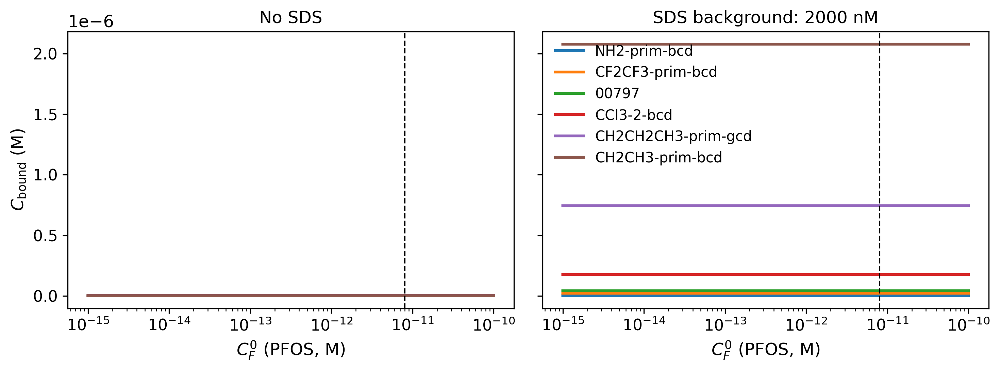

In [80]:
# import numpy as np
# import matplotlib.pyplot as plt

def compute_binding_metrics(C0_P, C0_F, C0_S, Kd_F, Kd_S):
    """
    Returns C_PF, C_PS, C_bound, p_PF for scalar inputs.
    Assumes get_S(C0_P, C0_F, C0_S, Kd_F, Kd_S) -> (theta_PF, theta_PS, ...)
    where theta are fractional occupancies of probe sites.
    """
    S_vals = np.asarray(get_S(C0_P, C0_F, C0_S, Kd_F, Kd_S))
    theta_PF = S_vals[0]
    theta_PS = S_vals[1]

    C_PF = theta_PF * C0_P
    C_PS = theta_PS * C0_P
    C_bound = C_PF + C_PS

    denom = C_bound
    p_PF = (C_PF / denom) if denom > 0 else 0.0
    return C_PF, C_PS, C_bound, p_PF


# -----------------------------
# USER CONTROLS
# -----------------------------
C0_F_range = np.logspace(-15, -10, 250)     # PFOS titration [M]
C0_S_list  = [0.0, 2000e-9]                 # SDS backgrounds [M] (0 and stress-test)
C0_P_fixed = 1e-6                           # choose a representative probe loading [M]
PFOS_MCL   = 8e-12                          # MCL marker [M]

# Choose a small set of probes to keep the plot readable
# Example: beta-CD + Pareto-1 + Pareto-6. Adjust to match your keys.
probe_keys = [
    'bcd',      # <-- replace with your actual beta-CD key in Kd_examples
    'Pareto-1', # <-- replace with actual keys used in Kd_examples
    'Pareto-6'
]

probe_keys = systems

# If you prefer to use your labels_pareto mapping, define a label dict:
# label_map = {k: labels_pareto[idx]} etc. Here we fall back to the key itself.
label_map = {k: k for k in probe_keys}

# Choose signal type: "C_bound" (default) or "C_PF"
signal_mode = "C_bound"  # or "C_PF"


# -----------------------------
# Compute a "detectable window" from beta-CD at MCL (optional but concrete)
# Define it as [0.5x, 2x] the beta-CD signal at MCL, at the same C0_P_fixed and SDS=0.
# -----------------------------
Kd_F_b, Kd_S_b = Kd_examples[probe_keys[0]]
C_PF_b, C_PS_b, C_bound_b, _ = compute_binding_metrics(C0_P_fixed, PFOS_MCL, 0.0, Kd_F_b, Kd_S_b)
beta_signal_at_mcl = C_bound_b if signal_mode == "C_bound" else C_PF_b
detect_lo = 0.5 * beta_signal_at_mcl
detect_hi = 2.0 * beta_signal_at_mcl


# -----------------------------
# Plot
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(10, 3.8), dpi=300, sharey=True)

for ax, C0_S in zip(axes, C0_S_list):
    for k in probe_keys:
        Kd_F, Kd_S = Kd_examples[k]
        y = []
        for C0_F in C0_F_range:
            C_PF, C_PS, C_bound, _ = compute_binding_metrics(C0_P_fixed, C0_F, C0_S, Kd_F, Kd_S)
            y.append(C_bound if signal_mode == "C_bound" else C_PF)
        y = np.asarray(y)

        ax.plot(C0_F_range, y, linewidth=2, label=label_map.get(k, k))

    # MCL marker
    ax.axvline(PFOS_MCL, color='k', linestyle='--', linewidth=1)

    # Detectable response band (anchored to beta-CD at MCL)
    ax.axhspan(detect_lo, detect_hi, alpha=0.15)

    ax.set_xscale("log")
    ax.tick_params(axis="both", labelsize=11)

    if C0_S == 0.0:
        ax.set_title("No SDS", fontsize=12)
    else:
        ax.set_title(rf"SDS background: {C0_S*1e9:.0f} nM", fontsize=12)

axes[0].set_ylabel(r"$C_{\mathrm{bound}}$ (M)" if signal_mode == "C_bound" else r"$C_{PF}$ (M)", fontsize=12)
for ax in axes:
    ax.set_xlabel(r"$C_F^0$ (PFOS, M)", fontsize=12)

axes[1].legend(frameon=False, fontsize=10)
plt.tight_layout()
plt.show()

In [81]:
for k in list(Kd_examples.keys())[:-1]:
    print(ddG_data[k])

ddG_data['bcd']

[-29.825862602460898, 0.9101726810068761]
[-27.29386740810415, 2.3824149801953802]
[-26.369370879891378, 2.351906148040218]
[-24.496163632009363, 1.011022565976298]
[-21.813714525645622, 2.4785210239545195]
[-18.058448845571952, 2.0665831151879877]


[-10.165228376121231, 0.4058659465524757]

In [82]:
for k in list(Kd_examples.keys())[:-1]:
    print(dG_data[k+'-pfos'])

dG_data['bcd-pfos']

[-42.59453086247871, 0.379182390086025]
[-50.50763745854527, 1.4197989045709272]
[-51.3493011725278, 1.7510373151906709]
[-53.60706737758805, 0.6693414675030749]
[-58.37645068476684, 1.315242637032796]
[-60.48284435711601, 0.6856288816763226]


[-38.835292932474616, 0.1592026394637171]

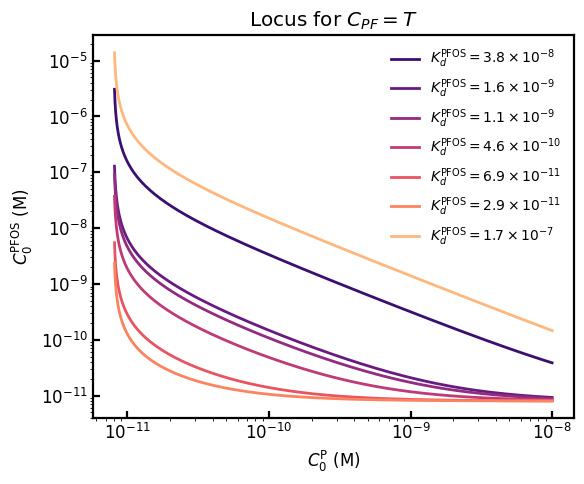

In [83]:

import matplotlib.cm as cm

def sci_fmt(val):
    """LaTeX-style scientific notation; 1e-8 -> 1.0×10^{-8}, simplified to 10^{x} if coeff≈1."""
    exp = int(np.floor(np.log10(val)))
    coeff = val / 10**exp if val != 0 else 0.0
    if val == 0:
        return r'0'
    if np.isclose(coeff, 1.0):
        return rf'10^{{{exp}}}'
    return rf'{coeff:.1f}\times 10^{{{exp}}}'

def locus_for_target_bound(T, Kd_F, C_P_grid):
    """Return (C0_F, C0_P, S_F) for target bound T with given Kd_F."""
    C0_P = C_P_grid + T
    C0_F = T * (1.0 + Kd_F / C_P_grid)
    S_F  = T / C0_P
    return C0_F, C0_P, S_F

# --- parameters ---
T = 8e-12      # target C_PF (M)
C_P_grid = np.logspace(-13, -8, 200)

# color map
colors = cm.magma(np.linspace(0.2, 0.85, len(Kd_examples)))

plt.figure(figsize=(6,5))

for (kd_label, kd_val), color in zip(Kd_examples.items(), colors):
    Kd_F, Kd_S = kd_val
    C0_F, C0_P, S_F = locus_for_target_bound(T, Kd_F, C_P_grid)
    plt.loglog(C0_P, C0_F, lw=2, color=color,
               label=rf'$K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_F)}$')

plt.xlabel(r'$C_0^{\mathrm{P}}$ (M)')
plt.ylabel(r'$C_0^{\mathrm{PFOS}}$ (M)')
plt.title(r'Locus for $C_{PF}=T$')

# Styling: thick spines, inward ticks
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.6)
ax.tick_params(direction="in", width=1.6, length=5)

plt.legend(frameon=False, fontsize=10)
plt.tight_layout()
plt.show()


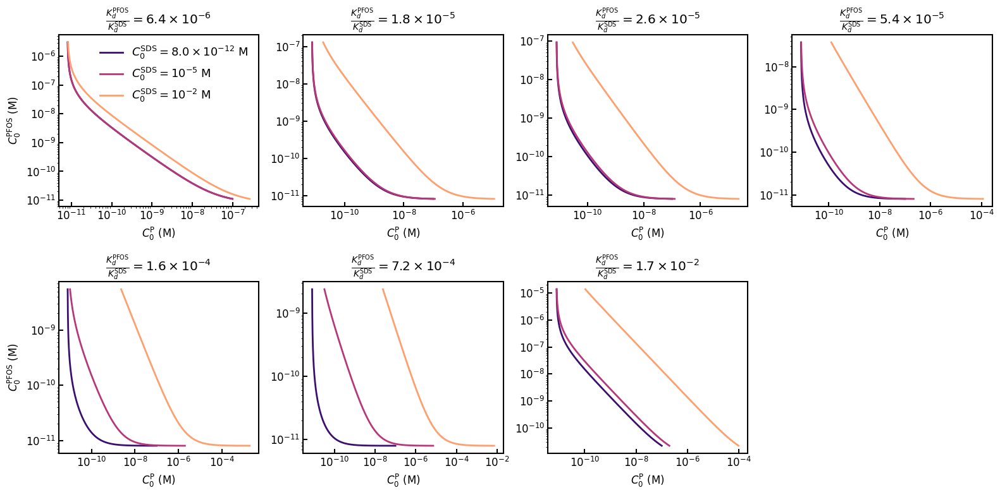

In [84]:
import matplotlib.cm as cm

def sci_fmt(val):
    """LaTeX-style scientific notation, e.g. 1e-8 -> 1.0×10^{-8}"""
    exp = int(np.floor(np.log10(val)))
    coeff = val / 10**exp
    if np.isclose(coeff, 1.0):
        return rf'10^{{{exp}}}'
    else:
        return rf'{coeff:.1f}\times 10^{{{exp}}}'

def locus_target_with_SDS(T, Kd_F, Kd_S, C0_S, C_P_grid):
    C0_F = T * (1.0 + Kd_F / C_P_grid)
    C_PS = C0_S * (C_P_grid / (Kd_S + C_P_grid))
    C0_P = C_P_grid + T + C_PS
    S_F  = T / C0_P
    S_S  = C_PS / C0_P
    return C0_F, C0_P, S_F, S_S

# Parameters
T = 8e-12  # target bound PFOS (M)
C0_S_list = [8e-12, 1e-5, 1e-2]  # SDS totals
C_P_grid = np.logspace(-13, -7, 300)

# Example: dictionary of Kd pairs
# Kd_examples = {"set1": (1e-8, 1e-5), "set2": (1e-7, 1e-6), ...}
nrows = 2
ncols = int(np.ceil(len(Kd_examples) / nrows))

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), sharex=False, sharey=False)
axes = axes.ravel()

colors = cm.magma(np.linspace(0.2, 0.8, len(C0_S_list)))

for i, (kd_label, kd_val) in enumerate(Kd_examples.items()):
    ax = axes[i]
    Kd_F, Kd_S = kd_val

    for c, C0_S in zip(colors, C0_S_list):
        C0_F, C0_P, S_F, S_S = locus_target_with_SDS(T, Kd_F, Kd_S, C0_S, C_P_grid)
        ax.loglog(C0_P, C0_F, color=c, lw=2, label=rf'$C_0^{{\mathrm{{SDS}}}}={sci_fmt(C0_S)}$ M')

    ax.set_xlabel(r'$C_0^{\mathrm{P}}$ (M)')
    if i % ncols == 0:
        ax.set_ylabel(r'$C_0^{\mathrm{PFOS}}$ (M)')
    # ax.set_title(rf'$K_d^{{\mathrm{{PFOS}}}}={sci_fmt(Kd_F)}$ | $K_d^{{\mathrm{{SDS}}}}={sci_fmt(Kd_S)}$')
    ratio = Kd_F / Kd_S
    ax.set_title( rf'$\frac{{K_d^{{\mathrm{{PFOS}}}}}}{{K_d^{{\mathrm{{SDS}}}}}} = {sci_fmt(ratio)}$')
    
    
    # ax.text(
    #     0.4, 0.96,
    #     rf'$\frac{{K_d^{{\mathrm{{PFOS}}}}}}{{K_d^{{\mathrm{{SDS}}}}}} = {sci_fmt(ratio)}$',
    #     transform=ax.transAxes, va='top', ha='left',
    #     fontsize=14, bbox=dict(boxstyle='round,pad=0.25', facecolor='white', alpha=0.6, lw=0)
    # )

    # Styling: thick borders, inner ticks
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    ax.tick_params(direction="in", width=1.5, length=5)

    if i == 0:
        ax.legend(frameon=False, fontsize=13)

# Hide unused panels if any
for j in range(len(Kd_examples), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [85]:
# for kd_label, kd_val in Kd_examples.items():
#     plt.figure(figsize=(4,4))
#     Kd_F, Kd_S = kd_val
#     for C0_S in C0_S_list:
#         C0_F, C0_P, S_F, S_S = locus_target_with_SDS(T, Kd_F, Kd_S, C0_S, C_P_grid)
#         plt.semilogx(C0_F, S_F, label=fr'$C_0^S={C0_S:.0e}$ M')
#         plt.semilogx(C0_F, S_S, label=fr'$C_0^S={C0_S:.0e}$ M')
#         plt.xlabel(r'$C_0^{\mathrm{F}}$ (M)')
#         plt.ylabel(r'$S$')
#         plt.legend(frameon=False)
#         plt.title(f'Kd_F = {Kd_F:.1e} | Kd_S = {Kd_S:.1e}')
#     # break
#     plt.show()
# # plt.title(fr'Locus for $C_{{PF}}=T={T:.1e}$ M with SDS present')
# # plt.grid(True, which='both', ls='--', alpha=0.3)

# # plt.tight_layout()
# # plt.show()


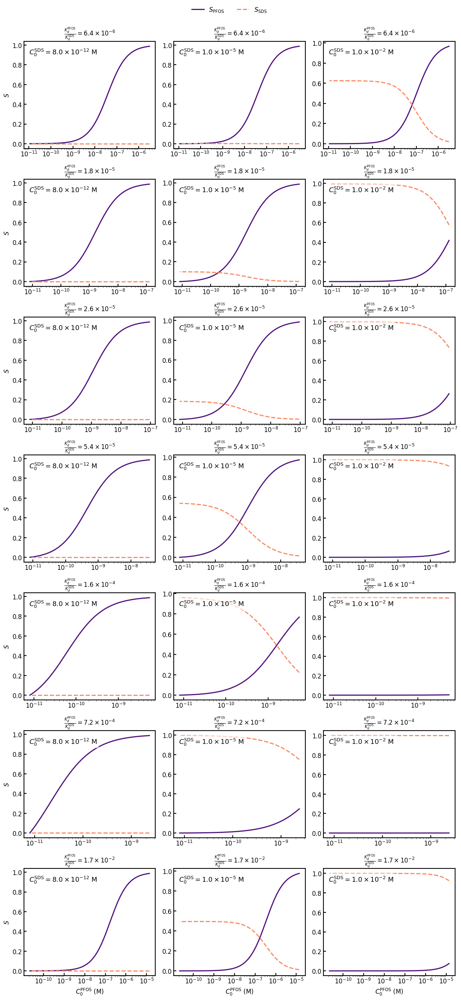

In [86]:
def sci_fmt(val):
    """Format a float in LaTeX-style scientific notation, e.g. 1e-08 -> 1.0 × 10^{-8}"""
    exp = int(np.floor(np.log10(val)))
    coeff = val / 10**exp
    return rf'{coeff:.1f}\times 10^{{{exp}}}'

# figure layout
kd_items = list(Kd_examples.items())
nrows = len(kd_items)
ncols = len(C0_S_list)

fig, axes = plt.subplots(
    nrows, ncols, figsize=(4.2*ncols, 3.8*nrows),
    sharex=False, sharey=False
)
if nrows == 1:
    axes = np.array([axes])
if ncols == 1:
    axes = axes[:, None]

# two magma colors for S_F (solid) and S_SDS (dashed)
c_sf, c_ss = cm.magma(0.25), cm.magma(0.75)

for i, (kd_label, (Kd_F, Kd_S)) in enumerate(kd_items):
    ratio = Kd_F / Kd_S
    for j, C0_S in enumerate(C0_S_list):
        ax = axes[i, j]

        C0_F, C0_P, S_F, S_S = locus_target_with_SDS(T, Kd_F, Kd_S, C0_S, C_P_grid)

        # two curves: magma colors
        ax.semilogx(C0_F, S_F,  '-', lw=2.2, color=c_sf, label=r'$S_{\mathrm{PFOS}}$')
        ax.semilogx(C0_F, S_S, '--', lw=2.2, color=c_ss, label=r'$S_{\mathrm{SDS}}$')

        # SDS label inside panel
        ax.text(0.04, 0.94, rf'$C_0^{{\mathrm{{SDS}}}} = {sci_fmt(C0_S)}$ M',
                transform=ax.transAxes, ha='left', va='top',
                fontsize=13, bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='none', alpha=0.65))

        # title = ratio in each subplot
        ax.set_title(rf'$\frac{{K_d^{{\mathrm{{PFOS}}}}}}{{K_d^{{\mathrm{{SDS}}}}}} = {sci_fmt(ratio)}$',
                     fontsize=12, pad=6)

        # styling: thick spines, inner ticks
        for sp in ax.spines.values():
            sp.set_linewidth(1.6)
        ax.tick_params(direction='in', width=1.6, length=5)

        # axis labels only on left / bottom
        if i == nrows - 1:
            ax.set_xlabel(r'$C_0^{\mathrm{PFOS}}$ (M)')
        if j == 0:
            ax.set_ylabel(r'$S$')

# one legend for the whole figure
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.02))

plt.tight_layout()
plt.show()

### Aux PFOA comparisons

In [87]:
# chem_space['00006']['dG_md']
# dG_data['00006-pfos']
pfoa_keys = []
chem_space['00006']['dG_md']
for k in dG_data.keys():
    if 'pfos' in k:
        # print(k, dG_data[k])
        for j in pfoa_keys:
            if j in chem_space.keys():
                if chem_space[j]['dG_md'][0] == dG_data[k][0]:
                    print(k, j)

In [88]:

key_mapping = {
   '00074': 'CCl-prim-bcd',
   '00006': 'CCl3-2-bcd',
   '00027': 'CH3-prim-bcd',
   '00022': 'CH2CH3-prim-bcd',
   '00021': 'CH2CH2CH3-prim-gcd',
   '00041': 'NH2-prim-bcd'
}
pfoa_keys

[]

In [90]:
# # dG_pfoa

# dG_pfos_conv = {}
# for k in dG_pfoa:
#     if k.split('-pfoa')[0] in key_mapping.keys():
#         sys_name = key_mapping[k.split('-pfoa')[0]]
#         dG_pfos_conv[sys_name] = dG_pfoa[k]
#     else:
#         dG_pfos_conv[k+'-pfoa'] = dG_pfoa[k]

# dG_pfos_conv

In [ ]:
# len(pfoa_keys)
# dG_pfoa_conv
# dG_pfoa.keys()

dict_keys(['bcd-pfoa', '00006-pfoa', '00027-pfoa', '00022-pfoa', '00021-pfoa', '00041-pfoa', '00797-pfoa', '00074-pfoa', '00709-pfoa', '00079-pfoa', '00464-pfoa', '00523-pfoa', 'CBr-prim-bcd-pfoa', 'CCl3-prim-bcd-pfoa', 'CH2CH2CH3-prim-bcd-pfoa', 'Cl-both-bcd-pfoa', 'Cl-prim-bcd-pfoa', 'COC-4-bcd-pfoa'])

In [91]:
# pfoa compare
label_path = '/home/siddarthachar/pfos/gpr/pfos-working/data/'
with open(f'{label_path}/dG_data_pfoa_2.pkl', 'rb') as f:
    dG_pfoa = pickle.load(f)

# pfoa_keys = [x.split('-pfoa')[0] for x in dG_pfoa.keys()]
old = 'CBr-prim-bcd-pfoa'
new = 'CBr3-prim-bcd-pfoa'
if old in dG_pfoa:
    if new in dG_pfoa:
        # New key already exists — prefer existing value, remove old key
        del dG_pfoa[old]
        print(f"Removed legacy key '{old}' (kept existing '{new}').")
    else:
        dG_pfoa[new] = dG_pfoa.pop(old)
        print(f"Renamed '{old}' -> '{new}'.")
else:
    print(f"Key '{old}' not found; no change made.")

key_mapping = {
   '00074': 'CCl-prim-bcd',
   '00006': 'CCl3-2-bcd',
   '00027': 'CH3-prim-bcd',
   '00022': 'CH2CH3-prim-bcd',
   '00021': 'CH2CH2CH3-prim-gcd',
   '00041': 'NH2-prim-bcd'
}

dG_pfoa_conv = {}
for k in dG_pfoa:
    if k.split('-pfoa')[0] in key_mapping.keys():
        sys_name = key_mapping[k.split('-pfoa')[0]]
        # print('sys', sys_name)
        dG_pfoa_conv[sys_name+'-pfoa'] = dG_pfoa[k]
    else:
        # print(k)
        dG_pfoa_conv[k] = dG_pfoa[k]

# dG_pfoa
# dG_data
pfoa_keys = [x.split('-pfoa')[0] for x in dG_pfoa_conv.keys()]
dG_pfos_9 = [dG_data[f'{x}-pfos'] for x in pfoa_keys]
ddG_pfos_9 = [ddG_data[f'{x}'] for x in pfoa_keys]
dG_sds_9 = [dG_data[f'{x}-sds'] for x in pfoa_keys]
dG_pfoa_9 = [dG_pfoa_conv[f'{x}-pfoa'] for x in pfoa_keys]

dG_pfos_9, dG_pfoa_9, dG_sds_9


ddG_pfoa_9 = [[x[0]-y[0],(x[1]**2 + y[1]**2)**0.5] for x,y in zip(dG_pfoa_9, dG_sds_9)]
# ddG_value_pfoa = dG_data[key][0] - dG_data[sds_key][0]
# ddG_error = (dG_data[key][1]**2 + dG_data[sds_key][1]**2) ** 0.5  # Error propagation
# ddG_pfoa_9, ddG_pfos_9

Renamed 'CBr-prim-bcd-pfoa' -> 'CBr3-prim-bcd-pfoa'.


In [92]:
# dG_pfoa
# # dG_pfoa_9, dG_pfos_9
# # dG_pfoa, dG_data['CBr-prim-bcd-pfos']
# for k in chem_space.keys():
#     if 'C(Br)(Br)Br' in chem_space[k]['primary']:
#         if chem_space[k]['dG_md'] is not None:
#             print(k, chem_space[k]['dG_md'], chem_space[k]['primary'])

# dG_data['CBr3-prim-bcd-pfos']

In [93]:
# plt.plot([x[0] for x in dG_pfos_9])
# plt.plot([x[0] for x in dG_pfoa_9])
# plt.show()
# plt.plot([x[0] for x in ddG_pfos_9])
# plt.plot([x[0] for x in ddG_pfoa_9])

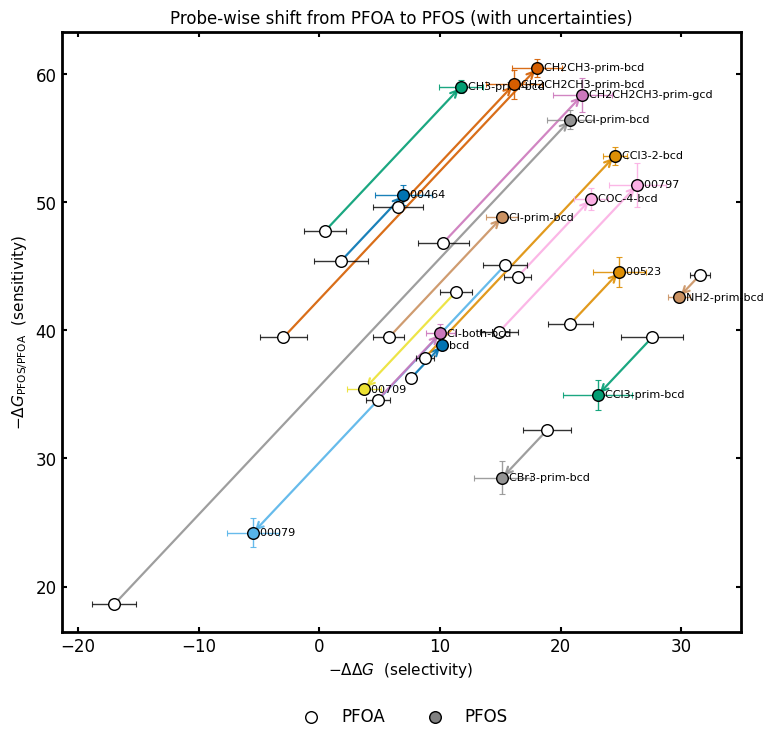

In [94]:
# Unpack means/stds and use the same sign convention as before: x = -ddG (selectivity), y = -dG (sensitivity)
def unpack_mean_std(list_of_pairs):
    means = np.array([m for m, s in list_of_pairs], dtype=float)
    stds  = np.array([s for m, s in list_of_pairs], dtype=float)
    return means, stds

ddG_pfos_mean, ddG_pfos_std = unpack_mean_std(ddG_pfos_9)
dG_pfos_mean,  dG_pfos_std  = unpack_mean_std(dG_pfos_9)

ddG_pfoa_mean, ddG_pfoa_std = unpack_mean_std(ddG_pfoa_9)
dG_pfoa_mean,  dG_pfoa_std  = unpack_mean_std(dG_pfoa_9)

# Axes: -ddG vs -dG
X_pfos, Xerr_pfos = -ddG_pfos_mean, ddG_pfos_std
Y_pfos, Yerr_pfos = -dG_pfos_mean,  dG_pfos_std

X_pfoa, Xerr_pfoa = -ddG_pfoa_mean, ddG_pfoa_std
Y_pfoa, Yerr_pfoa = -dG_pfoa_mean,  dG_pfoa_std

# Colors per probe
palette = sns.color_palette("colorblind", n_colors=len(pfoa_keys))

fig, ax = plt.subplots(figsize=(8, 8))

for i, key in enumerate(pfoa_keys):
    c = palette[i]

    # PFOA point (hollow) with error bars
    ax.errorbar([X_pfoa[i]], [Y_pfoa[i]],
                xerr=[Xerr_pfoa[i]], yerr=[Yerr_pfoa[i]],
                fmt='o', mfc='white', mec='black', mew=0.8, ms=7,
                ecolor='black', elinewidth=1.0, capsize=2.5, alpha=0.8, zorder=2)
    ax.scatter([X_pfoa[i]], [Y_pfoa[i]], facecolors='white', edgecolors='black', s=70, zorder=3)

    # PFOS point (filled) with error bars
    ax.errorbar([X_pfos[i]], [Y_pfos[i]],
                xerr=[Xerr_pfos[i]], yerr=[Yerr_pfos[i]],
                fmt='o', mfc=c, mec='black', mew=0.8, ms=7,
                ecolor=c, elinewidth=1.0, capsize=2.5, alpha=0.9, zorder=2)
    ax.scatter([X_pfos[i]], [Y_pfos[i]], color=c, edgecolors='black', s=70, zorder=3)

    # # Arrow from PFOA -> PFOS
    ax.annotate('', xy=(X_pfos[i], Y_pfos[i]), xytext=(X_pfoa[i], Y_pfoa[i]),
                arrowprops=dict(arrowstyle='->', color=c, lw=1.6, alpha=0.9), zorder=1)

    # (optional) small label near PFOS point
    ax.text(X_pfos[i], Y_pfos[i], f'  {key}', fontsize=8, va='center', color='black')

# Reference cross at 0,0 (optional)
# ax.axvline(0, color='k', lw=0.6, alpha=0.3)
# ax.axhline(0, color='k', lw=0.6, alpha=0.3)

ax.set_xlabel(r'$-\Delta\Delta G$  (selectivity)', fontsize=11)
ax.set_ylabel(r'$-\Delta G_{\mathrm{PFOS/PFOA}}$  (sensitivity)', fontsize=11)
ax.set_title('Probe-wise shift from PFOA to PFOS (with uncertainties)', fontsize=12)

# Legend: marker styles only (one row at bottom)
pf_handles = [
    ax.scatter([], [], facecolors='white', edgecolors='black', s=70, label='PFOA'),
    ax.scatter([], [], facecolors='gray', edgecolors='black', s=70, label='PFOS')
]
ax.legend(handles=pf_handles, frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.10), ncol=2)
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Thicker spines/ticks
for s in ax.spines.values():
    s.set_linewidth(2.0)
ax.tick_params(direction='in', right=True, top=True, width=1.5)

plt.show()


/tmp/ipykernel_503172/2125162972.py:68: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/tmp/ipykernel_503172/2125162972.py:68: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


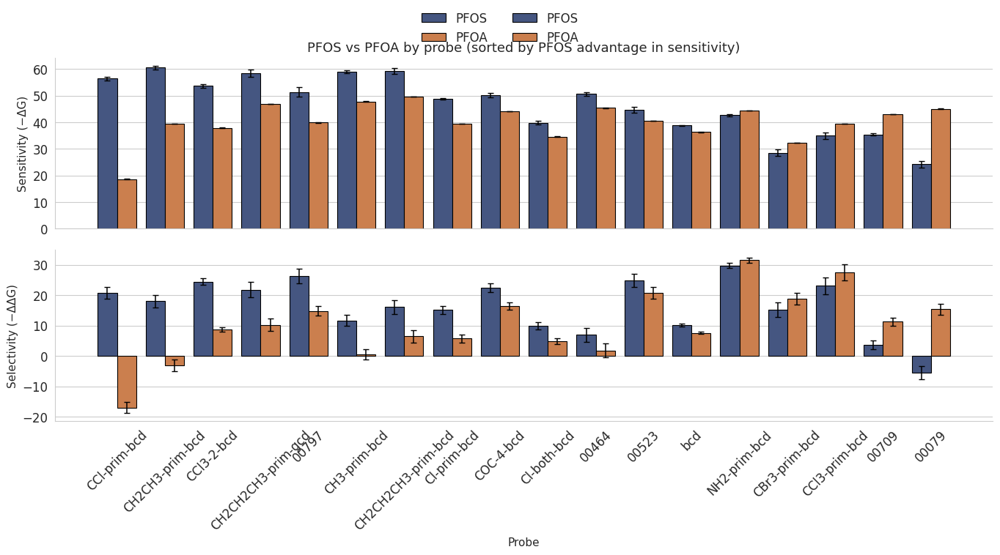

In [95]:
# -------------------
# 1. Unpack means/stds
# -------------------
def unpack_mean_std(list_of_pairs):
    means = np.array([m for m, s in list_of_pairs], dtype=float)
    stds  = np.array([s for m, s in list_of_pairs], dtype=float)
    return means, stds

ddG_pfos_mean, ddG_pfos_std = unpack_mean_std(ddG_pfos_9)
dG_pfos_mean,  dG_pfos_std  = unpack_mean_std(dG_pfos_9)
ddG_pfoa_mean, ddG_pfoa_std = unpack_mean_std(ddG_pfoa_9)
dG_pfoa_mean,  dG_pfoa_std  = unpack_mean_std(dG_pfoa_9)

# -------------------
# 2. Convert to same sign convention (larger = better)
# -------------------
sens_pfos = -dG_pfos_mean;  sens_pfos_std = dG_pfos_std
sens_pfoa = -dG_pfoa_mean;  sens_pfoa_std = dG_pfoa_std
sel_pfos  = -ddG_pfos_mean; sel_pfos_std  = ddG_pfos_std
sel_pfoa  = -ddG_pfoa_mean; sel_pfoa_std  = ddG_pfoa_std

# -------------------
# 3. Compute PFOS–PFOA differences (advantages)
# -------------------
pfos_adv_sens = sens_pfos - sens_pfoa   # >0 means PFOS binds stronger
pfos_adv_sel  = sel_pfos  - sel_pfoa    # >0 means PFOS more selective

# Choose sorting metric
sort_by = "sensitivity"  # or "selectivity"
if sort_by == "sensitivity":
    sort_values = pfos_adv_sens
elif sort_by == "selectivity":
    sort_values = pfos_adv_sel
else:
    raise ValueError("sort_by must be 'sensitivity' or 'selectivity'")

# Get sorted probe order (largest PFOS advantage first)
probe_order = [x for _, x in sorted(zip(sort_values, pfoa_keys), reverse=True)]

# -------------------
# 4. Build tidy DataFrame for bars
# -------------------
rows = []
for i, probe in enumerate(pfoa_keys):
    rows += [
        {"probe": probe, "metric": "Sensitivity (−ΔG)", "analyte": "PFOS",
         "mean": sens_pfos[i], "std": sens_pfos_std[i]},
        {"probe": probe, "metric": "Sensitivity (−ΔG)", "analyte": "PFOA",
         "mean": sens_pfoa[i], "std": sens_pfoa_std[i]},
        {"probe": probe, "metric": "Selectivity (−ΔΔG)", "analyte": "PFOS",
         "mean": sel_pfos[i],  "std": sel_pfos_std[i]},
        {"probe": probe, "metric": "Selectivity (−ΔΔG)", "analyte": "PFOA",
         "mean": sel_pfoa[i],  "std": sel_pfoa_std[i]},
    ]
df = pd.DataFrame(rows)

# -------------------
# 5. Plot grouped bars sorted by the chosen metric
# -------------------
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(max(8, 0.6*len(probe_order)+3), 7.5), sharex=True)
palette = {"PFOS": "#3b528b", "PFOA": "#e07b39"}

metric_order = ["Sensitivity (−ΔG)", "Selectivity (−ΔΔG)"]

for ax, metric in zip(axes, metric_order):
    data_m = df[df["metric"] == metric]
    sns.barplot(
        data=data_m, x="probe", y="mean", hue="analyte",
        order=probe_order, palette=palette,
        ci=None, dodge=True, edgecolor="black", linewidth=0.8, ax=ax
    )

    # Add error bars manually
    for i, probe in enumerate(probe_order):
        subset = data_m[data_m["probe"] == probe]
        for j, (analyte, color) in enumerate(palette.items()):
            mean = subset.loc[subset["analyte"] == analyte, "mean"].values[0]
            std  = subset.loc[subset["analyte"] == analyte, "std"].values[0]
            ax.errorbar(i + (-0.2 if analyte=="PFOS" else 0.2), mean, yerr=std,
                        fmt='none', ecolor='black', elinewidth=1.1, capsize=3, zorder=5)

    ax.set_ylabel(metric, fontsize=11)
    ax.legend_.remove()
    ax.tick_params(axis='x', rotation=45)

# Formatting
axes[0].set_title(f"PFOS vs PFOA by probe (sorted by PFOS advantage in {sort_by})", fontsize=13)
axes[-1].set_xlabel("Probe", fontsize=11)
for ax in axes:
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)
fig.legend(title=None, loc="upper center", ncol=2, frameon=False, bbox_to_anchor=(0.5, 1.02))
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

In [96]:
plt.hist

<function matplotlib.pyplot.hist(x, bins=None, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, *, data=None, **kwargs)>

In [97]:
# pfoa_keys
# chem_space['00079']
# ddG_pfos_std
# Xerr_pfoa
# Yerr_pfos, Yerr_pfoa

In [98]:
# Kd profiles
# chem_space
# label_path = '/project2/andrewferguson/sachar/test/autodock-vina/chem_space_docking/functionalized-CD-PFAS-BO/data'
label_path = '.'
with open(f'{label_path}/chem_space.pkl', 'rb') as f:
    chem_space = pickle.load(f)


In [99]:
bcd_data = []
acd_data = []
gcd_data = []

for key in chem_space.keys():
    if chem_space[key]['CD'] == 'beta-CD':
        if chem_space[key]['ddG_md'] is not None:
            bcd_data.append((key, chem_space[key]['dG_md'][0], chem_space[key]['ddG_md'][0]))
    elif chem_space[key]['CD'] == 'alpha-CD':
        if chem_space[key]['ddG_md'] is not None:
            acd_data.append((key, chem_space[key]['dG_md'][0], chem_space[key]['ddG_md'][0]))
    elif chem_space[key]['CD'] == 'gamma-CD':
        if chem_space[key]['ddG_md'] is not None:
            gcd_data.append((key, chem_space[key]['dG_md'][0], chem_space[key]['ddG_md'][0]))

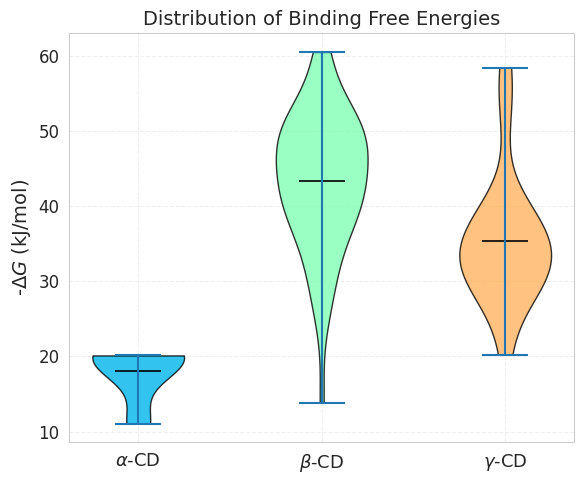

In [100]:
# --- Data ---
acd_dG = [-x[1] for x in acd_data]
bcd_dG = [-x[1] for x in bcd_data]
gcd_dG = [-x[1] for x in gcd_data]

acd_ddG = [-x[2] for x in acd_data]
bcd_ddG = [-x[2] for x in bcd_data]
gcd_ddG = [-x[2] for x in gcd_data]

# Combine for plotting
data = [acd_dG, bcd_dG, gcd_dG]
labels = [r'$\alpha$-CD', r'$\beta$-CD', r'$\gamma$-CD']

# Rainbow color palette
colors = sns.color_palette("rainbow", n_colors=len(data))

# --- Violin plot ---
fig, ax = plt.subplots(figsize=(6, 5), dpi=100)
parts = ax.violinplot(data, showmeans=True, showmedians=False)

# Apply custom rainbow colors
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_edgecolor('black')
    pc.set_alpha(0.8)

# Mean marker style
for partname in ('cmeans',):
    vp = parts[partname]
    vp.set_edgecolor('black')
    vp.set_linewidth(1.2)

# Labels and styling
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, fontsize=13)
ax.set_ylabel(r'-$\Delta G$ (kJ/mol)', fontsize=14)
ax.set_title('Distribution of Binding Free Energies', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
# plt.savefig("violin_dG_rainbow.png", dpi=600)
plt.show()

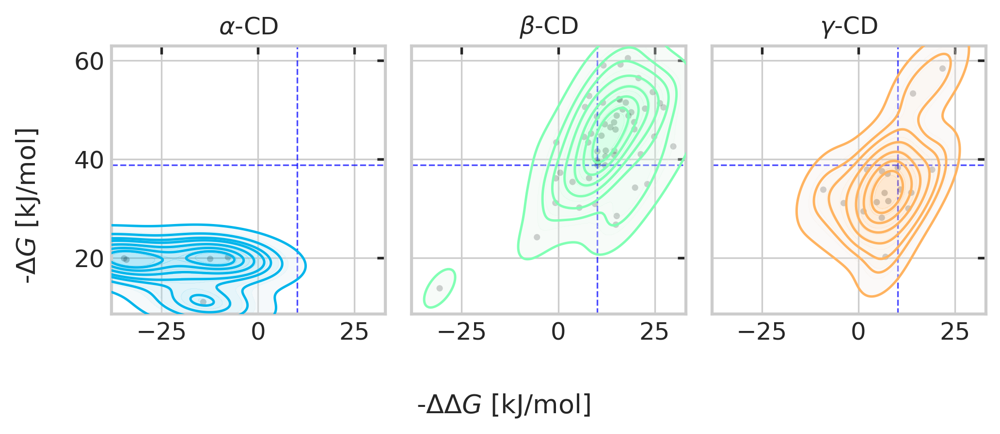

In [101]:
# --- Data ---
groups = {
    r'$\alpha$-CD': (np.array(acd_ddG), np.array(acd_dG)),
    r'$\beta$-CD':  (np.array(bcd_ddG), np.array(bcd_dG)),
    r'$\gamma$-CD': (np.array(gcd_ddG), np.array(gcd_dG)),
}

# Common axis limits with a small margin
all_x = np.concatenate([v[0] for v in groups.values()])
all_y = np.concatenate([v[1] for v in groups.values()])
xpad = 0.05 * (all_x.max() - all_x.min() + 1e-9)
ypad = 0.05 * (all_y.max() - all_y.min() + 1e-9)
xlim = (all_x.min() - xpad, all_x.max() + xpad)
ylim = (all_y.min() - ypad, all_y.max() + ypad)

# Rainbow colors per group
colors = sns.color_palette("rainbow", n_colors=len(groups))

fig, axes = plt.subplots(1, 3, figsize=(7, 3), dpi=300, sharex=True, sharey=True)

for (label, (x, y)), ax, c in zip(groups.items(), axes, colors):
    # Light scatter backdrop
    ax.scatter(x, y, s=10, alpha=0.25, color='k', edgecolors='none', zorder=1)

    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)

    # Filled KDE
    sns.kdeplot(
        x=x, y=y, ax=ax,
        fill=True, thresh=0.05, levels=12, cmap=sns.light_palette(c, as_cmap=True),
        bw_method='scott', # tweak if you want more/less smoothing
        zorder=2,
        alpha=0.3
    )
    # Contour lines on top
    sns.kdeplot(
        x=x, y=y, ax=ax,
        levels=8, color=c, linewidths=1.2, zorder=3
    )

    # Aesthetics
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    # ax.grid(True, linestyle='--', alpha=0.25)
    ax.set_title(label, fontsize=12)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    # Inner ticks for each subplot
    ax.tick_params(axis='both', direction='in', which='both', top=True, right=True, width=1.3, length=4)

# Shared labels
fig.supxlabel(r'-$\Delta\Delta G$ [kJ/mol]', fontsize=13)
fig.supylabel(r'-$\Delta G$ [kJ/mol]', fontsize=13)

plt.tight_layout()
# plt.savefig("kde_2d_dists_rainbow.png", dpi=600)
plt.show()

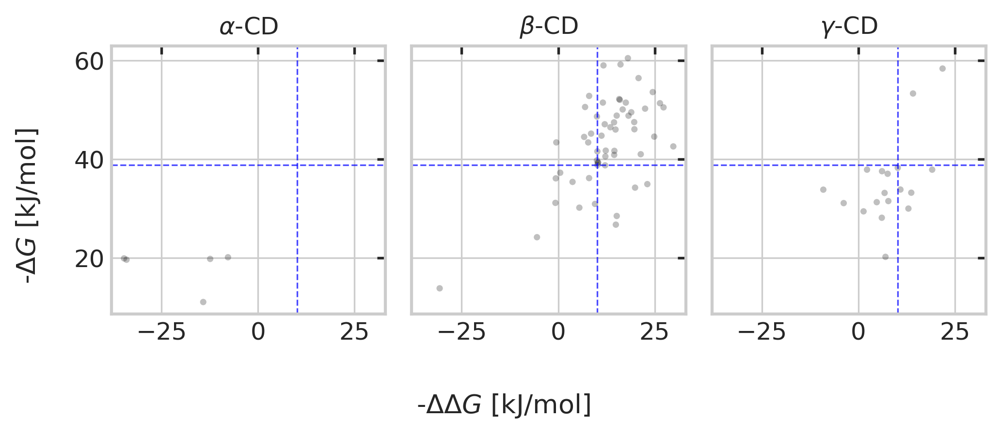

In [102]:
# --- Data ---
groups = {
    r'$\alpha$-CD': (np.array(acd_ddG), np.array(acd_dG)),
    r'$\beta$-CD':  (np.array(bcd_ddG), np.array(bcd_dG)),
    r'$\gamma$-CD': (np.array(gcd_ddG), np.array(gcd_dG)),
}

# Common axis limits with a small margin
all_x = np.concatenate([v[0] for v in groups.values()])
all_y = np.concatenate([v[1] for v in groups.values()])
xpad = 0.05 * (all_x.max() - all_x.min() + 1e-9)
ypad = 0.05 * (all_y.max() - all_y.min() + 1e-9)
xlim = (all_x.min() - xpad, all_x.max() + xpad)
ylim = (all_y.min() - ypad, all_y.max() + ypad)

# Rainbow colors per group
colors = sns.color_palette("rainbow", n_colors=len(groups))

fig, axes = plt.subplots(1, 3, figsize=(7, 3), dpi=300, sharex=True, sharey=True)

for (label, (x, y)), ax, c in zip(groups.items(), axes, colors):
    # Light scatter backdrop
    ax.scatter(x, y, s=10, alpha=0.25, color='k', edgecolors='none', zorder=1)

    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)

    # # Filled KDE
    # sns.kdeplot(
    #     x=x, y=y, ax=ax,
    #     fill=True, thresh=0.05, levels=12, cmap=sns.light_palette(c, as_cmap=True),
    #     bw_method='scott', # tweak if you want more/less smoothing
    #     zorder=2,
    #     alpha=0.3
    # )
    # # Contour lines on top
    # sns.kdeplot(
    #     x=x, y=y, ax=ax,
    #     levels=8, color=c, linewidths=1.2, zorder=3
    # )

    # Aesthetics
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    # ax.grid(True, linestyle='--', alpha=0.25)
    ax.set_title(label, fontsize=12)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    # Inner ticks for each subplot
    ax.tick_params(axis='both', direction='in', which='both', top=True, right=True, width=1.3, length=4)

# Shared labels
fig.supxlabel(r'-$\Delta\Delta G$ [kJ/mol]', fontsize=13)
fig.supylabel(r'-$\Delta G$ [kJ/mol]', fontsize=13)

plt.tight_layout()
# plt.savefig("kde_2d_dists_rainbow.png", dpi=600)
plt.show()

In [103]:
species_categories = {
    # Fluoroalkyl groups
    'C(F)(F)C(F)(F)F': 'fluoroalkyl',          # pentafluoroethyl
    'C(F)(F)F': 'fluoroalkyl',                 # trifluoromethyl
    'C(F)(F)C(F)(F)C(F)(F)F': 'fluoroalkyl',   # heptafluoropropyl
    'CF': 'fluoroalkyl',                      # fluoromethyl
    'OC(F)(F)C(F)(F)F': 'hydroxyfluoroalkyl',  # hydroxy-pentafluoroethyl
    'OCF': 'hydroxyfluoroalkyl',              # hydroxy-fluoromethyl

    # Haloalkyl groups
    'C(Cl)(Cl)Cl': 'chloroalkyl',                       # trichloromethyl
    'C(Cl)(Cl)C(Cl)(Cl)Cl': 'chloroalkyl',              # dichloro-dichloromethyl
    'C(Cl)(Cl)C(Cl)(Cl)C(Cl)(Cl)Cl': 'chloroalkyl',     # full chlorinated 3-carbon
    'C(Br)(Br)Br': 'bromoalkyl',                       # tribromomethyl
    'C(Br)(Br)C(Br)(Br)Br': 'bromoalkyl',              # 2-carbon, 6-bromo
    'C(Br)(Br)C(Br)(Br)C(Br)(Br)Br': 'bromoalkyl',     # 3-carbon, 9-bromo
    'CCl': 'chloroalkyl',                               # chloromethyl
    'CBr': 'bromoalkyl',                               # bromomethyl
    'CI': 'iodoalkyl',                                # iodomethyl
    'OCCl': 'hydroxychloroalkyl',                       # hydroxy-chloromethyl

    # Alkyl groups
    'C': 'alkyl',        # methyl
    'CC': 'alkyl',       # ethyl
    'CCC': 'alkyl',      # propyl

    # Ether groups
    'COC': 'ether',          # methoxymethyl
    'COCOC': 'ether',        # extended ether
    'COCOCOC': 'ether',      # further extended ether

    # Hydroxyalkyl groups
    'OC': 'hydroxyalkyl',    # hydroxymethyl

    # Halide ions
    '[F]': 'fluoride',
    '[Cl]': 'chloride',
    '[Br]': 'bromide',

    # Amines
    '[NH2]': 'amine',        # primary amine

    # Hydroxyl group
    '[OH]': 'hydroxyl',

    # Nitro group
    '[N+](=O)[O-]': 'nitro'
}

In [104]:
sample_labels = {}

for k in chem_space.keys():
    if chem_space[k]['ddG_md']:
        # print(chem_space[k]['primary'])
        grps = [species_categories[x] for x in chem_space[k]['primary']]
        
        if all(g == 'hydroxyl' for g in grps):
            sample_labels[k] = ['hydroxyl']
        else:
            non_hydroxyl = [g for g in grps if g != 'hydroxyl']
            sample_labels[k] = list(set(non_hydroxyl))  # remove duplicates if needed

        # print(f"{k}: {sample_labels[k]}")


fluoroalkyl: 11
Skip KDE
chloroalkyl: 4
Skip KDE
alkyl: 7
Skip KDE
ether: 3
Skip KDE
bromoalkyl: 2
Skip KDE
fluoride: 2
Skip KDE
chloride: 1
Skip KDE
hydroxyfluoroalkyl: 2
Skip KDE
hydroxyl: 0
Skip KDE
amine: 1
bromide: 0
hydroxychloroalkyl: 1


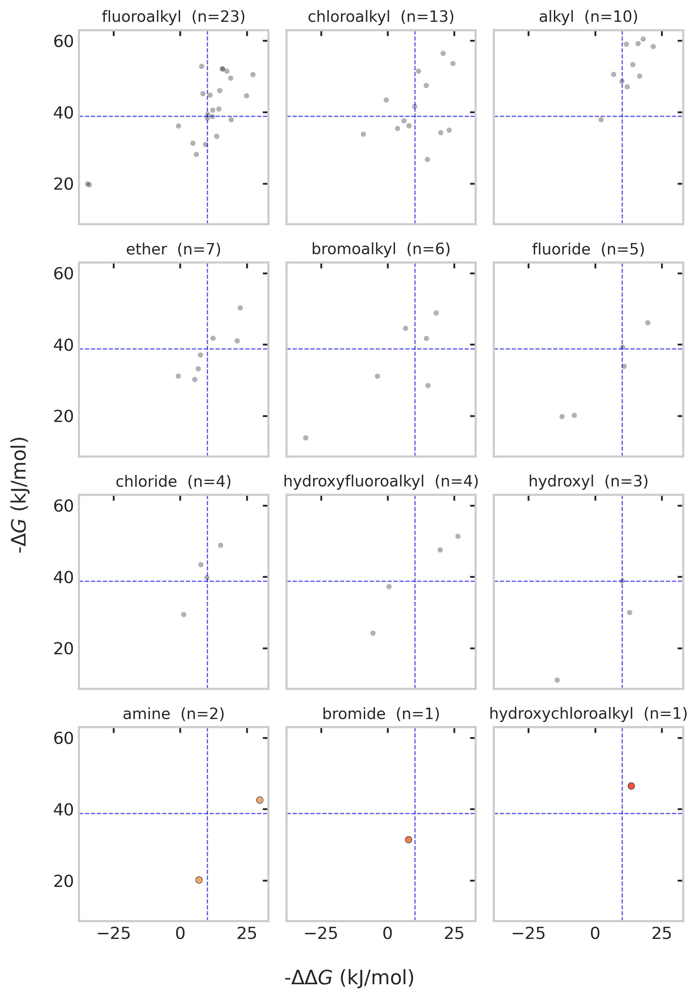

In [109]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

# --- Build per-species point sets ---
species_to_xy = {}
for k in chem_space.keys():
    if k in sample_labels and chem_space[k].get('ddG_md') and chem_space[k].get('dG_md'):
        x = -float(chem_space[k]['ddG_md'][0])  # -ΔΔG
        y = -float(chem_space[k]['dG_md'][0])   # -ΔG
        for lbl in sample_labels[k]:
            species_to_xy.setdefault(lbl, []).append((x, y))

# Sort species by number of candidates (desc), then name (asc) for tie-break
species_items = sorted(
    species_to_xy.items(),
    key=lambda kv: (-len(kv[1]), kv[0])
)
species_names = [name for name, _ in species_items]
m = len(species_names)
if m == 0:
    raise ValueError("No species with valid (dG, ddG) data found.")

# Global limits
all_x = np.array([x for _, pts in species_items for (x, _) in pts])
all_y = np.array([y for _, pts in species_items for (_, y) in pts])
def pad_limits(arr, frac=0.05):
    vmin, vmax = np.min(arr), np.max(arr)
    pad = frac * max(1e-9, (vmax - vmin))
    return (vmin - pad, vmax + pad)
xlim = pad_limits(all_x)
ylim = pad_limits(all_y)

# --- Figure layout: 3 columns, n rows ---
ncols = 3
nrows = math.ceil(m / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(7, 2.5*nrows), dpi=300, sharex=True, sharey=True)
axes = np.atleast_2d(axes)
axes_flat = axes.ravel()

# Rainbow colors in sorted order
colors = sns.color_palette("rainbow", n_colors=m)
color_map = {name: colors[i] for i, name in enumerate(species_names)}



for i, (name, pts) in enumerate(species_items):
    ax = axes_flat[i]
    ax.grid(False)
    pts = np.array(pts)
    x, y = pts[:, 0], pts[:, 1]
    c = color_map[name]

    # reference lines
    ax.axvline(-ddG_data['bcd'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)
    ax.axhline(-dG_data['bcd-pfos'][0], color='b', linestyle='--', linewidth=0.8, alpha=0.7)

    # count items for this species above both thresholds and print
    thresh_x = -ddG_data['bcd'][0]
    thresh_y = -dG_data['bcd-pfos'][0]
    cnt = int(np.sum((x > thresh_x) & (y > thresh_y)))
    print(f"{name}: {cnt}")

    # Light scatter backdrop
    ax.scatter(x, y, s=14, alpha=0.30, color='k', edgecolors='none', zorder=1)

    # KDE if enough spread, else colored scatter
    try:
        if len(x) >= 3 and np.std(x) > 1e-9 and np.std(y) > 1e-9:
            print('Skip KDE')
            # sns.kdeplot(
            #     x=x, y=y, ax=ax, fill=True, levels=12, thresh=0.02,
            #     cmap=sns.light_palette(c, as_cmap=True),
            #     bw_method='scott', zorder=2, alpha=0.3,
            # )
            # sns.kdeplot(
            #     x=x, y=y, ax=ax, levels=7, color=c, linewidths=1.1, zorder=3
            # )
        else:
            ax.scatter(x, y, s=22, alpha=0.8, color=c, edgecolors='k', linewidths=0.4, zorder=2)
    except Exception:
        ax.scatter(x, y, s=22, alpha=0.8, color=c, edgecolors='k', linewidths=0.4, zorder=2)

    # Aesthetics
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    ax.tick_params(axis='both', direction='in', which='both', top=True, right=True, width=1.3, length=4)
    ax.set_title(f"{name}  (n={len(x)})", fontsize=11)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)

# Turn off unused axes
for ax in axes_flat[m:]:
    ax.axis('off')

# Shared labels
fig.supxlabel(r'-$\Delta\Delta G$ (kJ/mol)', fontsize=14)
fig.supylabel(r'-$\Delta G$ (kJ/mol)', fontsize=14)

plt.tight_layout()


In [106]:
species_items

[('fluoroalkyl',
  [(-34.07275823781797, 19.63351289653677),
   (9.531742441333726, 30.938079106735017),
   (6.069935768663008, 28.13612308687931),
   (-34.711427504180286, 19.899168445848538),
   (27.29386740810415, 50.50763745854527),
   (19.12093073279004, 37.880463170118304),
   (13.704743398757408, 33.2147741777154),
   (8.020048989710638, 52.829795746894),
   (10.206327843063562, 38.26050457744686),
   (4.760356127574873, 31.292253030400957),
   (15.811581824321486, 52.19171488505847),
   (17.51896429518628, 51.473011101853785),
   (11.221181837487975, 44.76986097510054),
   (12.154979042238583, 38.76241972763255),
   (14.50769045847587, 40.878230596030036),
   (15.965596127688023, 52.030449986648954),
   (24.881429194211044, 44.577914004294335),
   (14.856208598160872, 46.01887208470046),
   (18.934051355063808, 49.51358873415698),
   (-0.6295950034449049, 36.12094557408629),
   (8.518910179491634, 45.1911109759251),
   (10.338511464799339, 39.35602579764595),
   (12.22439215069

In [112]:
from rdkit import Chem
from rdkit.Chem import Descriptors, Lipinski

In [113]:
def flexibility_entropy_proxy(smiles: str) -> dict:
    """
    Estimate a proxy for configurational entropy (flexibility) from a SMILES string.

    Returns individual descriptors + composite flexibility score.
    """
    mol = Chem.MolFromSmiles(smiles)
    mol = Chem.AddHs(mol)
    if mol is None:
        raise ValueError(f"Invalid SMILES: {smiles}")

    # Basic descriptors
    n_rot = Lipinski.NumRotatableBonds(mol)
    n_heavy = mol.GetNumHeavyAtoms()
    n_rings = Descriptors.RingCount(mol)
    n_hdon = Lipinski.NumHDonors(mol)
    n_hacc = Lipinski.NumHAcceptors(mol)
    n_chiral = len(Chem.FindMolChiralCenters(mol, includeUnassigned=True))

    # Simple flexibility proxy:
    # more rotatable bonds & fewer rings → more flexible
    # normalize roughly by size (heavy atoms)
    flex_score = (n_rot + 0.5 * n_hdon + 0.5 * n_hacc) / (1 + n_rings + 0.5 * n_chiral + 0.1 * n_heavy)

    return {
        "n_rotatable_bonds": n_rot,
        "n_heavy_atoms": n_heavy,
        "n_rings": n_rings,
        "n_H_donors": n_hdon,
        "n_H_acceptors": n_hacc,
        "n_chiral_centers": n_chiral,
        "flexibility_score": round(flex_score, 3)
    }



In [114]:
species_categories_list = list(species_categories.keys())
heavy_atom_dict = {}
for x in species_categories_list:
    # print(x, flexibility_entropy_proxy(x)['n_heavy_atoms'])
    heavy_atom_dict[x] = flexibility_entropy_proxy(x)['n_heavy_atoms']

np.mean([heavy_atom_dict[x] for x in chem_space[k]['primary']])
# heavy_atom_dict

2.75

In [115]:
# species_to_xy = {}
for k in chem_space.keys():
    if chem_space[k].get('ddG_md') and chem_space[k].get('dG_md'):
        x = -float(chem_space[k]['ddG_md'][0])  # -ΔΔG
        y = -float(chem_space[k]['dG_md'][0])   # -ΔG
        mean_heavy = np.mean([heavy_atom_dict[x] for x in chem_space[k]['primary']])
        # for lbl in sample_labels[k]:
        #     species_to_xy.setdefault(lbl, []).append((x, y))

In [ ]:
chem_space['00123']['fingerprint_primary'].shape

(8, 1024)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
# === Extract and preprocess ===
X_prim = np.array([chem_space[key]['fingerprint_primary'].flatten() for key in chem_space])
cd_labels = [chem_space[key]['CD'] for key in chem_space]  # 'alpha', 'beta', 'gamma', etc.

# === Dimensionality reduction ===
pca = PCA(n_components=20, random_state=42)
X_pca = pca.fit_transform(X_prim)

tsne = TSNE(n_components=2, perplexity=100, random_state=42, n_iter=10000)
X_tsne = tsne.fit_transform(X_pca)

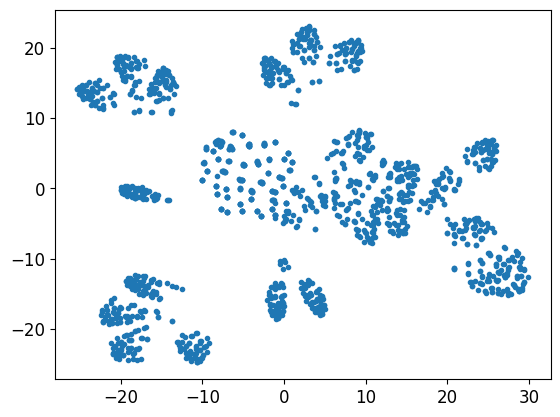

In [ ]:

plt.scatter(X_tsne[:,0],X_tsne[:,1],marker='.')

In [ ]:
sample_labels_all = {}

for k in chem_space.keys():
    grps = [species_categories[x] for x in chem_space[k]['primary']]
    
    if all(g == 'hydroxyl' for g in grps):
        sample_labels_all[k] = ['hydroxyl']
    else:
        non_hydroxyl = [g for g in grps if g != 'hydroxyl']
        sample_labels_all[k] = list(set(non_hydroxyl))  # remove duplicates if needed

        # print(f"{k}: {sample_labels[k]}")


species_to_xy_all = {}
for i,k in enumerate(chem_space.keys()):
    # if k in sample_labels and chem_space[k].get('ddG_md') and chem_space[k].get('dG_md'):
        # x = -float(chem_space[k]['ddG_md'][0])  # -ΔΔG
        # y = -float(chem_space[k]['dG_md'][0])   # -ΔG
    tnse_i = X_tsne[i]
    for lbl in sample_labels_all[k]:
        species_to_xy_all.setdefault(lbl, []).append((tnse_i[0],tnse_i[1]))

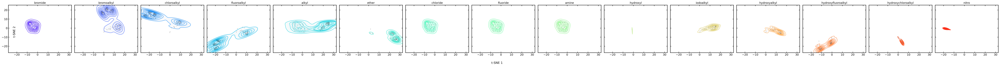

In [ ]:
# --- Data prep ---
groups = {lbl: np.array(pts) for lbl, pts in species_to_xy_all.items() if len(pts) > 1}

# Common axis limits with a small margin
all_x = np.concatenate([v[:,0] for v in groups.values()])
all_y = np.concatenate([v[:,1] for v in groups.values()])
xpad = 0.05 * (all_x.max() - all_x.min() + 1e-9)
ypad = 0.05 * (all_y.max() - all_y.min() + 1e-9)
xlim = (all_x.min() - xpad, all_x.max() + xpad)
ylim = (all_y.min() - ypad, all_y.max() + ypad)

# --- Plot ---
colors = sns.color_palette("rainbow", n_colors=len(groups))
fig, axes = plt.subplots(1, len(groups), figsize=(4*len(groups), 4), dpi=300, sharex=True, sharey=True)

if len(groups) == 1:
    axes = [axes]

for (label, xy), ax, c in zip(groups.items(), axes, colors):
    x, y = xy[:,0], xy[:,1]

    # scatter background
    ax.scatter(x, y, s=10, alpha=0.25, color='k', edgecolors='none', zorder=1)

    # KDE filled
    sns.kdeplot(
        x=x, y=y, ax=ax,
        fill=True, thresh=0.05, levels=12,
        cmap=sns.light_palette(c, as_cmap=True),
        bw_method='scott', alpha=0.3, zorder=2
    )

    # contour lines
    sns.kdeplot(
        x=x, y=y, ax=ax,
        levels=8, color=c, linewidths=1.2, zorder=3
    )

    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    ax.set_title(label, fontsize=12)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.tick_params(axis='both', direction='in', which='both', top=True, right=True, width=1.3, length=4)

# shared labels
fig.supxlabel("t-SNE 1", fontsize=13)
fig.supylabel("t-SNE 2", fontsize=13)

plt.tight_layout()
plt.show()


In [ ]:
label

'nitro'

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


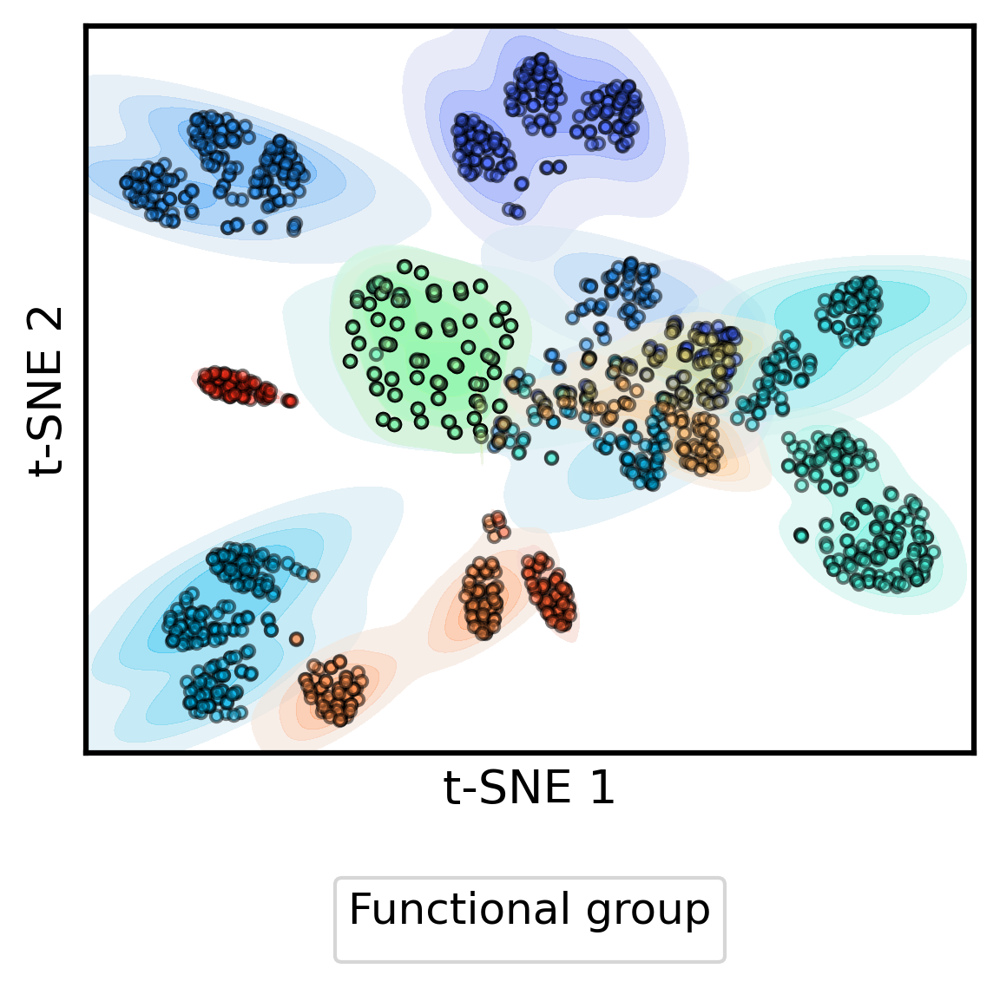

<Figure size 640x480 with 0 Axes>

In [ ]:
# --- Plot ---
colors = sns.color_palette("rainbow", n_colors=len(groups))
fig, ax = plt.subplots(figsize=(4,4), dpi=300)


# KDEs and contours for each group
for (label, xy), c in zip(groups.items(), colors):
    x, y = xy[:,0], xy[:,1]

    sns.kdeplot(
        x=x, y=y, ax=ax,
        fill=True, thresh=0.1, levels=5,
        cmap=sns.light_palette(c, as_cmap=True),
        bw_method='scott', alpha=0.6, zorder=1, label=label
    )
    # sns.kdeplot(
    #     x=x, y=y, ax=ax,
    #     levels=5, color=c, linewidths=0.3, zorder=1,
    #     label=label
    # )

# Light scatter backdrop (all points)
for xy, c in zip(groups.values(), colors):
    ax.scatter(xy[:,0], xy[:,1], s=10, alpha=0.5, color=c, edgecolors='k', zorder=2)

# Aesthetics
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.set_xlim(*xlim)
ax.set_ylim(*ylim)
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True, width=1.3, length=4)
ax.set_xlabel("t-SNE 1", fontsize=13)
ax.set_ylabel("t-SNE 2", fontsize=13)
# ax.set_title("t-SNE Chemical Space by Functional Group", fontsize=14)
ax.legend(title="Functional group", frameon=True, fontsize=9, loc="best")

ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])

# Legend below the plot
legend = ax.legend(
    title="Functional group",
    frameon=True,
    fontsize=9,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.15),
    ncol=3,             # adjust number of columns as needed
    handletextpad=0.5,
    columnspacing=1.0,
)

plt.tight_layout()
plt.show()

plt.tight_layout()
plt.show()

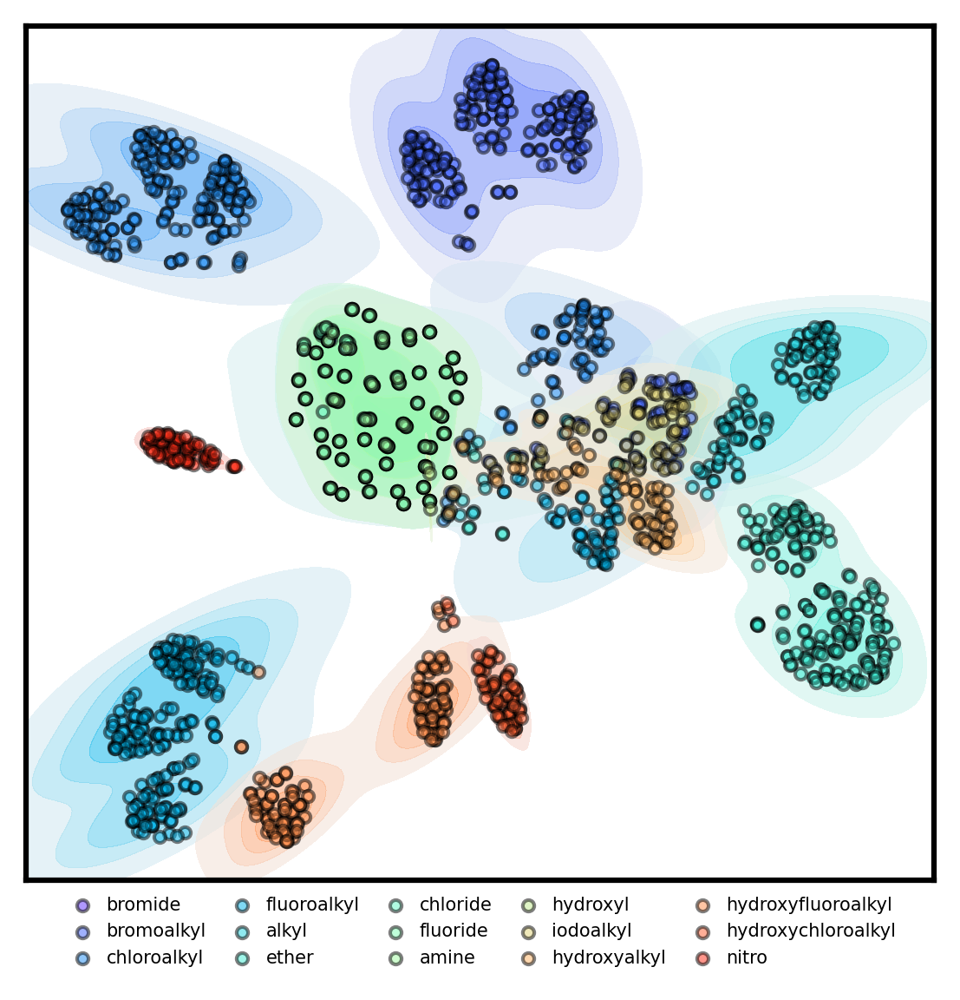

In [ ]:
# --- Plot ---
colors = sns.color_palette("rainbow", n_colors=len(groups))
fig, ax = plt.subplots(figsize=(4,4), dpi=300)

# KDEs (no labels, just visual density)
for (label, xy), c in zip(groups.items(), colors):
    x, y = xy[:,0], xy[:,1]
    sns.kdeplot(
        x=x, y=y, ax=ax,
        fill=True, thresh=0.1, levels=5,
        cmap=sns.light_palette(c, as_cmap=True),
        bw_method='scott', alpha=0.6, zorder=1,
    )

# Scatter with labels for legend
for (label, xy), c in zip(groups.items(), colors):
    ax.scatter(
        xy[:,0], xy[:,1],
        s=10, alpha=0.5, color=c, edgecolors='k', zorder=2,
        label=label,   # this line ensures legend picks it up
    )

# Aesthetics
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# Remove ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.tick_params(axis='both', which='both', length=0)

# No axis labels
ax.set_xlabel("")
ax.set_ylabel("")

# Legend below the plot
legend = ax.legend(
    # title="Functional group",
    frameon=False,
    fontsize=5,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.0),  # move down slightly
    ncol=5,                       # adjust for number of groups
    handletextpad=0.3,
    columnspacing=1.0,
)

plt.tight_layout()
plt.show()

